In [133]:

import numpy as np
import scanpy as sc
import scipy
from scipy.sparse import csr_matrix
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
#from composition_stats import clr
import anndata as ad
import scirpy as ir
import sys


In [2]:
!pip install git+https://github.com/gtca/muon.git


  Cloning https://github.com/gtca/muon.git to c:\users\okatk\appdata\local\temp\pip-req-build-r76n56gl
  Resolved https://github.com/gtca/muon.git to commit 6192f7698d8f3eca39412cd63699ef0b6a927d64
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/gtca/muon.git 'C:\Users\okatk\AppData\Local\Temp\pip-req-build-r76n56gl'


In [3]:
!pip install fastcluster

In [4]:
sys.path.append(r'C:\Users\okatk\Downloads\pyWNN-main')  


In [5]:
import pyWNN


In [6]:
import muon as mu



C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\okatk\AppData\Local\Programs\Python\Python3

In [134]:
help(ir)

Help on package scirpy:

NAME
    scirpy - Python library for single-cell adaptive immune receptor repertoire (AIRR) analysis

PACKAGE CONTENTS
    _compat
    _metadata
    datasets (package)
    get (package)
    io (package)
    ir_dist (package)
    pl (package)
    pp (package)
    tests (package)
    tl (package)
    util (package)

VERSION
    0.13.0rc1

FILE
    c:\users\okatk\appdata\local\programs\python\python311\lib\site-packages\scirpy\__init__.py




In [8]:
!dir

 Volume in drive C is Windows
 Volume Serial Number is CAD3-AF8B

 Directory of C:\Users\okatk\Drexel

08/23/2023  08:26 AM    <DIR>          .
08/16/2023  10:33 AM    <DIR>          ..
08/21/2023  11:06 AM    <DIR>          .ipynb_checkpoints
08/14/2023  05:51 PM         3,483,376 aligned_protein.h5ad
08/15/2023  07:48 PM           165,575 clone_data_with_clone_id.csv
08/15/2023  07:44 PM            95,532 clone_ratings_data.csv
08/21/2023  10:38 AM            21,052 clone_sizes.csv
08/16/2023  02:06 PM           472,450 correct protein analysis.ipynb
08/21/2023  10:48 AM           110,985 filtered_clone_sizes.csv
08/09/2023  12:09 PM    <DIR>          myenv
08/14/2023  12:46 PM        96,130,670 new_protein.h5ad
08/14/2023  12:48 PM        11,169,364 new_qc_protein.h5ad
08/21/2023  10:41 AM           110,985 ordered_clone_sizes.csv
08/21/2023  11:05 AM             2,500 ordered_selected_clone_sizes.csv
08/16/2023  11:35 AM           206,029 Protein Data Analysis-Copy1.ipynb
08/22/202

In [135]:
# load in everything, perform batch correction with harmony and the normal qc from scirpy

file_list = [
     ir.io.read_10x_vdj(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\filtered_contig_annotations_lib_1.csv"), 
     ir.io.read_10x_vdj(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\filtered_contig_annotations_lib_2.csv"), 
     ir.io.read_10x_vdj(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\filtered_contig_annotations_lib_3.csv")
]
# 14206, 15031, 14752

#labels = 14206*["lib1"] +  15031* ["lib2"]+ 14752*["lib3"]
new_l = []
for index in range(len(file_list)):
    adata = file_list[index]
    adata.obs["batch"] = "lib_" + str(index)
    new_l.append(adata)
    


In [10]:
tcr_concat = ad.concat(new_l, merge="same")
# add batch labels
tcr_concat.obs_names_make_unique()
# now TCR qc
ir.pp.index_chains(tcr_concat) # only needs airr
ir.tl.chain_qc(tcr_concat) # only needs airr

print(tcr_concat.obs.receptor_subtype)
#raise Error
# further tcr qc
mu.pp.filter_obs(tcr_concat, "chain_pairing", lambda x: x != "multichain")
mu.pp.filter_obs(tcr_concat, "chain_pairing", lambda x: ~np.isin(x, ["orphan VDJ", "orphan VJ"]))
# it would appear that batch correction is ill-posed here.
# basic dim reduction for each modality
# sc.pp.pca(tcr_concat)
# # batch correction
# sce.pp.harmony_integrate(tcr_concat, 'batch') 
# then save it in same manner as other modalities
tcr_concat.write_h5ad(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\correct_tcr.h5ad")

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


  0%|          | 0/43989 [00:00<?, ?it/s]

cell_id
AAACCTGAGACTAAGT-1      TRA+TRB
AAACCTGAGAGGGATA-1      TRA+TRB
AAACCTGAGCAATCTC-1      TRA+TRB
AAACCTGAGCCCAGCT-1      TRA+TRB
AAACCTGAGCTCCTCT-1      TRA+TRB
                         ...   
TTTGTCAGTGAAAGAG-1      TRA+TRB
TTTGTCAGTGAAGGCT-1      TRA+TRB
TTTGTCATCACGATGT-1      TRA+TRB
TTTGTCATCCACTGGG-1      TRA+TRB
TTTGTCATCTTGGGTA-1-1    TRA+TRB
Name: receptor_subtype, Length: 43989, dtype: object


In [11]:
print(tcr_concat.obs.receptor_subtype.unique())

['TRA+TRB']
Categories (1, object): ['TRA+TRB']


In [12]:
help(ir)


Help on package scirpy:

NAME
    scirpy - Python library for single-cell adaptive immune receptor repertoire (AIRR) analysis

PACKAGE CONTENTS
    _compat
    _metadata
    datasets (package)
    get (package)
    io (package)
    ir_dist (package)
    pl (package)
    pp (package)
    tests (package)
    tl (package)
    util (package)

VERSION
    0.13.0rc1

FILE
    c:\users\okatk\appdata\local\programs\python\python311\lib\site-packages\scirpy\__init__.py




In [13]:
# load in files 
file_list = [
    sc.read_h5ad(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\correct_rna.h5ad"),
    sc.read_h5ad(r"C:\Users\okatk\OneDrive - Tredyffrin Easttown School District\Drexel Research\correct_tcr.h5ad"),
    sc.read_h5ad("prot_5.h5ad"),
   
]
for adata in file_list:
    try:
        adata.uns['log1p']["base"] = None 
    except:
        pass
# fill out the mudata object
mdata = mu.MuData({"gex": file_list[0],  
                   "airr": file_list[1],
                   "prot": file_list[2],
                  })

mdata["gex"], mdata["airr"], mdata["prot"]

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:479: UserWarning: obs_names are not unique. To make them unique, call `.obs_names_make_unique`.
  warnings.warn(


(AnnData object with n_obs × n_vars = 47024 × 28608
     obs: 'TotalSeq-C0251 anti-human Hashtag 1 Antibody', 'TotalSeq-C0252 anti-human Hashtag 2 Antibody', 'TotalSeq-C0253 anti-human Hashtag 3 Antibody', 'TotalSeq-C0254 anti-human Hashtag 4 Antibody', 'TotalSeq-C0255 anti-human Hashtag 5 Antibody', 'TotalSeq-C0256 anti-human Hashtag 6 Antibody', 'TotalSeq-C0257 anti-human Hashtag 7 Antibody', 'TotalSeq-C0258 anti-human Hashtag 8 Antibody', 'TotalSeq-C0259 anti-human Hashtag 9 Antibody', 'TotalSeq-C0260 anti-human Hashtag 10 Antibody', 'TotalSeq-C0262 anti-human Hashtag 12 Antibody', 'TotalSeq-C0263 anti-human Hashtag 13 Antibody', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
     var: 'gene_ids', 'featu

In [14]:
# Get the number of cells in the 'prot' data
num_cells_prot = mdata["prot"].shape[0]

print(f"Number of cells in the 'prot' data (before common_cells step): {num_cells_prot}")


Number of cells in the 'prot' data (before common_cells step): 59611


In [15]:
mdata["airr"].obs.receptor_subtype

cell_id
AAACCTGAGACTAAGT-1      TRA+TRB
AAACCTGAGCAATCTC-1      TRA+TRB
AAACCTGAGCCCAGCT-1      TRA+TRB
AAACCTGAGCTCCTCT-1      TRA+TRB
AAACCTGAGGACGAAA-1      TRA+TRB
                         ...   
TTTGTCAGTGAAAGAG-1      TRA+TRB
TTTGTCAGTGAAGGCT-1      TRA+TRB
TTTGTCATCACGATGT-1      TRA+TRB
TTTGTCATCCACTGGG-1      TRA+TRB
TTTGTCATCTTGGGTA-1-1    TRA+TRB
Name: receptor_subtype, Length: 40077, dtype: category
Categories (1, object): ['TRA+TRB']

In [16]:
airr_cell_ids = set(mdata["airr"].obs.index)
gex_cell_ids = set(mdata["gex"].obs.index)
prot_cell_ids = set(mdata["prot"].obs.index)

In [17]:
len(airr_cell_ids)

40077

In [18]:
len(gex_cell_ids)

47024

In [19]:
len(prot_cell_ids)

58018

In [20]:
len(airr_cell_ids), len(gex_cell_ids), len(prot_cell_ids)

(40077, 47024, 58018)

In [21]:
# check if there are cell barcodes that exist in airr and not in gex
#len(airr_cell_ids - gex_cell_ids), len(prot_cell_ids - gex_cell_ids), len(prot_cell_ids - airr_cell_ids), len(airr_cell_ids - prot_cell_ids)
# check if there are cell barcodes that exist in prot and not in gex
len(gex_cell_ids - airr_cell_ids)
# check if there are cell barcodes that exist in prot and not in airr

21596

In [136]:
mdata

MuData object with n_obs × n_vars = 77230 × 28757
  3 modalities
    gex:	47024 x 24851
      obs:	'TotalSeq-C0251 anti-human Hashtag 1 Antibody', 'TotalSeq-C0252 anti-human Hashtag 2 Antibody', 'TotalSeq-C0253 anti-human Hashtag 3 Antibody', 'TotalSeq-C0254 anti-human Hashtag 4 Antibody', 'TotalSeq-C0255 anti-human Hashtag 5 Antibody', 'TotalSeq-C0256 anti-human Hashtag 6 Antibody', 'TotalSeq-C0257 anti-human Hashtag 7 Antibody', 'TotalSeq-C0258 anti-human Hashtag 8 Antibody', 'TotalSeq-C0259 anti-human Hashtag 9 Antibody', 'TotalSeq-C0260 anti-human Hashtag 10 Antibody', 'TotalSeq-C0262 anti-human Hashtag 12 Antibody', 'TotalSeq-C0263 anti-human Hashtag 13 Antibody', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden', 'S_score', 'G2M_score', 'phase', 'clone_id', 'group', 'bin', 'n_genes', 'louvain', 'groups'
      var:	'gene_ids', 'feature_types', 'n_counts', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'mean', 'std'
      uns:	'log1p', 'neighbors', 'pca', 'hvg', 'leiden', 'umap', 'leiden_colors', 'Thaw_colors', 'phase_colors', 'louvain', 'louvain_colors'
      obsm:	'X_pca', 'X_pca_harmony', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'
    airr:	40077 x 0
      obs:	'high_confidence', 'is_cell', 'batch', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size', 'Thaw', 'predominant_thaw', 'derived_donor'
      uns:	'chain_indices', 'ir_dist_nt_identity', 'clone_id', 'clonotype_network'
      obsm:	'airr', 'chain_indices', 'X_clonotype_network'
    prot:	59611 x 149
      obs:	'batch', 'percent_mito', 'n_counts', 'n_features', 'louvain', 'Thaw'
      var:	'gene_ids', 'feature_types', 'mean', 'std'
      uns:	'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'Thaw_colors'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'

  0%|          | 0/13524 [00:00<?, ?it/s]

Index(['gex:TotalSeq-C0251 anti-human Hashtag 1 Antibody',
       'gex:TotalSeq-C0252 anti-human Hashtag 2 Antibody',
       'gex:TotalSeq-C0253 anti-human Hashtag 3 Antibody',
       'gex:TotalSeq-C0254 anti-human Hashtag 4 Antibody',
       'gex:TotalSeq-C0255 anti-human Hashtag 5 Antibody',
       'gex:TotalSeq-C0256 anti-human Hashtag 6 Antibody',
       'gex:TotalSeq-C0257 anti-human Hashtag 7 Antibody',
       'gex:TotalSeq-C0258 anti-human Hashtag 8 Antibody',
       'gex:TotalSeq-C0259 anti-human Hashtag 9 Antibody',
       'gex:TotalSeq-C0260 anti-human Hashtag 10 Antibody',
       'gex:TotalSeq-C0262 anti-human Hashtag 12 Antibody',
       'gex:TotalSeq-C0263 anti-human Hashtag 13 Antibody',
       'gex:most_likely_hypothesis', 'gex:cluster_feature',
       'gex:negative_hypothesis_probability',
       'gex:singlet_hypothesis_probability',
       'gex:doublet_hypothesis_probability', 'gex:Classification', 'gex:Thaw',
       'gex:batch', 'gex:n_genes_by_counts', 'gex:total_cou

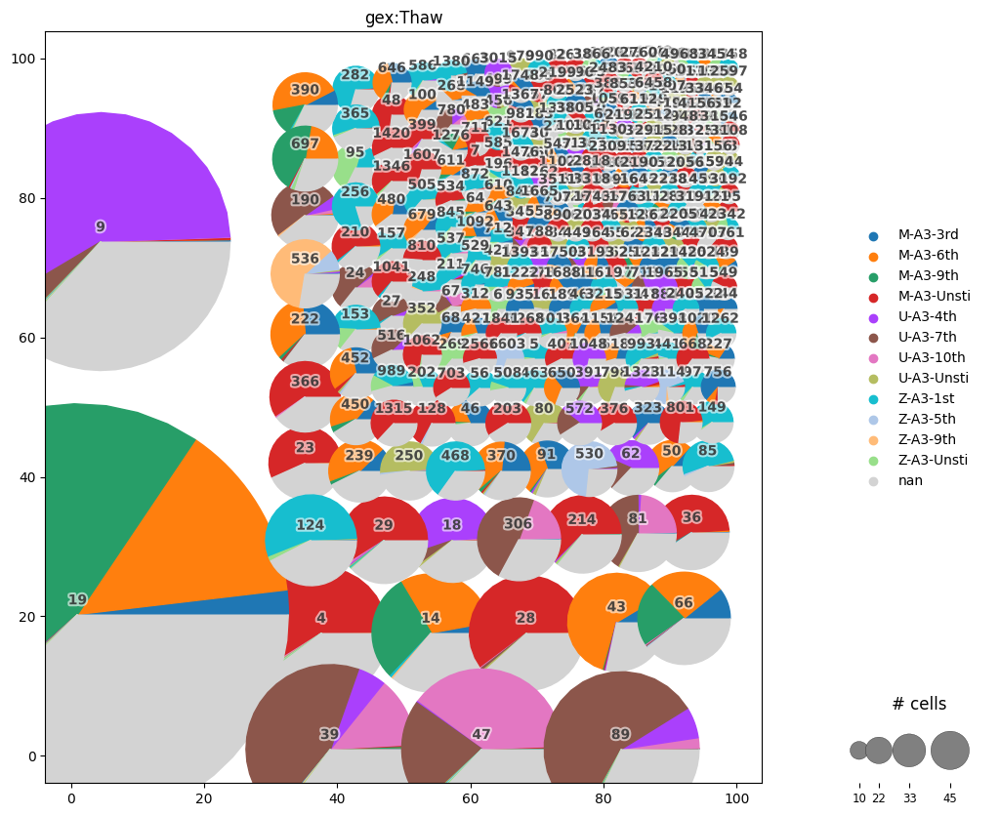

In [22]:
#080623 Task 1

# define clonotypes
# using default parameters, `ir_dist` will compute nucleotide sequence identity

ir.pp.ir_dist(mdata)
ir.tl.define_clonotypes(mdata, receptor_arms="all", dual_ir="primary_only")
ir.tl.clonotype_network(mdata, min_cells=10) #50, 100 is good
# we don't have source, just use sample labels here
ir.pl.clonotype_network( # color='Thaw'
    mdata,color='gex:Thaw') #, base_size=20, label_fontsize=9, panel_size=(7, 7)

print(mdata.obs.columns)

In [23]:
# Map the "Thaw" information from mdata["gex"].obs to mdata["airr"].obs
mdata["airr"].obs["Thaw"] = mdata["airr"].obs.index.map(mdata["gex"].obs["Thaw"])

# Check if the mapping was successful by displaying the first few rows of mdata["airr"].obs
mdata["airr"].obs.head()


,high_confidence,is_cell,batch,receptor_type,receptor_subtype,chain_pairing,clone_id,clone_id_size,Thaw
cell_id,,,,,,,,,
AAACCTGAGACTAAGT-1,True,True,lib_0,TCR,TRA+TRB,extra VJ,0,1,M-A3-3rd
AAACCTGAGCAATCTC-1,True,True,lib_0,TCR,TRA+TRB,extra VJ,1,5,M-A3-Unsti
AAACCTGAGCCCAGCT-1,True,True,lib_0,TCR,TRA+TRB,single pair,2,1,U-A3-Unsti
AAACCTGAGCTCCTCT-1,True,True,lib_0,TCR,TRA+TRB,extra VDJ,3,1,NaN
AAACCTGAGGACGAAA-1,True,True,lib_0,TCR,TRA+TRB,single pair,4,530,M-A3-Unsti


In [24]:
# Check for duplicates in the indices of mdata["prot"].obs and mdata["gex"].obs
prot_duplicates = mdata["prot"].obs.index[mdata["prot"].obs.index.duplicated()].unique()
gex_duplicates = mdata["gex"].obs.index[mdata["gex"].obs.index.duplicated()].unique()

prot_duplicates, gex_duplicates


(Index(['AAACCTGCAATACGCT-1', 'AAACGGGCAGGAATCG-1', 'AAAGCAATCATCGATG-1',
        'AAAGTAGAGTAATCCC-1', 'AAATGCCAGGAGTTTA-1', 'AAATGCCAGGGAACGG-1',
        'AAATGCCGTACCCAAT-1', 'AACACGTGTGCTGTAT-1', 'AACCATGGTGCTGTAT-1',
        'AACCATGTCGTCACGG-1',
        ...
        'TTGTAGGAGTATCGAA-1', 'TTGTAGGTCTTAGAGC-1', 'TTTACTGAGCAACGGT-1',
        'TTTATGCAGCCCTAAT-1', 'TTTATGCCAAGCCCAC-1', 'TTTCCTCAGTGTGAAT-1',
        'TTTGGTTGTCTGATTG-1', 'TTTGGTTGTTGCCTCT-1', 'TTTGTCAAGTTGTCGT-1',
        'TTTGTCATCTTGGGTA-1'],
       dtype='object', length=1582),
 Index([], dtype='object'))

In [25]:
# Map the "Thaw" information from mdata["gex"].obs to mdata["airr"].obs
mdata["prot"].obs["Thaw"] = mdata["prot"].obs.index.map(mdata["gex"].obs["Thaw"])

# Check if the mapping was successful by displaying the first few rows of mdata["airr"].obs
mdata["prot"].obs.head()

,batch,percent_mito,n_counts,n_features,louvain,Thaw
AAACCTGAGAAGCCCA-1,lib1,0.0,883.0,120,13,NaN
AAACCTGAGACTAAGT-1,lib1,0.0,1248.0,110,5,M-A3-3rd
AAACCTGAGAGAACAG-1,lib1,0.0,625.0,111,11,NaN
AAACCTGAGAGGGATA-1,lib1,0.0,1588.0,117,1,M-A3-6th
AAACCTGAGATACACA-1,lib1,0.0,1290.0,117,8,NaN


In [26]:
# Check if "Thaw" column is present in mdata["gex"].obs
print("Thaw" in mdata["gex"].obs.columns)




True


In [27]:
# Display the first few indices of mdata["prot"].obs and mdata["gex"].obs
print("First few indices of mdata['prot'].obs:")
print(mdata["prot"].obs.index[:10])
print("\nFirst few indices of mdata['gex'].obs:")
print(mdata["gex"].obs.index[:10])


First few indices of mdata['prot'].obs:
Index(['AAACCTGAGAAGCCCA-1', 'AAACCTGAGACTAAGT-1', 'AAACCTGAGAGAACAG-1',
       'AAACCTGAGAGGGATA-1', 'AAACCTGAGATACACA-1', 'AAACCTGAGATGTAAC-1',
       'AAACCTGAGCAATCTC-1', 'AAACCTGAGCCCAGCT-1', 'AAACCTGAGCTAACTC-1',
       'AAACCTGAGGACGAAA-1'],
      dtype='object')

First few indices of mdata['gex'].obs:
Index(['AAACCTGAGACTAAGT-1', 'AAACCTGAGAGGGATA-1', 'AAACCTGAGATGTAAC-1',
       'AAACCTGAGCAATCTC-1', 'AAACCTGAGCCCAGCT-1', 'AAACCTGAGCTAACTC-1',
       'AAACCTGAGGACGAAA-1', 'AAACCTGAGGCAGGTT-1', 'AAACCTGAGGTGTGGT-1',
       'AAACCTGAGTGAACAT-1'],
      dtype='object')


In [28]:
mdata.mod['airr'].obs.columns


Index(['high_confidence', 'is_cell', 'batch', 'receptor_type',
       'receptor_subtype', 'chain_pairing', 'clone_id', 'clone_id_size',
       'Thaw'],
      dtype='object')

  0%|          | 0/13524 [00:00<?, ?it/s]

Index(['gex:TotalSeq-C0251 anti-human Hashtag 1 Antibody',
       'gex:TotalSeq-C0252 anti-human Hashtag 2 Antibody',
       'gex:TotalSeq-C0253 anti-human Hashtag 3 Antibody',
       'gex:TotalSeq-C0254 anti-human Hashtag 4 Antibody',
       'gex:TotalSeq-C0255 anti-human Hashtag 5 Antibody',
       'gex:TotalSeq-C0256 anti-human Hashtag 6 Antibody',
       'gex:TotalSeq-C0257 anti-human Hashtag 7 Antibody',
       'gex:TotalSeq-C0258 anti-human Hashtag 8 Antibody',
       'gex:TotalSeq-C0259 anti-human Hashtag 9 Antibody',
       'gex:TotalSeq-C0260 anti-human Hashtag 10 Antibody',
       'gex:TotalSeq-C0262 anti-human Hashtag 12 Antibody',
       'gex:TotalSeq-C0263 anti-human Hashtag 13 Antibody',
       'gex:most_likely_hypothesis', 'gex:cluster_feature',
       'gex:negative_hypothesis_probability',
       'gex:singlet_hypothesis_probability',
       'gex:doublet_hypothesis_probability', 'gex:Classification', 'gex:Thaw',
       'gex:batch', 'gex:n_genes_by_counts', 'gex:total_cou

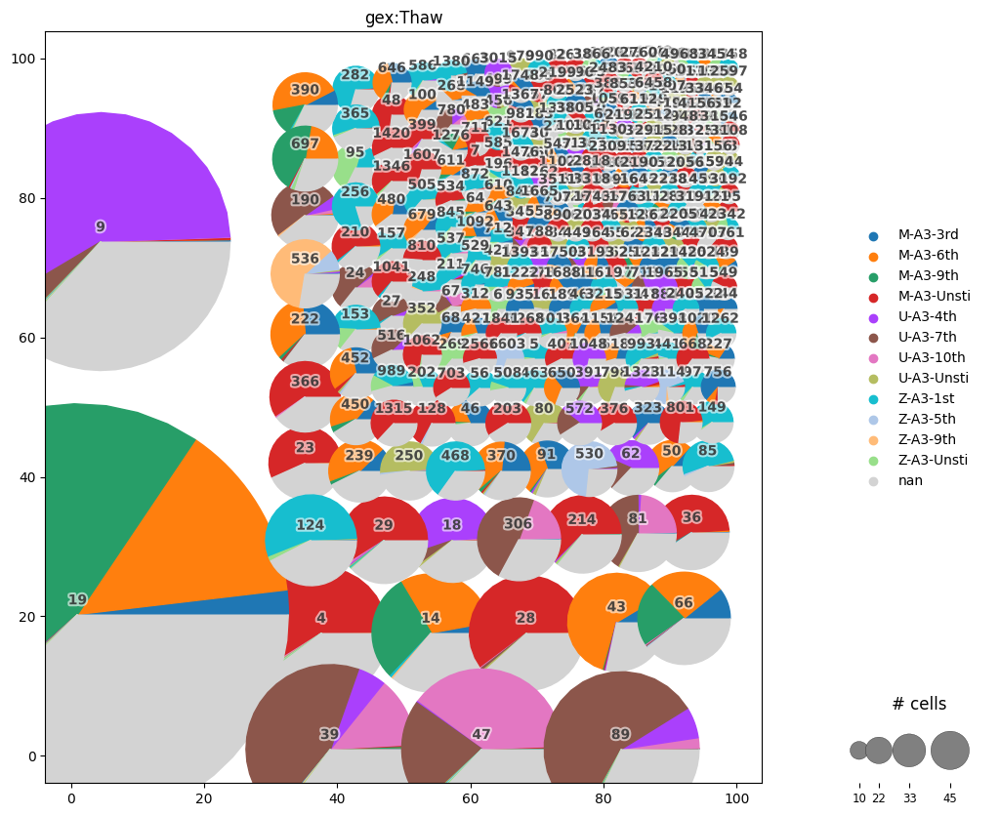

In [29]:
# Assuming mdata is your loaded and preprocessed AnnData object

# 1. Compute the immune repertoire distance
ir.pp.ir_dist(mdata)

# 2. Define clonotypes
ir.tl.define_clonotypes(mdata, receptor_arms="all", dual_ir="primary_only")

# 3. Compute the clonotype network
ir.tl.clonotype_network(mdata, min_cells=10) # Adjusting the min_cells parameter as needed

# 4. Visualize the clonotype network
ir.pl.clonotype_network(mdata, color='gex:Thaw') # Adjust visual parameters as needed

# 5. Print the observation column names
print(mdata.obs.columns)


In [30]:
mdata.obs.drop(columns=['predominant_donor'], inplace=True)


KeyError: "['predominant_donor'] not found in axis"

Observation names are unique.


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:479: UserWarning: obs_names are not unique. To make them unique, call `.obs_names_make_unique`.
  warnings.warn(


For donor M, unique obs names: False


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:479: UserWarning: obs_names are not unique. To make them unique, call `.obs_names_make_unique`.
  warnings.warn(


For donor Z, unique obs names: False


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:479: UserWarning: obs_names are not unique. To make them unique, call `.obs_names_make_unique`.
  warnings.warn(


For donor U, unique obs names: False
For donor nan, unique obs names: True


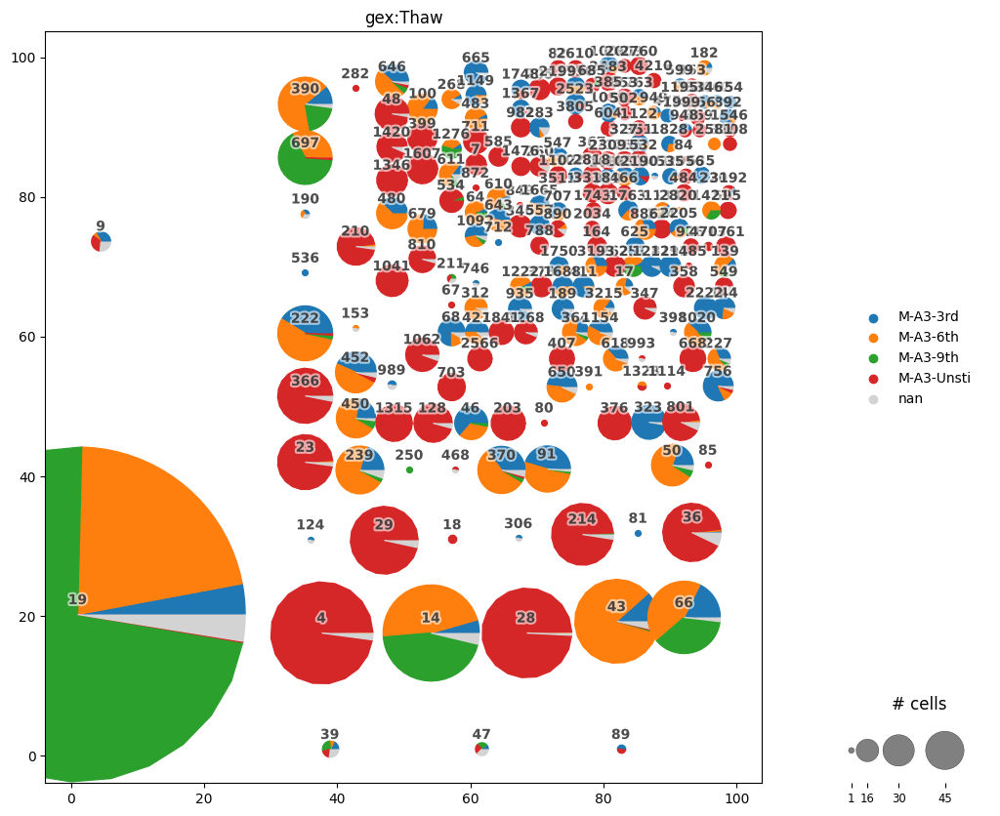

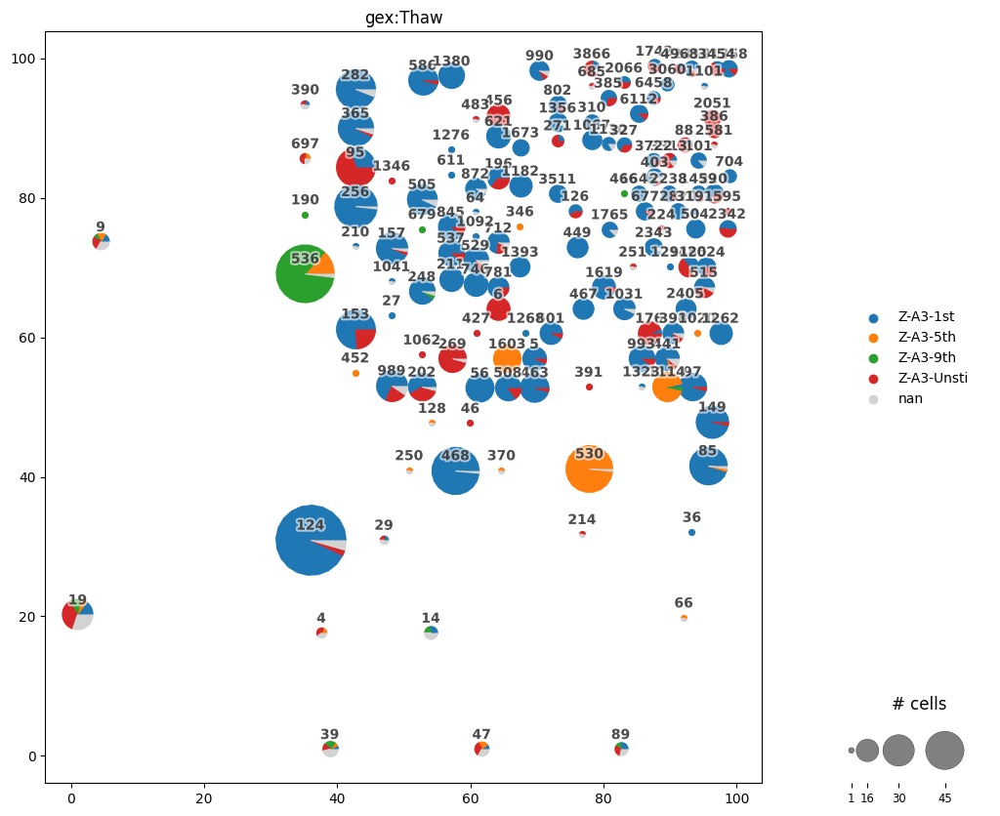

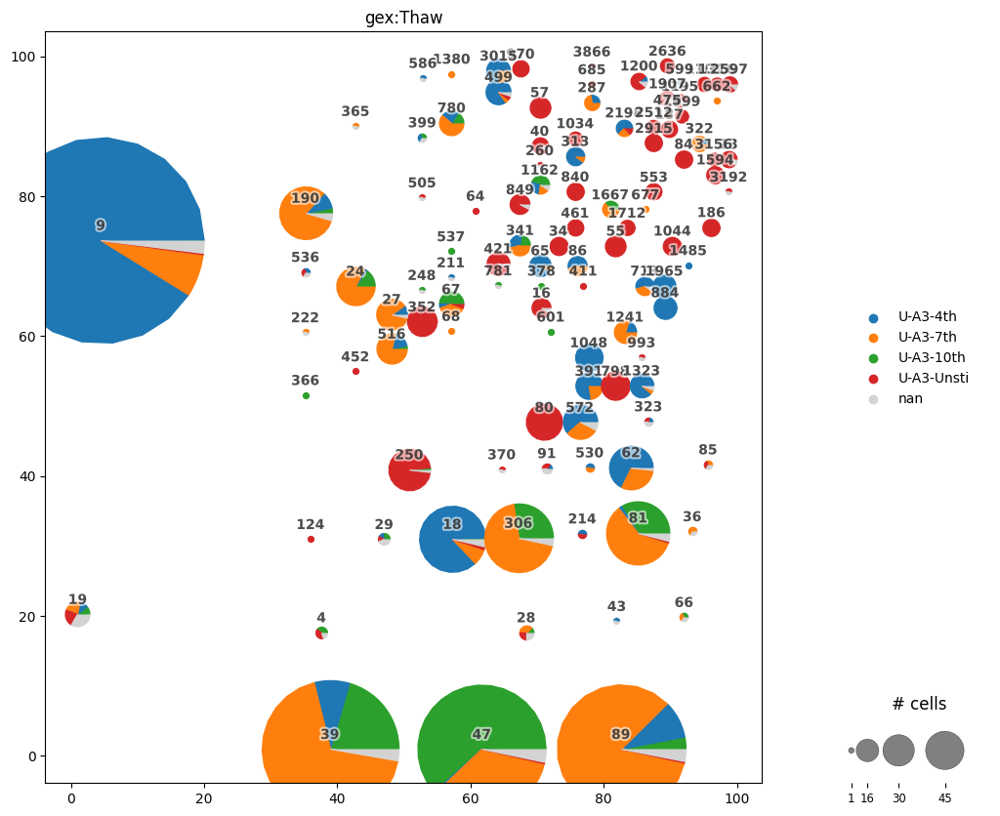

In [31]:
# Calculate the predominant donor for each clonotype
mdata.obs['donor'] = mdata["gex"].obs['Thaw'].apply(lambda x: x[0])

def get_predominant_donor(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

# Create a temporary DataFrame with unique airr:clone_id values and their corresponding predominant_donor
temp_df = mdata.obs.groupby('airr:clone_id')['donor'].agg(get_predominant_donor).reset_index()

# Merge the temporary DataFrame with mdata.obs on airr:clone_id
mdata.obs = mdata.obs.merge(temp_df, on='airr:clone_id', how='left', suffixes=('', '_predominant'))
mdata.obs.drop(columns=['donor_predominant'], inplace=True)
mdata.obs.rename(columns={'donor': 'predominant_donor'}, inplace=True)

# Check if observation names are unique
if mdata.obs.index.is_unique:
    print("Observation names are unique.")
else:
    print("Warning: Observation names are not unique.")

# Get the unique donors
donors = mdata.obs['predominant_donor'].unique()

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        subset = mdata[mdata.obs['predominant_donor'] == donor].copy()
        
        # Diagnose the subset operation
        print(f"For donor {donor}, unique obs names: {subset.obs.index.is_unique}")
        
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )


In [32]:
print(mdata.obs['predominant_donor'].head())


0    M
1    M
2    Z
3    M
4    U
Name: predominant_donor, dtype: object


In [33]:
# Check for uniqueness of observation names
if mdata.obs.index.is_unique:
    print("Observation names are unique.")
else:
    print("Warning: Observation names are not unique.")

# Get the unique donors from the 'predominant_donor' column
donors = mdata.obs['predominant_donor'].drop_duplicates().values

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        mask = mdata.obs['predominant_donor'] == donor
        subset = mdata[mask.values[:, 0]].copy()  # Use the first column of the boolean mask
        
        # Diagnose the subset operation
        print(f"For donor {donor}, unique obs names: {subset.obs.index.is_unique}")
        
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )


Observation names are unique.


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [34]:



# Manually enforce unique observation names
def make_obs_names_unique(obs_index):
    obs = pd.Series(obs_index)
    counts = obs.groupby(obs).count()
    duplicates = counts[counts > 1].index
    for dup in duplicates:
        idxs = obs[obs == dup].index
        for i, idx in enumerate(idxs, 1):
            obs.at[idx] = f"{dup}-{i}"
    return obs

mdata.obs.index = make_obs_names_unique(mdata.obs.index)

# Check for uniqueness of observation names
if mdata.obs.index.is_unique:
    print("Observation names are unique.")
else:
    print("Warning: Observation names are not unique.")

# Calculate the predominant donor for each clonotype
mdata.obs['donor'] = mdata["gex"].obs['Thaw'].apply(lambda x: x[0])

def get_predominant_donor(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

predominant_donor = mdata.obs.groupby('airr:clone_id')['donor'].agg(get_predominant_donor)

# Diagnostic print statements
print("Length of mdata.obs:", len(mdata.obs))
print("Unique airr:clone_id:", mdata.obs['airr:clone_id'].nunique())
print("Length of predominant_donor:", len(predominant_donor))

# Map the predominant donor to each cell
mdata.obs['predominant_donor'] = mdata.obs['airr:clone_id'].map(predominant_donor)

# Check if observation names are still unique after mapping
if mdata.obs.index.is_unique:
    print("Observation names remain unique after mapping.")
else:
    print("Warning: Observation names are no longer unique after mapping.")

# Get the unique donors
donors = mdata.obs['predominant_donor'].unique()

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        subset = mdata[mdata.obs['predominant_donor'] == donor].copy()
        
        # Diagnose the subset operation
        print(f"For donor {donor}, unique obs names: {subset.obs.index.is_unique}")
        
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )


Observation names are unique.
Length of mdata.obs: 77230
Unique airr:clone_id: 13524
Length of predominant_donor: 13524
Observation names remain unique after mapping.
For donor nan, unique obs names: True


In [132]:
import scirpy
print(scirpy.__version__)


0.13.0rc1


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


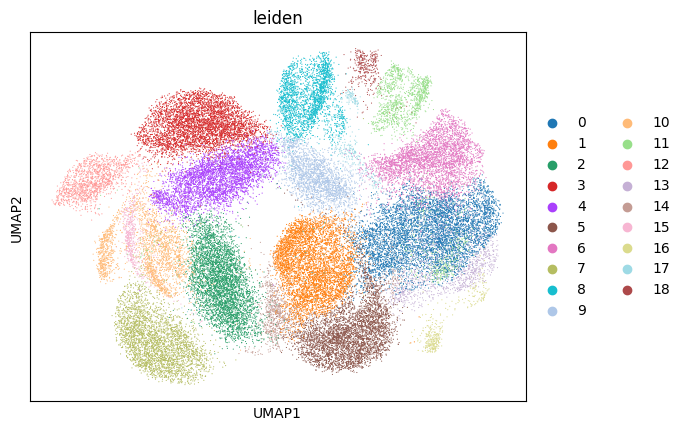

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


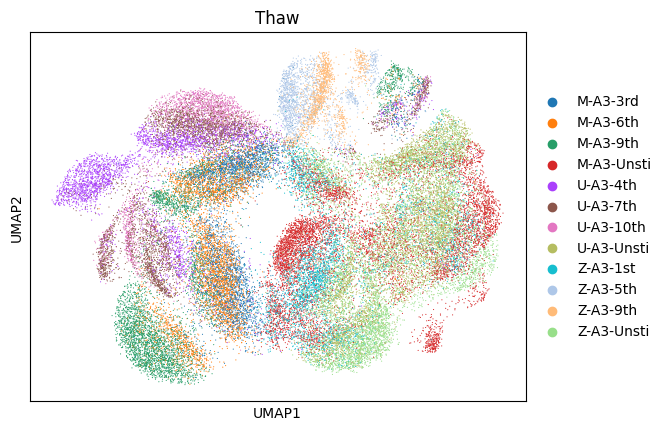

,TotalSeq-C0251 anti-human Hashtag 1 Antibody,TotalSeq-C0252 anti-human Hashtag 2 Antibody,TotalSeq-C0253 anti-human Hashtag 3 Antibody,TotalSeq-C0254 anti-human Hashtag 4 Antibody,TotalSeq-C0255 anti-human Hashtag 5 Antibody,TotalSeq-C0256 anti-human Hashtag 6 Antibody,TotalSeq-C0257 anti-human Hashtag 7 Antibody,TotalSeq-C0258 anti-human Hashtag 8 Antibody,TotalSeq-C0259 anti-human Hashtag 9 Antibody,TotalSeq-C0260 anti-human Hashtag 10 Antibody,...,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,leiden
AAACCTGAGACTAAGT-1,8,539,2,5,4,4,17,0,5,1,...,lib_0,1974,4723.0,102.0,2.159644,1070.0,22.655092,1.0,0.021173,2
AAACCTGAGAGGGATA-1,4,2,493,2,2,4,3,5,6,3,...,lib_0,1783,3275.0,98.0,2.992367,549.0,16.763359,0.0,0.000000,2
AAACCTGAGATGTAAC-1,8,11,6,4,15,2,13,3,434,6,...,lib_0,1768,4053.0,52.0,1.283000,914.0,22.551197,0.0,0.000000,1
AAACCTGAGCAATCTC-1,296,6,2,1,2,3,5,3,5,7,...,lib_0,2196,5400.0,101.0,1.870370,1152.0,21.333334,0.0,0.000000,1
AAACCTGAGCCCAGCT-1,6,1,2,1,479,2,4,3,8,1,...,lib_0,4400,16538.0,564.0,3.410328,3060.0,18.502842,3.0,0.018140,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCACGATGT-1,10,899,6,7,2,2,12,8,7,3,...,lib_2,1468,3355.0,85.0,2.533532,1047.0,31.207153,1.0,0.029806,2
TTTGTCATCCGCGTTT-1,4,1,5,2,8,7,438,5,5,1,...,lib_2,1054,1694.0,270.0,15.938607,108.0,6.375443,0.0,0.000000,3
TTTGTCATCCTACAGA-1,6,9,954,0,7,1,7,3,5,3,...,lib_2,1460,2804.0,486.0,17.332382,176.0,6.276748,0.0,0.000000,4
TTTGTCATCGTCTGCT-1,18,10,6,16,1524,6,21,8,15,12,...,lib_2,2627,5480.0,878.0,16.021898,497.0,9.069343,1.0,0.018248,6


In [35]:
# Extract GEX data from mdata
adata_gex = mdata['gex']


# Normalize, log-transform and compute PCA
sc.pp.normalize_total(adata_gex, target_sum=1e4)
sc.pp.log1p(adata_gex)
sc.pp.highly_variable_genes(adata_gex, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata_gex = adata_gex[:, adata_gex.var.highly_variable]
sc.pp.scale(adata_gex, max_value=10)
sc.tl.pca(adata_gex, svd_solver='arpack')

# 1. Compute the neighborhood graph
sc.pp.neighbors(adata_gex, n_neighbors=10, use_rep='X_pca')  # Adjust `n_neighbors` as necessary

# 2. Calculate Leiden clusters
sc.tl.leiden(adata_gex)

sc.tl.umap(adata_gex)

# 3. Visualize UMAP colored by Leiden clusters
sc.pl.umap(adata_gex, color=['leiden'])

# 4. If 'Thaw' is one of your observations and you want to color by that as well:
sc.pl.umap(adata_gex, color=['Thaw'])

adata_gex.obs


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: inv

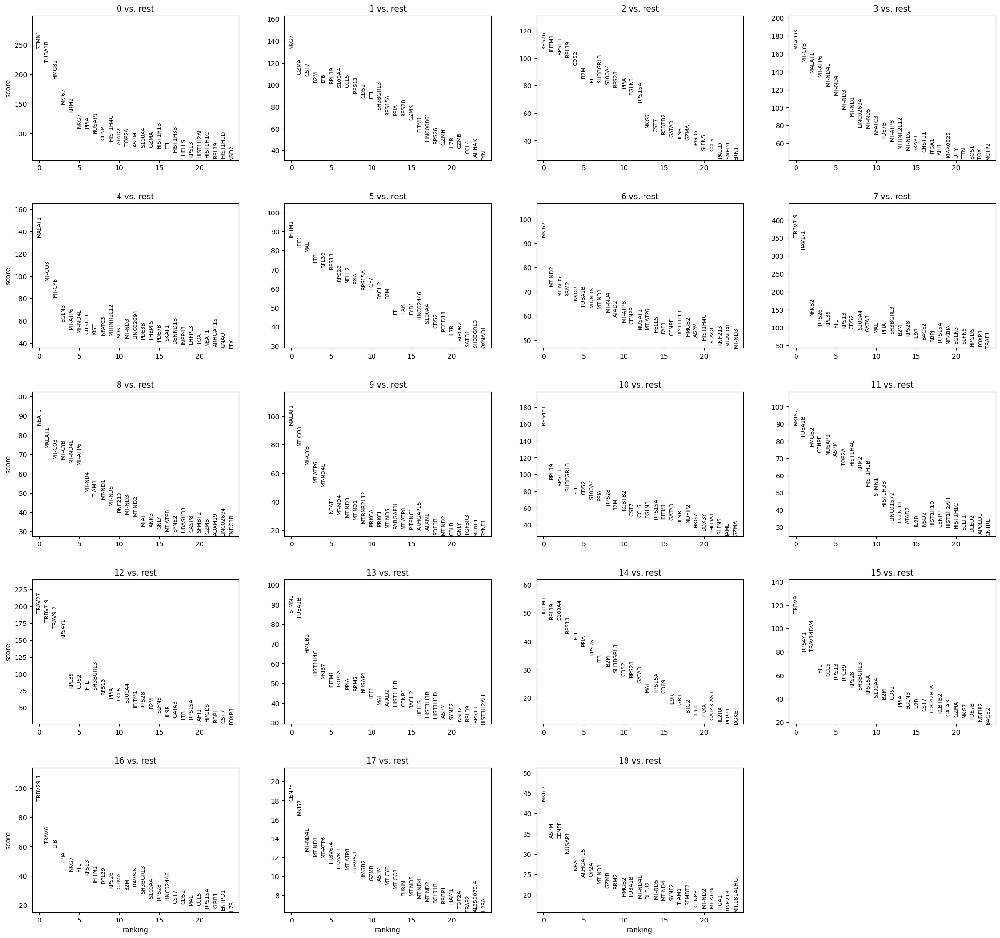

In [36]:
sc.tl.rank_genes_groups(adata_gex, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_gex, n_genes=25, sharey=False)

ranking genes
    finished (0:01:03)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: inv

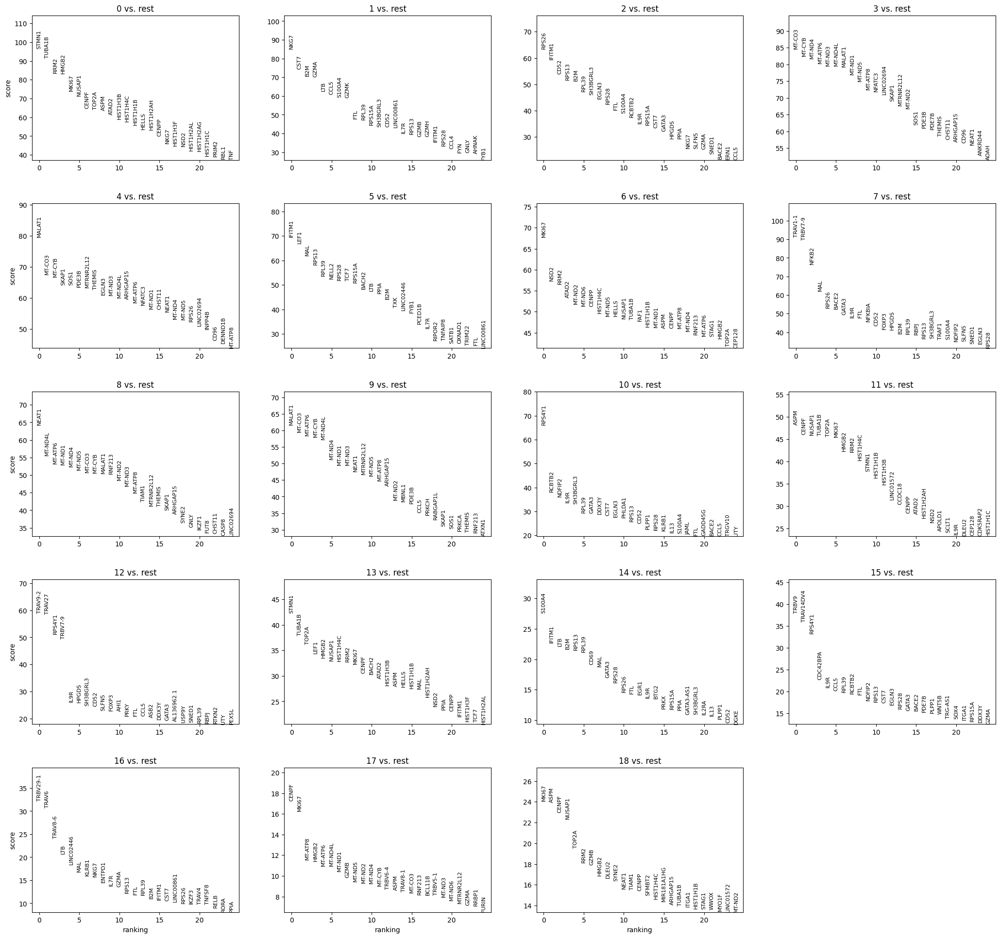

In [37]:
sc.settings.verbosity = 2
sc.tl.rank_genes_groups(adata_gex, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_gex, n_genes=25, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata_gex, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata_gex, n_genes=25, sharey=False)

In [ ]:
# 1. Perform Differential Expression Analysis
sc.tl.rank_genes_groups(adata_gex, 'leiden', method='t-test')

# 2. Visualize Top Differentially Expressed Genes
sc.pl.rank_genes_groups(adata_gex, n_genes=25, sharey=False)

# 3. Extract Ranked Genes and Their Statistics
result = adata_gex.uns['rank_genes_groups']
groups = result['names'].dtype.names
ranked_genes = pd.DataFrame(
    {group + '_' + key: result[key][group]
     for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'scores']})

# 4. Filter Genes Based on Thresholds and Select Top 10
marker_genes = {}
for group in groups:
    significant_genes = ranked_genes[
        (ranked_genes[group + '_pvals_adj'] < 0.05) & 
        (ranked_genes[group + '_logfoldchanges'].abs() > 0.5)
    ]
    # Sort by adjusted p-values and select top 10
    significant_genes = significant_genes.sort_values(by=group + '_pvals_adj').head(10)
    marker_genes[group] = significant_genes[group + '_names'].tolist()

# 5. Output Marker Genes
for cluster, genes in marker_genes.items():
    print(f"Marker genes for cluster {cluster}:")
    print(genes)
    print("\n")

# 6. Save Ranked Genes
ranked_genes.to_csv('ranked_genes.csv')


In [ ]:
# Combine all the marker genes from different clusters into one list
all_marker_genes = [
    'NCR1', 'FAM153A', 'EDA', 'PLXND1', 'GAS7', 'CACNA2D1', 'FRK', 'AC011586.2', 'LINC01426', 'KCNC3',
    'EGLN3-AS1', 'DCLK2', 'ADGRG2', 'AC011586.2', 'LINC01426', 'UGGT2', 'NCR1', 'AL392086.3', 'IL18RAP',
    'GAS7', 'DCLK2', 'CCL18', 'CACNA2D1', 'PPARG', 'GRIA4', 'PLAC4', 'LINC01483', 'SLC44A3', 'NCR1',
    'DSCAML1', 'FAM153A', 'GAS7', 'PLXND1', 'IL18RAP', 'OR3A2', 'ADCY1', 'LINC01426', 'AC011586.2',
    'GUCY1A2', 'FRMPD4', 'OR3A2', 'DSEL', 'AC099791.2', 'NCR1', 'PDGFD', 'PLA2G4C', 'SIX4', 'AC011586.2',
    'NCKAP5L', 'AGAP4', 'AL023882.1', 'PXDNL', 'PXDNL', 'LSAMP', 'FRK'
]

# Generate a dotplot with swapped axes
sc.pl.dotplot(adata_gex, var_names=all_marker_genes, groupby='leiden', use_raw=False, swap_axes=True)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:08)
running Leiden clustering
    finished (0:00:14)
computing UMAP
    finished (0:00:50)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


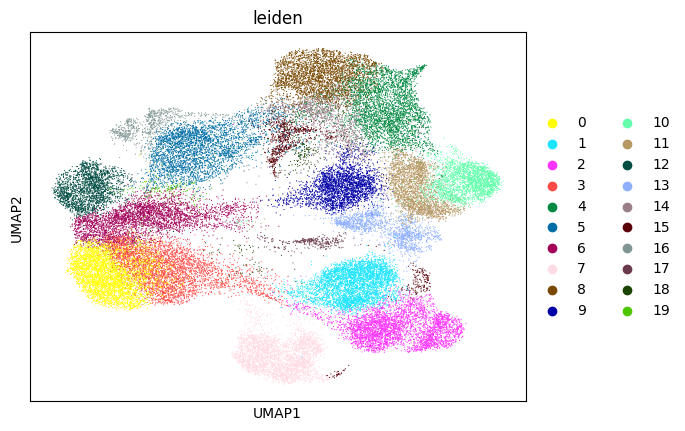

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


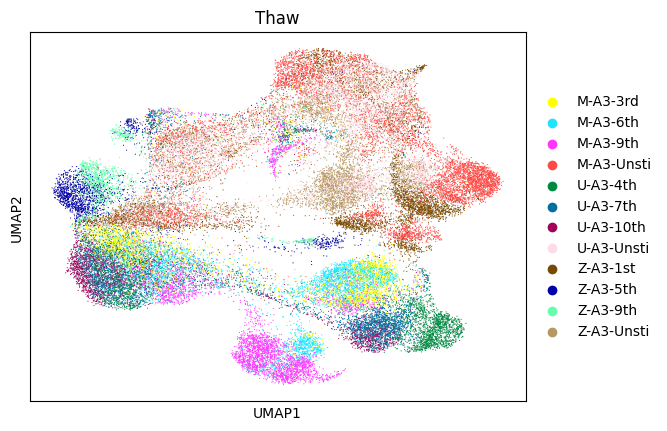

In [38]:


adata_gex_not_filtered = mdata['gex']

# Create a UMAP plot colored by 'leiden' clusters
# Compute the neighborhood graph
sc.pp.neighbors(adata_gex_not_filtered)

# Detect clusters using the Leiden algorithm
sc.tl.leiden(adata_gex_not_filtered)

# Now, you can visualize the UMAP plots
sc.tl.umap(adata_gex_not_filtered)
sc.pl.umap(adata_gex_not_filtered, color='leiden', palette=sc.pl.palettes.default_102)
sc.pl.umap(adata_gex_not_filtered, color=['Thaw'], palette=sc.pl.palettes.default_102)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


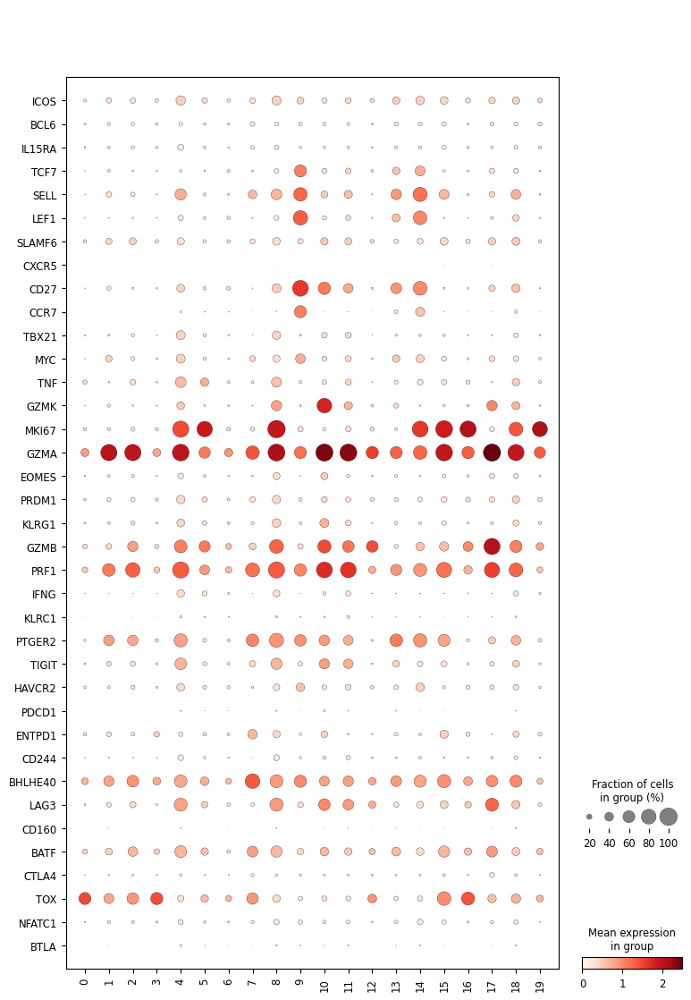

In [39]:
genes_of_interest = [
    'ICOS', 'BCL6', 'IL15RA', 'TCF7', 'SELL', 'LEF1', 'SLAMF6', 'CXCR5', 'CD27', 
    'CCR7', 'TBX21', 'MYC', 'TNF', 'GZMK', 'MKI67', 'GZMA', 'EOMES', 'PRDM1', 
    'KLRG1', 'GZMB', 'PRF1', 'IFNG', 'KLRC1', 'PTGER2', 'TIGIT', 'HAVCR2', 
    'PDCD1', 'ENTPD1', 'CD244', 'BHLHE40', 'LAG3', 'CD160', 'BATF', 'CTLA4', 
    'TOX', 'NFATC1', 'BTLA'
]

sc.pl.dotplot(adata_gex_not_filtered, var_names=genes_of_interest, groupby='leiden', use_raw=False, swap_axes=True)



In [ ]:
# Identify which genes from the genes_of_interest list are missing in the adata.var_names
missing_genes = [gene for gene in genes_of_interest if gene not in adata_gex.var_names]
print(missing_genes)


In [41]:
import scipy.sparse as sp


# Set up the Scanpy environment
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

# Use the non-filtered GEX data
adata_gex_not_filtered = mdata['gex']

# Load cell cycle genes and split into S phase and G2M phase
cell_cycle_genes = [x.strip() for x in open(r"C:\Users\okatk\Downloads\regev_lab_cell_cycle_genes.txt")]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

# Determine overlap between s_genes, g2m_genes and adata_gex_not_filtered
overlap_s_genes = set(s_genes).intersection(set(adata_gex_not_filtered.var_names))
overlap_g2m_genes = set(g2m_genes).intersection(set(adata_gex_not_filtered.var_names))

print(f"Number of overlapping genes in s_genes: {len(overlap_s_genes)}")
print(f"Number of overlapping genes in g2m_genes: {len(overlap_g2m_genes)}")

# Cell cycle scoring with the overlapping genes
sc.tl.score_genes_cell_cycle(adata_gex_not_filtered, s_genes=list(overlap_s_genes), g2m_genes=list(overlap_g2m_genes))

# PCA on cell cycle genes
overlap_cell_cycle_genes = list(overlap_s_genes) + list(overlap_g2m_genes)
adata_cc_genes = adata_gex_not_filtered[:, overlap_cell_cycle_genes]

# Convert to dense if it's sparse
if isinstance(adata_cc_genes.X, (sp.csr_matrix, sp.csc_matrix)):
    adata_cc_genes.X = adata_cc_genes.X.toarray()

# PCA
sc.tl.pca(adata_cc_genes, n_comps=50)
sc.pl.pca_scatter(adata_cc_genes, color='phase')

# Regress out cell cycle effect
sc.pp.regress_out(adata_gex_not_filtered, ['S_score', 'G2M_score'])
sc.pp.scale(adata_gex_not_filtered)

# Visualize after regression
adata_cc_genes = adata_gex_not_filtered[:, overlap_cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')



Number of overlapping genes in s_genes: 42
Number of overlapping genes in g2m_genes: 52
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    292 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    378 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)
computing PCA
    on highly variable genes
    with n_comps=50


ValueError: `k` must be an integer satisfying `0 < k < min(A.shape)`.

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:30)
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    299 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    387 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


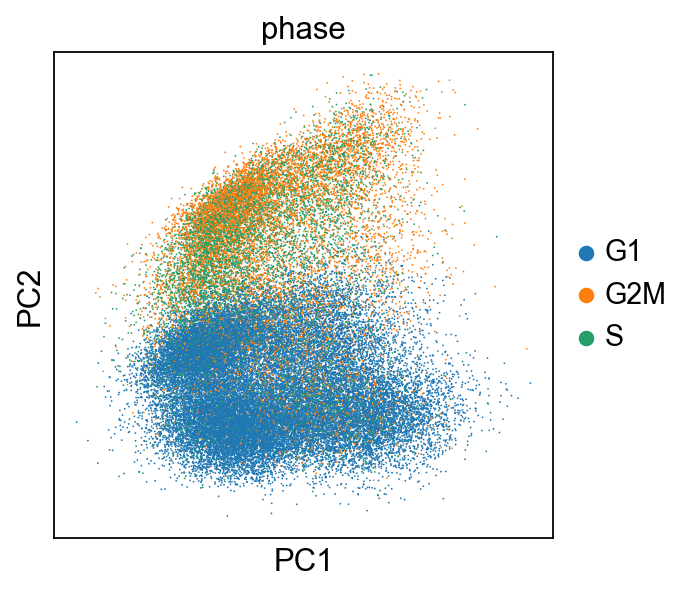

In [42]:
# Run PCA on the original data
sc.tl.pca(adata_gex_not_filtered, n_comps=50)

# Score the cell cycle genes
sc.tl.score_genes_cell_cycle(adata_gex_not_filtered, s_genes=s_genes, g2m_genes=g2m_genes)

# Plot
sc.pl.pca_scatter(adata_gex_not_filtered, color='phase')


In [43]:
# Regress out the cell cycle effects
sc.pp.regress_out(adata_gex_not_filtered, ['S_score', 'G2M_score'])

# Scale the data
sc.pp.scale(adata_gex_not_filtered)

# Reproject the data using the cell cycle genes
adata_cc_genes = adata_gex_not_filtered[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)

# Plot the PCA scatter again, coloring by cell cycle phase
sc.pl.pca_scatter(adata_cc_genes, color='phase')


regressing out ['S_score', 'G2M_score']
    sparse input is densified and may lead to high memory use


KeyboardInterrupt: 

In [44]:
# Regress out the cell cycle effects
sc.pp.regress_out(adata_gex_not_filtered, ['S_score', 'G2M_score'])

# Scale the data
sc.pp.scale(adata_gex_not_filtered)

# Reproject the data using the cell cycle genes
adata_cc_genes = adata_gex_not_filtered[:, cell_cycle_genes]

# Proceed with PCA and plotting with specified number of components
sc.tl.pca(adata_cc_genes, n_comps=50)
sc.pl.pca_scatter(adata_cc_genes, color='phase')


regressing out ['S_score', 'G2M_score']


KeyboardInterrupt: 

In [ ]:
# Determine overlap between s_genes, g2m_genes and adata_gex
overlap_s_genes = set(s_genes).intersection(set(adata_gex_not_filtered.var_names))
overlap_g2m_genes = set(g2m_genes).intersection(set(adata_gex_not_filtered.var_names))

print(f"Number of overlapping genes in s_genes: {len(overlap_s_genes)}")
print(f"Number of overlapping genes in g2m_genes: {len(overlap_g2m_genes)}")


In [ ]:
print("First few genes in adata_gex:", adata_gex.var_names[:10])
print("First few cell cycle genes:", cell_cycle_genes[:10])


In [55]:
# Rename the original mdata
mdata_original = mdata

# Recreate the MuData object from its modalities
mdata = mu.MuData(mdata_original.mod)

# Make observation names unique
mdata.obs_names_make_unique()

# Calculate the predominant donor for each clonotype
mdata.obs['donor'] = mdata["gex"].obs['Thaw'].apply(lambda x: x[0])

def get_predominant_donor(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

predominant_donor = mdata.obs.groupby('airr:clone_id')['donor'].agg(get_predominant_donor)

# Map the predominant donor to each cell
mdata.obs['predominant_donor'] = mdata.obs['airr:clone_id'].map(predominant_donor)

# Get the unique donors
donors = mdata.obs['predominant_donor'].unique()

# Generate separate plots for each donor
for donor in donors:
    if donor is not None:  # Skip None
        subset = mdata[mdata.obs['predominant_donor'] == donor]
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='gex:Thaw'  # Use the correct color attribute if you want to color the network differently
            )


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:479: UserWarning: obs_names are not unique. To make them unique, call `.obs_names_make_unique`.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mudata.py:322: UserWarning: Duplicated obs_names should not be present in different modalities due to the ambiguity that leads to.
  warnings.warn(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\mudata\_core\mud

ValueError: Length mismatch: Expected axis has 77230 elements, new values have 146712 elements

In [ ]:
mdata["airr"].obs.columns


In [56]:
# this was a test to see if I could get predominant thaw and split into 12 graphs for TCR. Still has nan data. 

# Calculate the predominant Thaw for each clonotype
def get_predominant_thaw(x):
    try:
        return x.value_counts().index[0]
    except IndexError:
        return None

# Here we should use the TCR data (airr modality) to get the predominant Thaw for each clonotype
predominant_thaw = mdata["airr"].obs.groupby('clone_id')['Thaw'].agg(get_predominant_thaw)

# Map the predominant Thaw to each cell in the TCR data
mdata["airr"].obs['predominant_thaw'] = mdata["airr"].obs['clone_id'].map(predominant_thaw)

# Get the unique Thaws
thaws = mdata["airr"].obs['predominant_thaw'].unique()

# Generate separate plots for each Thaw
for thaw in thaws:
    if thaw is not None:  # Skip None
        subset = mdata["airr"][mdata["airr"].obs['predominant_thaw'] == thaw]
        if subset.obs.shape[0] > 0:  # Check that the subset has cells
            ir.pl.clonotype_network(
                subset, 
                color='Thaw'  # Use the correct color attribute if you want to color the network differently
            )




C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


ValueError: zero-size array to reduction operation

In [ ]:
#was able to cut nan data but only shows predominant thaw. No distribution of thaws across clonotype

# Use the predominant_thaw mapping calculated earlier to associate each cell in the TCR data with its predominant Thaw
mdata["airr"].obs['predominant_thaw'] = mdata["airr"].obs['clone_id'].map(predominant_thaw)

# Generate the clonotype network plot for the TCR data, colored by their predominant Thaw
ir.pl.clonotype_network(
    mdata["airr"], 
    color='predominant_thaw'  # Color nodes by their predominant Thaw
)


In [57]:
# Derive donor information from 'Thaw' column
mdata["airr"].obs['derived_donor'] = mdata["airr"].obs['Thaw'].str[0]

# List of unique donors
donors = mdata["airr"].obs['derived_donor'].unique()

# Generate separate clonotype network plots for each donor
for donor in donors:
    # Get the subset for the specific donor
    donor_subset = mdata["airr"][mdata["airr"].obs['derived_donor'] == donor]
    
    # Filter out clonotypes with fewer than 10 cells within this subset
    clonotype_counts_donor = donor_subset.obs['clone_id'].value_counts()
    valid_clonotypes_donor = clonotype_counts_donor[clonotype_counts_donor >= 10].index
    filtered_donor_subset = donor_subset[donor_subset.obs['clone_id'].isin(valid_clonotypes_donor)]
    
    # Generate the clonotype network plot for this filtered subset
    if filtered_donor_subset.obs.shape[0] > 0:  # Check that the subset has cells
        ir.pl.clonotype_network(
            filtered_donor_subset, 
            color='predominant_thaw'  # Color nodes by their predominant Thaw
        )


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


ValueError: zero-size array to reduction operation

In [ ]:
columns_in_obs = mdata["airr"].obs.columns
print(columns_in_obs)


In [ ]:
# Generate separate clonotype network plots for each donor
for donor in donors:
    # Get the subset for the specific donor
    donor_subset = mdata["airr"][mdata["airr"].obs['derived_donor'] == donor]
    
    # Filter out clonotypes with fewer than 10 cells within this subset and exclude nan values in Thaw
    clonotype_counts_donor = donor_subset.obs['clone_id'].value_counts()
    valid_clonotypes_donor = clonotype_counts_donor[clonotype_counts_donor >= 10].index
    filtered_donor_subset = donor_subset[donor_subset.obs['clone_id'].isin(valid_clonotypes_donor) & donor_subset.obs['Thaw'].notna()]
    
    # Generate the clonotype network plot for this filtered subset with pie charts showing distribution of Thaw
    if filtered_donor_subset.obs.shape[0] > 0:  # Check that the subset has cells
        ir.pl.clonotype_network(
            filtered_donor_subset, 
            color='Thaw'  # Color nodes by Thaw to represent distribution within each clonotype
        )



In [ ]:
print(mdata.obs.columns)

In [ ]:
# we don't have source, just use sample labels here
ir.pl.clonotype_network( # color='Thaw'
    mdata,color='gex:Sample') #, base_size=20, label_fontsize=9, panel_size=(7, 7)
#)

In [ ]:
# we don't have source, just use sample labels here
ir.pl.clonotype_network( # color='Thaw'
    mdata,color='gex:Time') #, base_size=20, label_fontsize=9, panel_size=(7, 7)
#)

In [ ]:
# re-compute the clonotype network based on amino-acid sequence similarity and 
# define clonotype clusters.
ir.pp.ir_dist(
    mdata,
    metric="alignment",
    sequence="aa", # tried 15, 25, 10, was garbage
    cutoff=10,# was 15, I would try 10 next -- definitely faster with the smaller number
)
ir.tl.define_clonotype_clusters(
    mdata, sequence="aa", metric="alignment", receptor_arms="all", dual_ir= "primary_only" #"any"
)


In [ ]:
ir.tl.clonotype_network(mdata, min_cells=40, sequence="aa", metric="alignment")
ir.pl.clonotype_network(
    mdata, color="gex:Thaw", label_fontsize=9, panel_size=(7, 7), base_size=20
)
# again color by your labels, not theirs

In [ ]:
ir.tl.clonotype_network(mdata, min_cells=33, sequence="aa", metric="alignment")
ir.pl.clonotype_network(
    mdata, color="gex:Sample", label_fontsize=9, panel_size=(7, 7), base_size=20
)

In [ ]:
ir.tl.clonotype_network(mdata, min_cells=33, sequence="aa", metric="alignment")
ir.pl.clonotype_network(
    mdata, color="gex:Time", label_fontsize=9, panel_size=(7, 7), base_size=20
)

In [ ]:
mdata["airr"].obsm['airr']

In [ ]:
mdata["airr"].obsm['chain_indices']

In [ ]:
# task 1 
# this is a little more complicated due to the nature of the data itself (these are not even scalars!)

# wants sample by TCR airr heatmap as one graph, 
# with hierarchical clustering on the opposing axises and colored by differential expression
sc.tl.rank_genes_groups(mdata["gex"], groupby='Thaw', method='wilcoxon')#, key_added = "wilcoxon")
#sc.pl.rank_genes_groups(mdata["gex"], n_genes=10, groupby='cluster')
#sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="thaw", groupby="louvain_0.6") 
# you can use this to give you mean expression in groups
sc.pl.rank_genes_groups_heatmap(mdata["gex"], 
                                n_genes=10, groupby='Thaw', show_gene_labels=True,) # save="heatmap.png")

In [ ]:
# create some mask on gex data to only have tcr receptor expression

mdata["gex"].var.gene_ids


In [ ]:
mdata["gex"].obs.Thaw 

In [ ]:
len(mdata["gex"].obs[mdata["gex"].obs.Thaw == "Z-A3-1st"].index)

In [ ]:
mdata["prot"].var.gene_ids

In [ ]:
"ADT_C0090" in list(mdata["prot"].var.gene_ids)
#just do the second paper's qc and redo all the protein + gex stuff
# MouseIgG1, MouseIgG2a, MouseIgG2b, RatIgG2b, RatIgG1, RatIgG2a, and HamsterIgG
# C0090, C0091, C0092, C0095
# match these to ADT tags based on the file Xiao gave you

In [ ]:
print(mdata["prot"].obs.columns)


In [ ]:
# Identify NA in "Thaw"
non_na_mask = mdata["prot"].obs["Thaw"].notna()

# Subset the data using the non-NA mask
adata_prot_subset = mdata["prot"][non_na_mask]

# Generate UMAP
import scanpy as sc
sc.pp.neighbors(adata_prot_subset)
sc.tl.umap(adata_prot_subset)

# Visualize UMAP colored by "Thaw"
sc.pl.umap(adata_prot_subset, color="Thaw")


In [ ]:
def make_indices_unique(adata):
    # Create a dictionary to store counts of occurrences of each index
    index_counts = {}
    new_indices = []
    
    for idx in adata.obs.index:
        if idx in index_counts:
            index_counts[idx] += 1
            new_indices.append(f"{idx}_{index_counts[idx]}")
        else:
            index_counts[idx] = 0
            new_indices.append(idx)
    
    # Assign the new indices to the AnnData object
    adata.obs.index = new_indices

# Make indices unique for the "prot" modality
make_indices_unique(mdata["prot"])

# Check if the indices are now unique
if mdata["prot"].obs.index.is_unique:
    print("Indices in 'prot' are now unique.")
else:
    print("Indices in 'prot' are still not unique.")


In [ ]:
for modality in ["prot", "airr", "gex"]:
    if not mdata[modality].obs.index.is_unique:
        print(f"{modality} has non-unique indices.")
    else:
        print(f"{modality} has unique indices.")


In [ ]:
# Ensure that the observations are aligned
common_obs = mdata["prot"].obs.index.intersection(mdata["airr"].obs.index).intersection(mdata["gex"].obs.index)

# Subset each AnnData object to only include the common observations
prot_subset = mdata["prot"][common_obs]
airr_subset = mdata["airr"][common_obs]
gex_subset = mdata["gex"][common_obs]


In [ ]:
# Create a new MuData object
combined_mdata = mu.MuData({"prot": prot_subset, "airr": airr_subset, "gex": gex_subset})


In [ ]:
import scanpy as sc
from scipy.sparse import hstack, csr_matrix
from sklearn.impute import SimpleImputer

# Concatenate the data matrices from each modality along the feature axis
combined_matrix = hstack([combined_mdata['gex'].X, combined_mdata['prot'].X])  # Assuming airr data is already in gex

# Create a new AnnData object for the integrated data
adata_combined = sc.AnnData(combined_matrix)

# Ensure that the "Thaw" information is present in the obs attribute of adata_combined
adata_combined.obs['Thaw'] = combined_mdata['gex'].obs['Thaw']

# Convert the combined matrix to CSR format
adata_combined.X = adata_combined.X.tocsr()

# Normalize the data
sc.pp.normalize_total(adata_combined, target_sum=1e4)

# Convert to CSR format again
adata_combined.X = adata_combined.X.tocsr()

# Convert the matrix to dense format for imputation
dense_matrix = adata_combined.X.toarray()

# Check for NaN or infinite values in the dense matrix
print("Contains NaN values in dense matrix:", np.isnan(dense_matrix).any())
print("Contains Infinite values in dense matrix:", np.isinf(dense_matrix).any())

# Create an imputer object with a median filling strategy
imputer = SimpleImputer(strategy='median')

# Apply the imputer to our data
imputed_matrix = imputer.fit_transform(dense_matrix)

# Check for NaN or infinite values after imputation in the dense matrix
print("Contains NaN values after imputation in dense matrix:", np.isnan(imputed_matrix).any())
print("Contains Infinite values after imputation in dense matrix:", np.isinf(imputed_matrix).any())

# Convert the imputed matrix back to CSR format
adata_combined.X = csr_matrix(imputed_matrix)

# Check for NaN or infinite values in the sparse matrix
print("Contains NaN values in sparse matrix:", np.isnan(adata_combined.X.toarray()).any())
print("Contains Infinite values in sparse matrix:", np.isinf(adata_combined.X.toarray()).any())


# Check for negative values after normalization
print("Contains negative values after normalization:", (adata_combined.X.toarray() < 0).any())

# Set negative values to a small positive value
adata_combined.X.data[adata_combined.X.data < 0] = 1e-10

# Log-transform
sc.pp.log1p(adata_combined)

# Check for NaN values after log-transform
print("Contains NaN values after log-transform:", np.isnan(adata_combined.X.toarray()).any())

# Perform PCA
sc.tl.pca(adata_combined, svd_solver='arpack')

# Compute the neighborhood graph
sc.pp.neighbors(adata_combined, n_neighbors=10, n_pcs=40)

# Compute UMAP
sc.tl.umap(adata_combined)

# Ensure the order of cells in adata_combined matches the order in combined_mdata['gex']
# ...

# Directly assign the "Thaw" annotations
adata_combined.obs['Thaw'] = combined_mdata['gex'].obs['Thaw'].values

# Check the unique values in the "Thaw" column of adata_combined.obs after assignment
print("Unique values in 'Thaw' column of adata_combined.obs after assignment:", adata_combined.obs['Thaw'].unique())

# Visualize the UMAP plot with the "Thaw" annotations
sc.pl.umap(adata_combined, color=["Thaw"])



In [ ]:
# Ensure that the cells in adata_combined are in the same order as in mdata['airr']
assert all(adata_combined.obs_names == mdata['airr'].obs_names), "Cell order mismatch!"

# Transfer clone_id values
adata_combined.obs['clone_id'] = mdata['airr'].obs['clone_id']

# Check the first few rows to ensure the transfer was successful
print(adata_combined.obs[['clone_id']].head())


In [ ]:
print("Number of cells in adata_combined:", adata_combined.shape[0])
print("Number of cells in mdata['airr']:", mdata['airr'].shape[0])


# Cells in adata_combined but not in mdata['airr']
missing_in_airr = adata_combined.obs_names.difference(mdata['airr'].obs_names)
print("Cells in adata_combined but not in mdata['airr']:", len(missing_in_airr))

# Cells in mdata['airr'] but not in adata_combined
missing_in_combined = mdata['airr'].obs_names.difference(adata_combined.obs_names)
print("Cells in mdata['airr'] but not in adata_combined:", len(missing_in_combined))



In [ ]:
is_same_set_of_cells = set(adata_combined.obs_names) == set(mdata['airr'].obs_names)
print("Is it the same set of cells in both datasets?", is_same_set_of_cells)


In [ ]:
# Iterate over each unique thaw condition

adata_combined.obs['clone_id'] = combined_mdata['airr'].obs['clone_id']

for thaw_name in adata_combined.obs['Thaw'].unique():
    
    # Subset the data for the current thaw condition
    subset = adata_combined[adata_combined.obs['Thaw'] == thaw_name]
    
    # Check if the subset has a sufficient number of cells
    if subset.shape[0] > 1:
        # Diagnostic print statements
        print(f"Processing {thaw_name}")
        print("Subset shape:", subset.shape)
        print("Unique clone_ids:", subset.obs['clone_id'].nunique())
        
        # Assuming clone_id is already present in the obs dataframe
        # Calculate clone sizes for the subset
        try:
            subset.obs['clone_id_size'] = subset.obs.groupby('clone_id').transform('size')
        except Exception as e:
            print(f"Error encountered for {thaw_name}: {e}")
            continue
        
        # Transfer the clone size information to the main data
        ci_name = thaw_name + "_clone_id_size"
        adata_combined.obs[ci_name] = 'lightgrey'  # default color
        adata_combined.obs.loc[subset.obs.index, ci_name] = subset.obs['clone_id_size']
        
        # Plot the UMAP embedding for clone size
        sc.pl.umap(adata_combined, color=ci_name, title=f'Clone ID Size for {thaw_name}', legend_loc='on data', show=False)
    else:
        print(f"Skipping {thaw_name} due to insufficient number of cells.")


In [ ]:
for thaw_name in adata_combined.obs['Thaw'].unique():
    subset = adata_combined[adata_combined.obs['Thaw'] == thaw_name]
    print(f"Thaw: {thaw_name}")
    print(subset.obs['clone_id'].value_counts(dropna=False).head())
    print("------")


In [ ]:
mdata['gex']

In [ ]:
print("Unique values in 'Thaw' column of combined_mdata['gex'].obs:", combined_mdata['gex'].obs['Thaw'].unique())
print("Unique values in 'Thaw' column of adata_combined.obs:", adata_combined.obs['Thaw'].unique())


In [ ]:
# Check for NaN values in the dense representation of the matrix
contains_nan = np.isnan(adata_combined.X.toarray()).any()
print("Contains NaN values after imputation:", contains_nan)


In [ ]:
# Identify cells with NaN values
cells_with_nan = adata_combined.obs_names[adata_combined.X.todense().any(axis=1).A1]

# Identify features with NaN values
features_with_nan = adata_combined.var_names[adata_combined.X.todense().any(axis=0).A1]

print(f"Number of cells with NaN values: {len(cells_with_nan)}")
print(f"Number of features with NaN values: {len(features_with_nan)}")


In [ ]:
# Check the number of observations in each dataset
print("Number of observations in gex data:", combined_mdata['gex'].shape[0])
print("Number of observations in prot data:", combined_mdata['prot'].shape[0])

# Check the first few indices of each dataset
print("\nFirst few indices of gex data:")
print(combined_mdata['gex'].obs.index[:10])

print("\nFirst few indices of prot data:")
print(combined_mdata['prot'].obs.index[:10])


In [ ]:
print("Shape of gex data:", combined_mdata['gex'].X.shape)
print("Shape of prot data:", combined_mdata['prot'].X.shape)


In [ ]:
print(adata_combined)


In [ ]:
# 1. Check the .obs and .var attributes of the gex object
print("Columns in mdata['gex'].obs:")
print(mdata['gex'].obs.columns)

print("\nColumns in mdata['gex'].var:")
print(mdata['gex'].var.columns)

# 2. Check the .layers attribute of the gex object
print("\nLayers in mdata['gex']:")
print(mdata['gex'].layers.keys())


In [ ]:
# Display the first few rows of the potentially related columns
related_cols = ['most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 
                'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification']
print(mdata['gex'].obs[related_cols].head())


In [ ]:
import scanpy as sc

# 1. Normalize the data
sc.pp.normalize_total(combined_mdata, target_sum=1e4)

# 2. Log-transform the data
sc.pp.log1p(combined_mdata)

# 3. Identify highly variable genes
sc.pp.highly_variable_genes(combined_mdata, min_mean=0.0125, max_mean=3, min_disp=0.5)

# 4. Scale the data and run PCA
combined_mdata = combined_mdata[:, combined_mdata.var.highly_variable]
sc.pp.scale(combined_mdata, max_value=10)
sc.tl.pca(combined_mdata, svd_solver='arpack')

# 5. Compute the neighborhood graph
sc.pp.neighbors(combined_mdata, n_neighbors=10, n_pcs=40)

# 6. Run UMAP
sc.tl.umap(combined_mdata)

# Plot the UMAP
sc.pl.umap(combined_mdata, color=["Thaw"])


In [ ]:
# Count the number of 'na' entries in the 'Thaw' column
na_count = mdata["prot"].obs['Thaw'].isna().sum()

# Print the detailed explanation
print(f"Out of the {len(mdata['prot'].obs)} cells in the protein dataset, {na_count} cells have 'na' as their 'Thaw' value.")
print("\nExplanation:")
print("The 'na' dots on the UMAP plot represent cells from the protein dataset that do not have associated 'Thaw' information.")
print("This can occur if there is a discrepancy between the cells in the protein dataset and the gene expression dataset from which the 'Thaw' information was originally sourced.")
print("In other words, these 'na' cells in the protein dataset do not have corresponding cells in the gene expression dataset with 'Thaw' information.")


In [ ]:
mdata["gex"]

In [ ]:
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='Thaw',)

In [ ]:
mdata["gex"]

In [ ]:
# List the unique categories in the filtered 'Thaw' column
filtered_unique_thaw_categories = mdata["airr"].obs['Thaw'].cat.categories
print(filtered_unique_thaw_categories)


In [ ]:
# Define the desired order
desired_order = [
    "M-A3-Unsti", "M-A3-3rd", "M-A3-6th", "M-A3-9th", 
    "U-A3-Unsti", "U-A3-4th", "U-A3-7th", "U-A3-10th", 
    "Z-A3-Unsti", "Z-A3-1st", "Z-A3-5th", "Z-A3-9th"
]

# Reorder the 'gex:Thaw' category based on the desired order
mdata.obs["gex:Thaw"] = mdata.obs["gex:Thaw"].astype('category')
mdata.obs["gex:Thaw"] = mdata.obs["gex:Thaw"].cat.reorder_categories(desired_order)

# Plot the data
ir.pl.clonal_expansion(
    mdata, target_col="clone_id", clip_at=20, groupby="gex:Thaw"
)

# Plot normalized data
ir.pl.clonal_expansion(
    mdata, target_col="clone_id", clip_at=20, normalize=True, groupby="gex:Thaw"
)


In [ ]:
# Check for categories in `desired_order` that are not in `mdata.obs["gex:Thaw"]`
missing_categories = set(desired_order) - set(mdata.obs["gex:Thaw"].cat.categories)
print("Missing categories:", missing_categories)

# Check for categories in `mdata.obs["gex:Thaw"]` that are not in `desired_order`
extra_categories = set(mdata.obs["gex:Thaw"].cat.categories) - set(desired_order)
print("Extra categories:", extra_categories)


In [ ]:
# task 2
# we must be missing a thaw label

# UMAP from protein data, where the clusters are colored by sample name
# create a new column called Sample that applies the predefined sample map
thaw_to_donor = {
    'Z-A3-Unsti' : "Z",
    'Z-A3-1st' : "Z", 
    'Z-A3-5th' : "Z",  
    'Z-A3-9th' : "Z",    
    "M-A3-Unsti" : "M",  
    "M-A3-3rd" : "M",
    "M-A3-6th": "M",
    "M-A3-9th" : "M",
    "U-A3-Unsti" : "U",
    "U-A3-4th" : "U",
    "U-A3-7th": "U",
    "U-A3-10th": "U"
}
# U-A3-Unsti is not getting picked up here

# [print(i)for i in mdata["prot"].obs['Thaw'].unique()]
# raise Error
mdata["prot"].obs["Sample"] = mdata["prot"].obs['Thaw'].map(thaw_to_donor)
mdata["gex"].obs["Sample"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)

Z, M, U = mdata["gex"][mdata["gex"].obs.Sample == "Z"], mdata["gex"][mdata["gex"].obs.Sample == "M"], mdata["gex"][mdata["gex"].obs.Sample == "U"]
sc.tl.umap(Z)
sc.pl.umap(Z, color='Thaw',) # save="UMAP.png")
sc.tl.umap(M)
sc.pl.umap(M, color='Thaw',) # save="UMAP.png")
sc.tl.umap(U)
sc.pl.umap(U, color='Thaw',) # save="UMAP.png")

In [ ]:
columns_in_filtered_data = filtered_data.obs.columns
print(columns_in_filtered_data)


In [ ]:
# Extract the indices from mdata["airr"] where 'Thaw' is "M-A3-9th" and 'clone_id' is '19'
selected_indices = mdata["airr"].obs[(mdata["airr"].obs['Thaw'] == "M-A3-9th") & (mdata["airr"].obs['clone_id'] == '19')].index

# Use these indices to filter mdata["gex"]
filtered_data = mdata["gex"][mdata["gex"].obs.index.isin(selected_indices)]

# Generate and plot the UMAP
sc.tl.umap(filtered_data)
sc.pl.umap(filtered_data, color='Thaw')




In [ ]:
mdata["airr"].obs.columns


No data for Thaw M-A3-Uns in clonotype 19.
computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


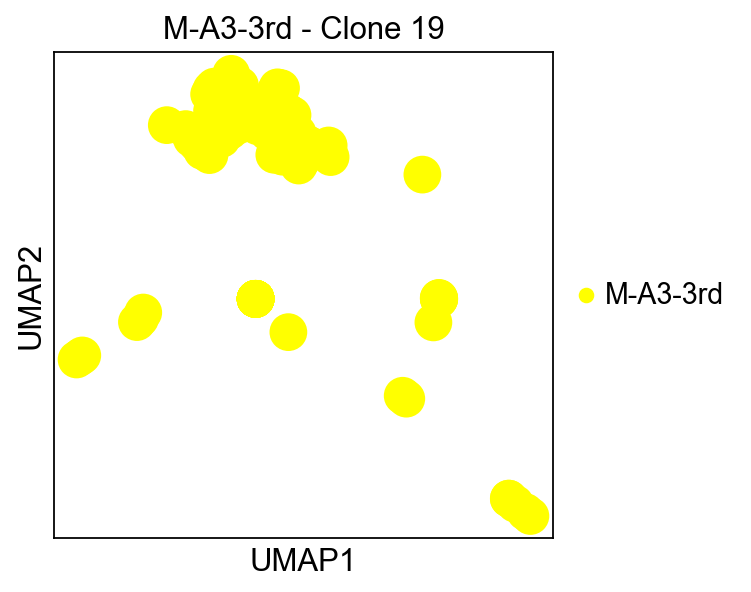

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


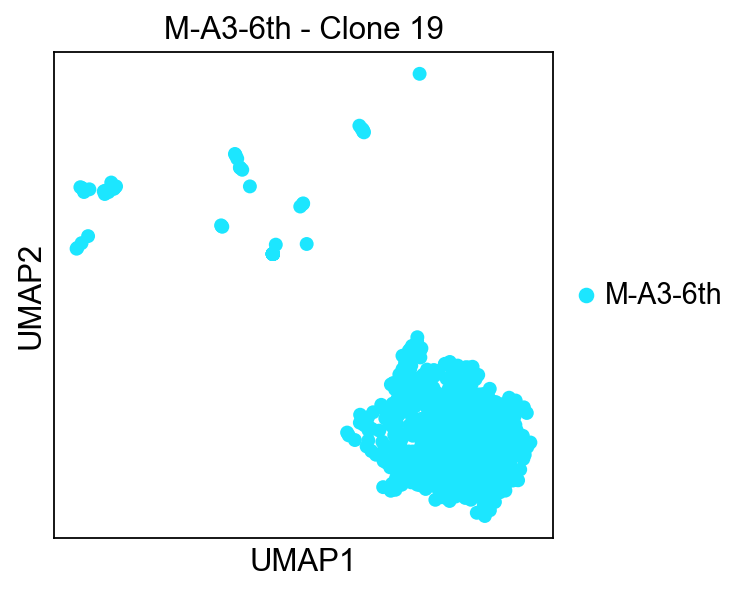

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


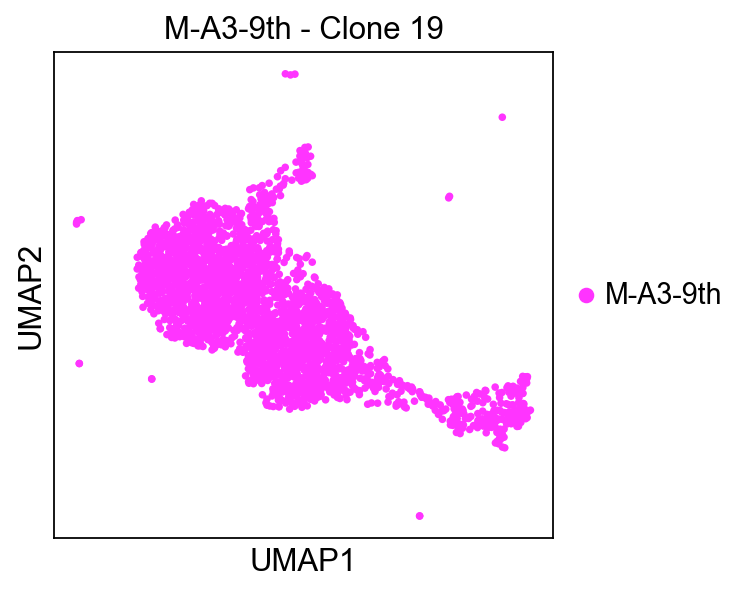

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


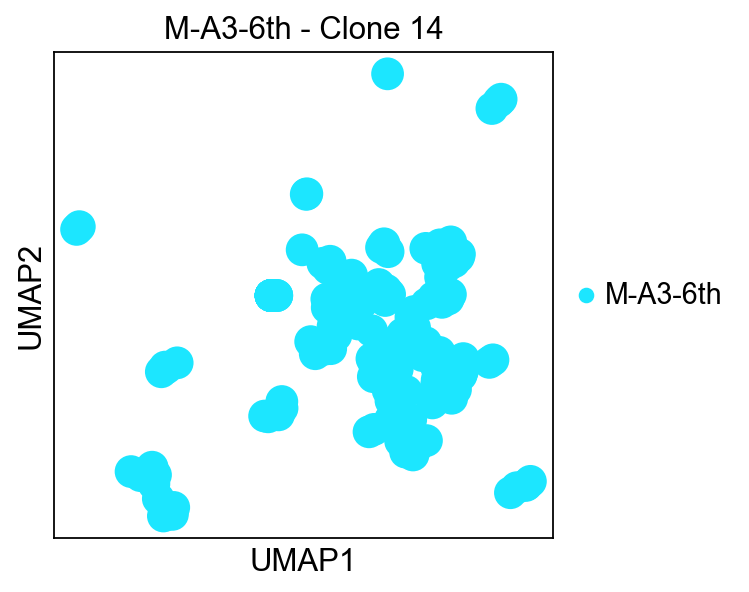

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


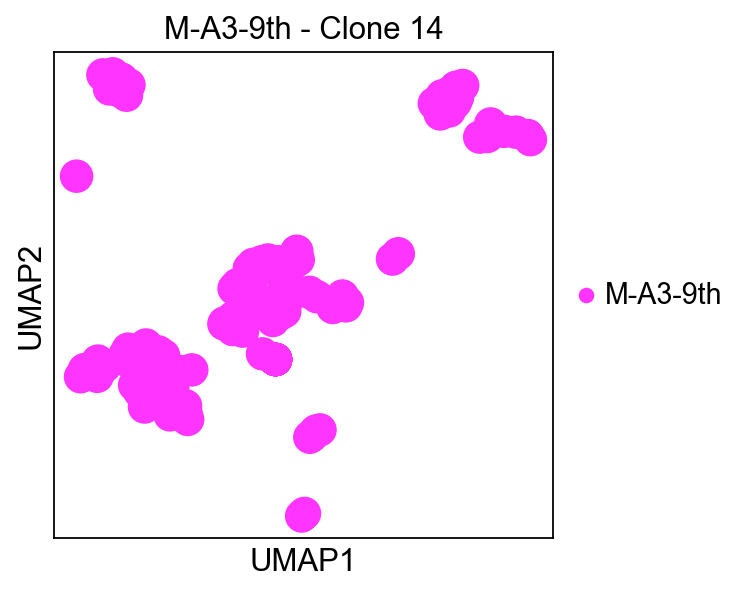

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


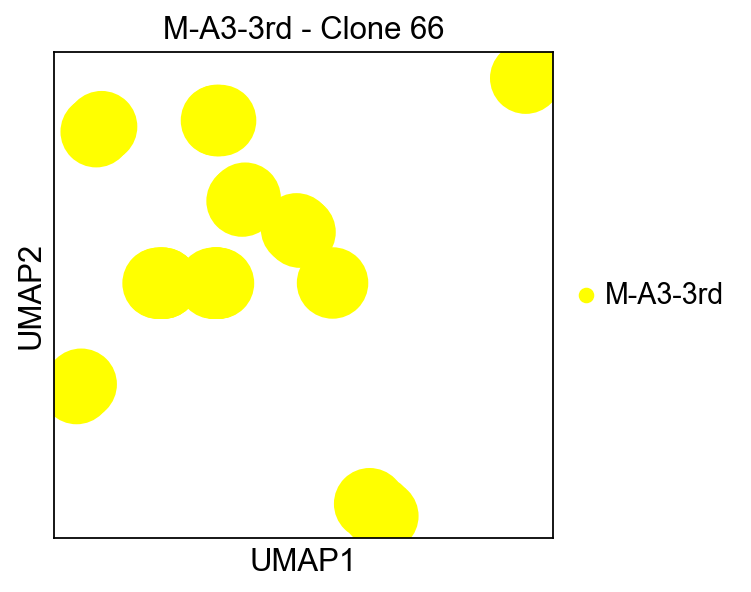

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


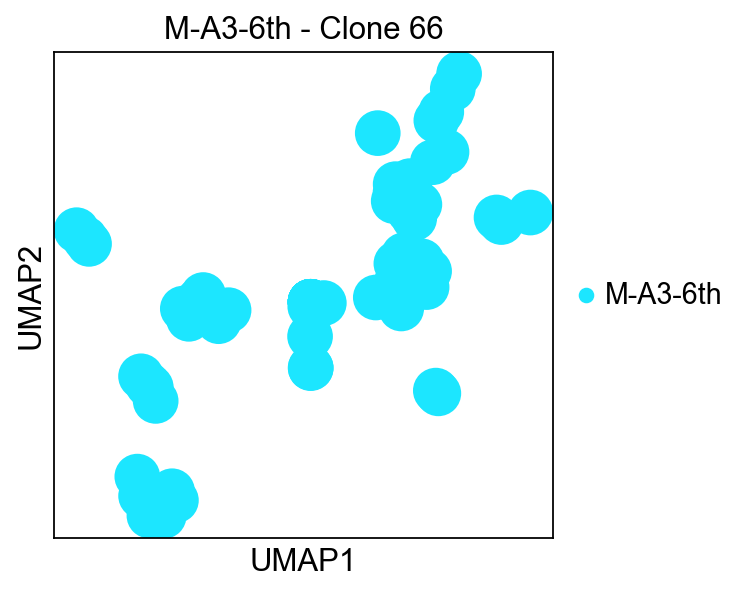

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


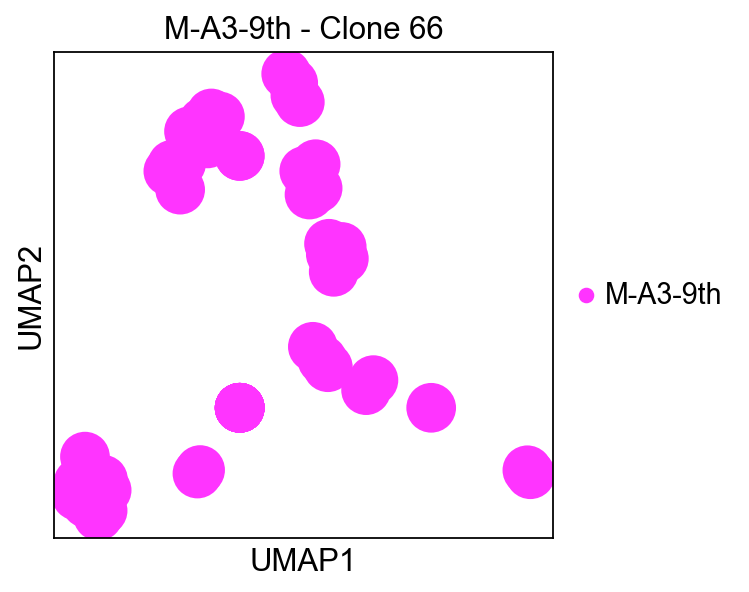

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


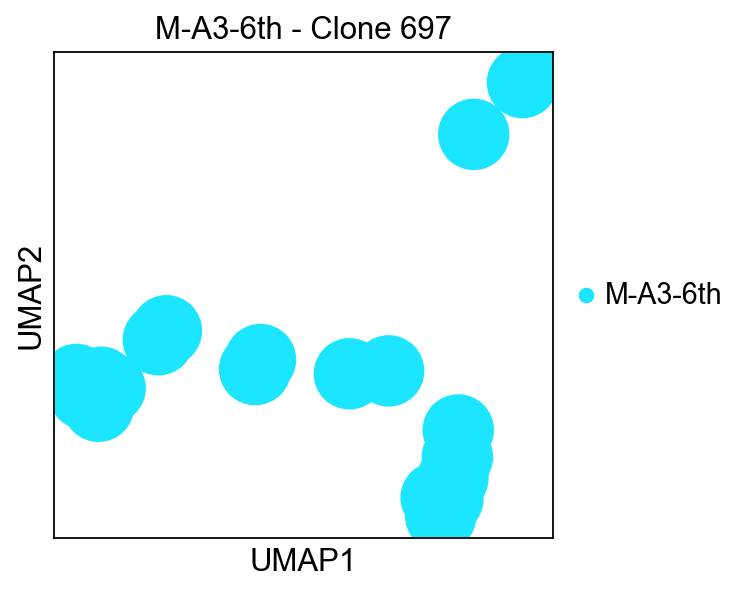

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


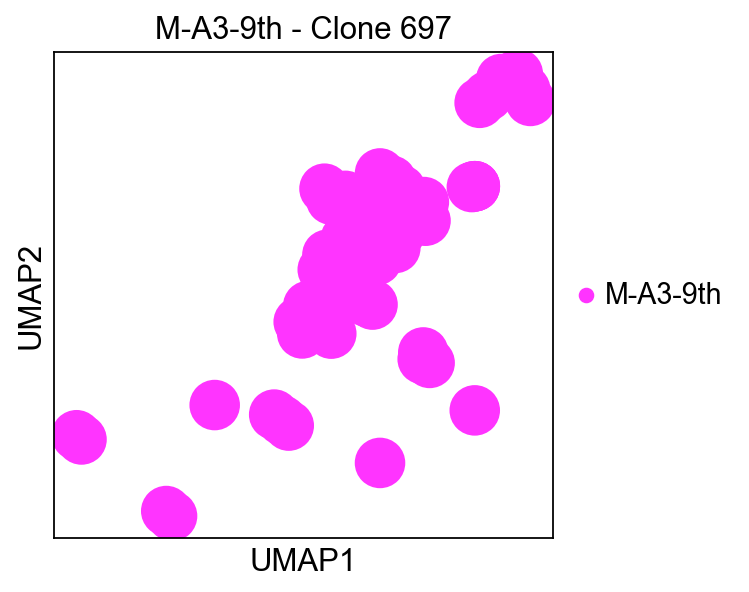

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


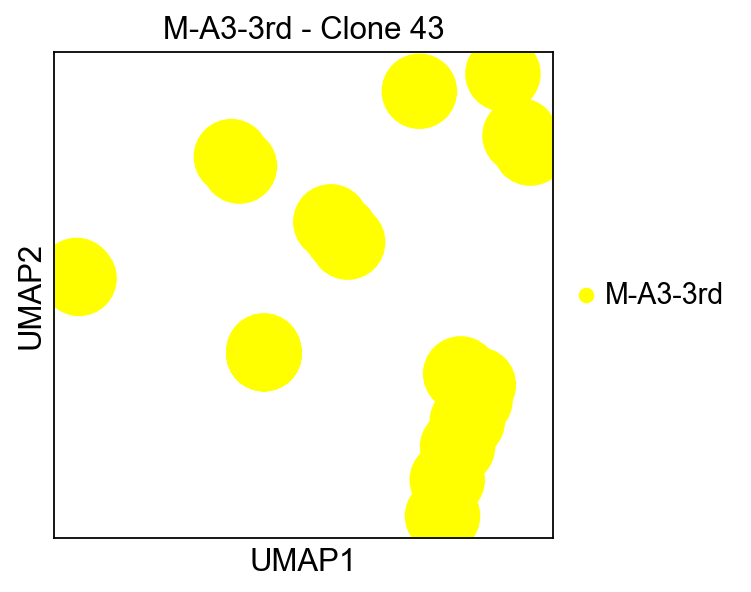

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


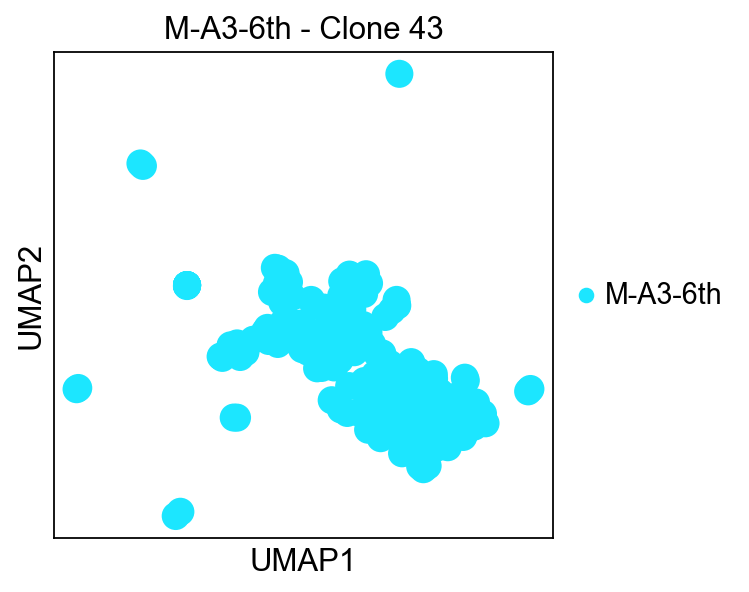

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


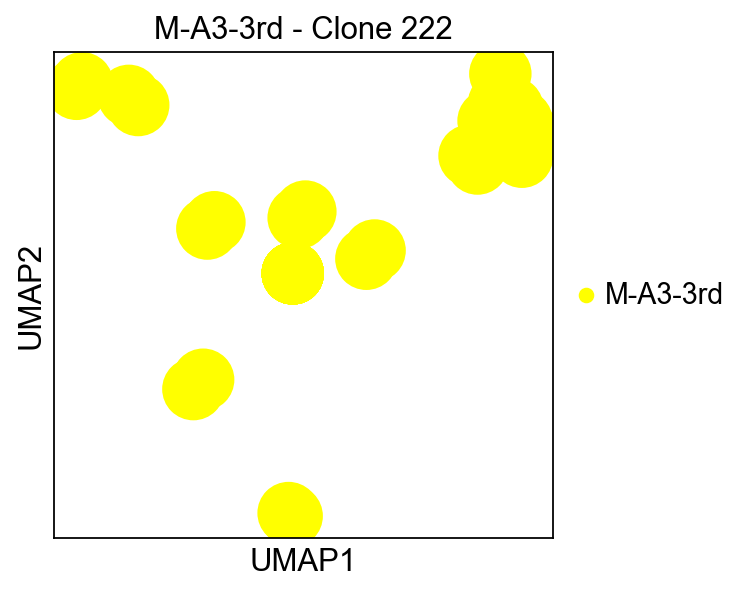

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


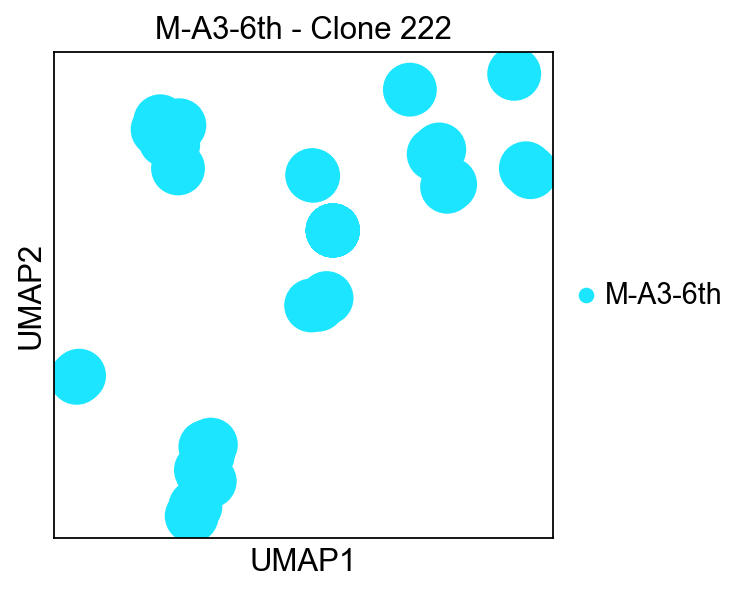

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


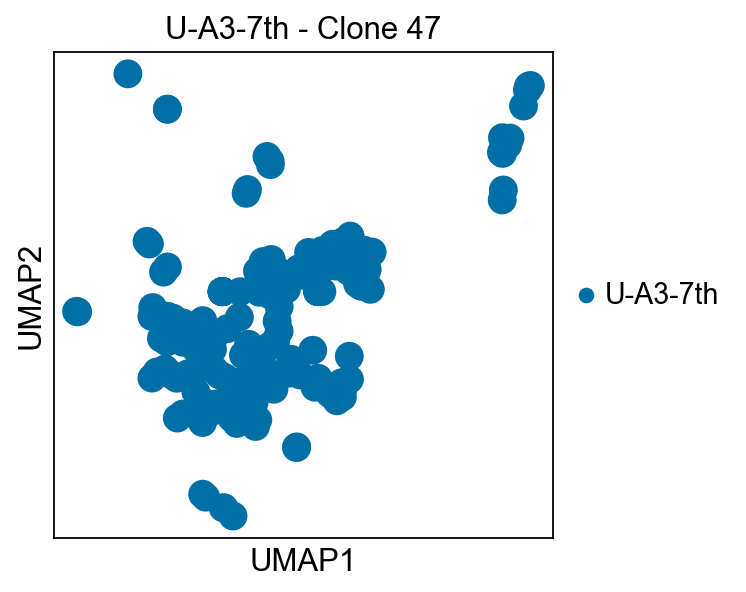

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


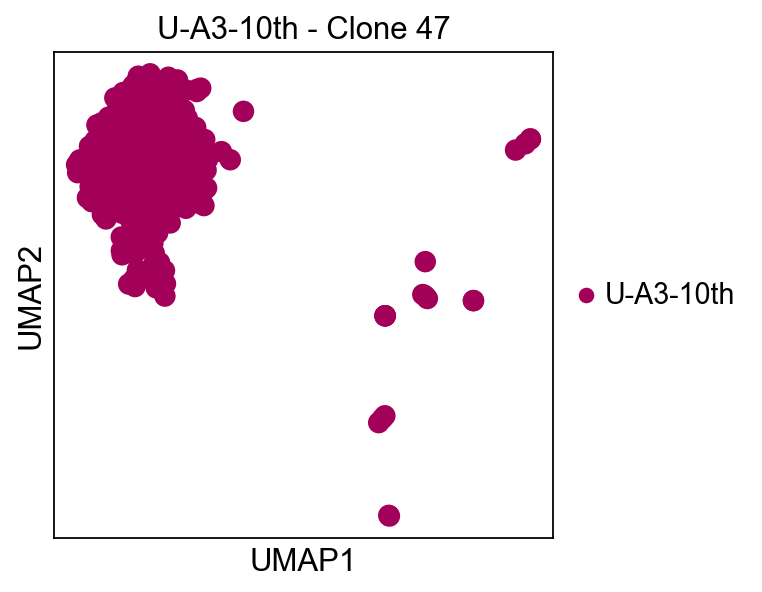

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


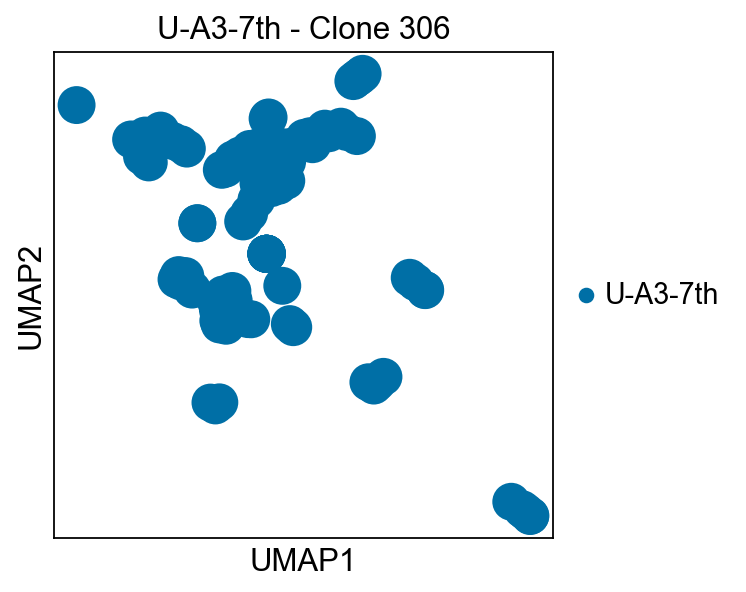

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


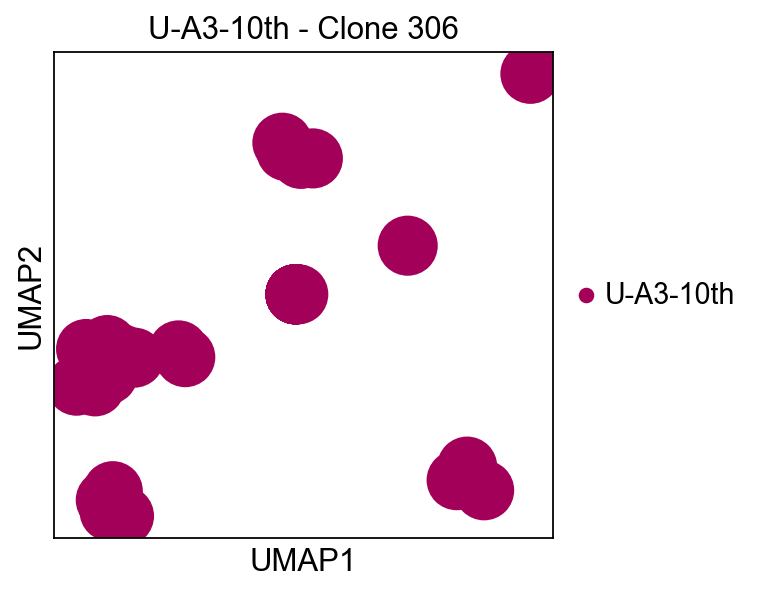

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


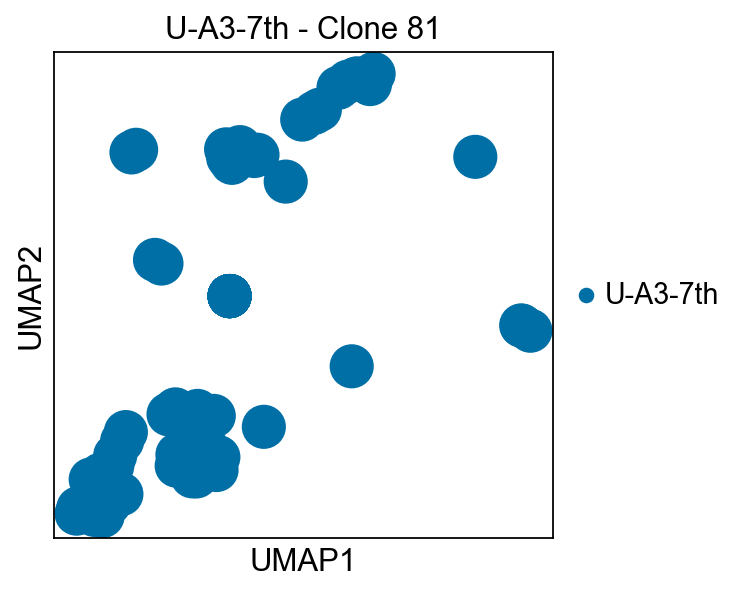

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


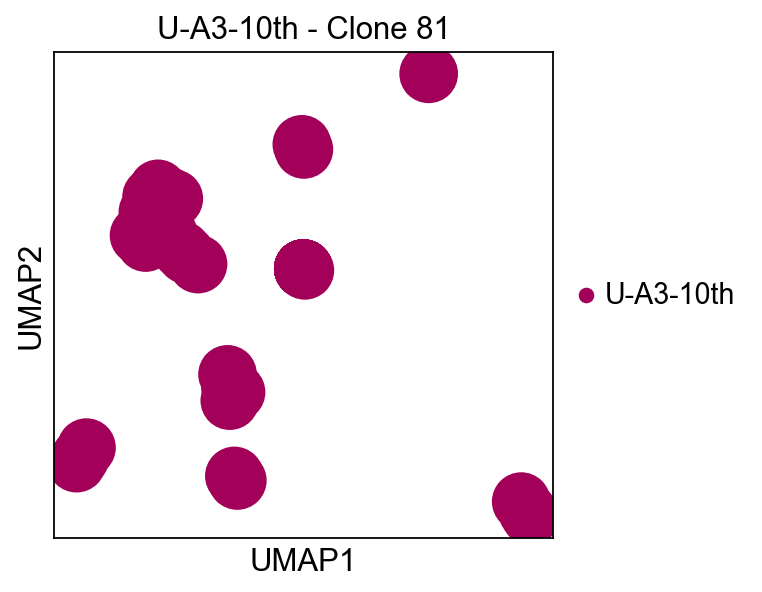

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


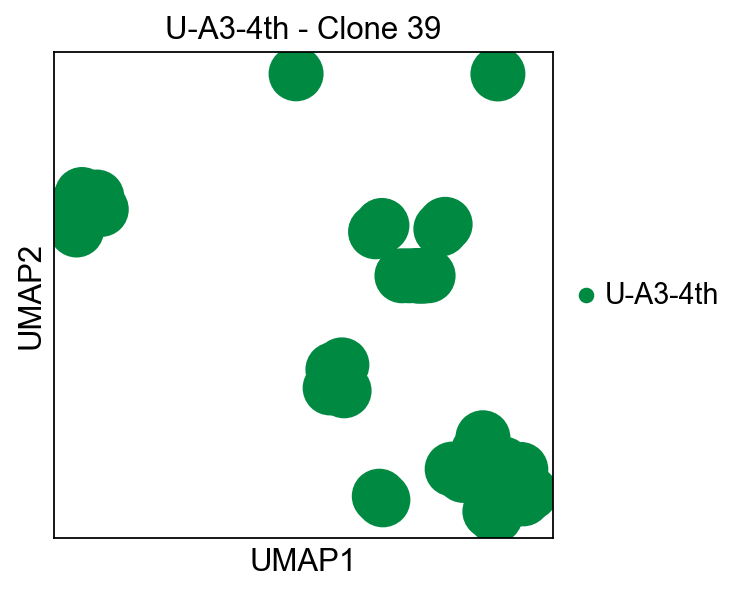

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


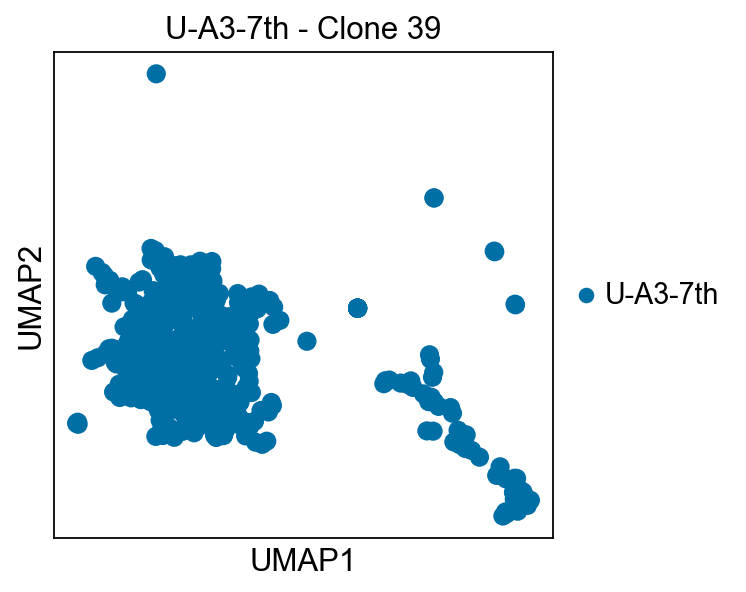

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


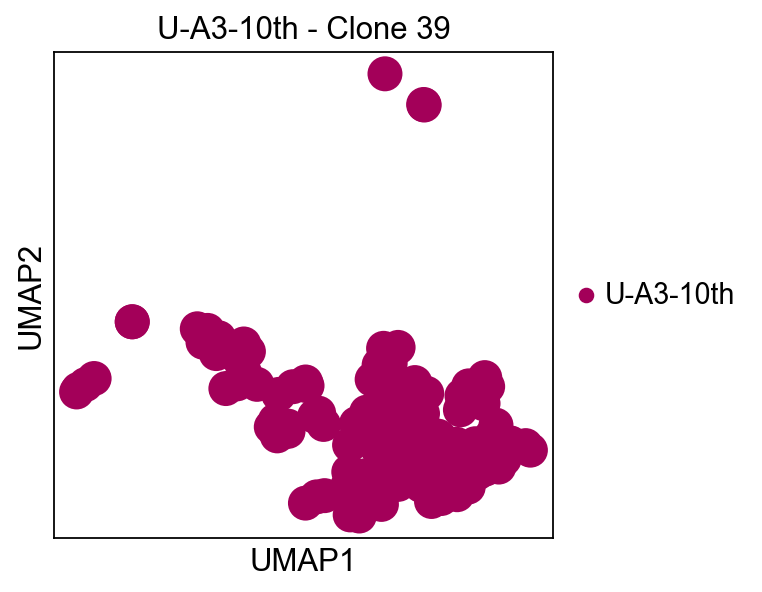

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


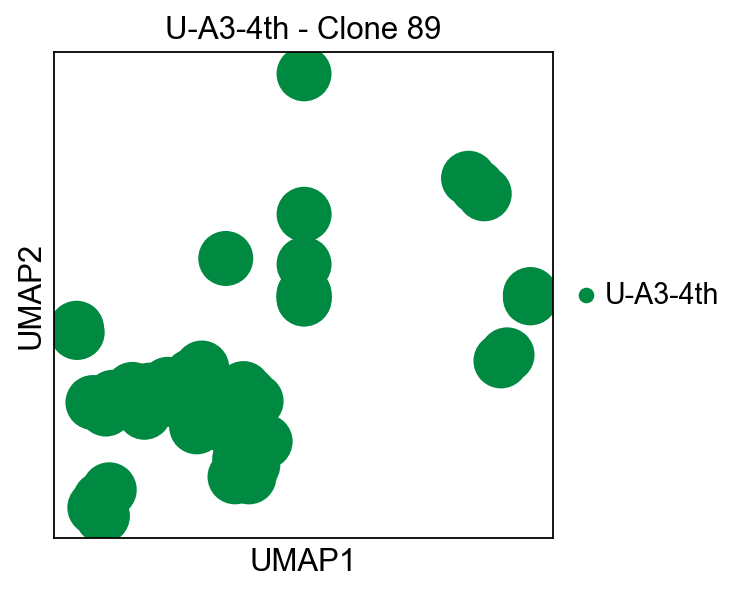

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


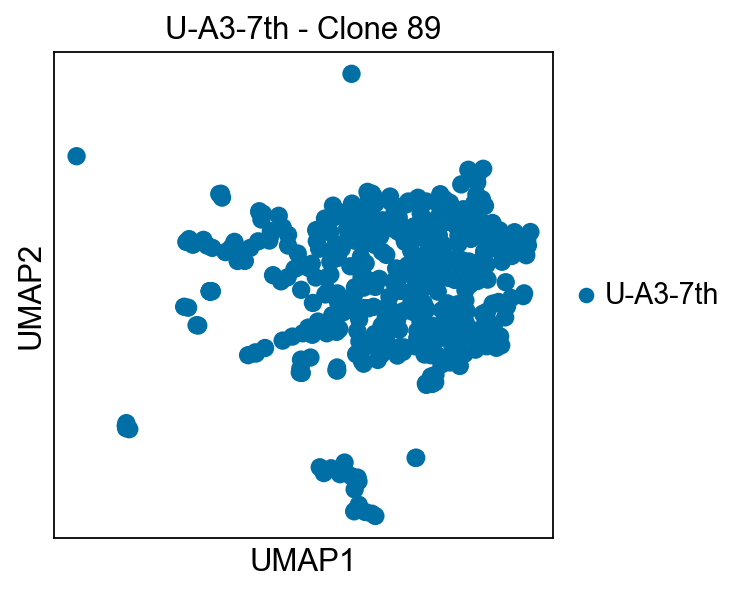

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


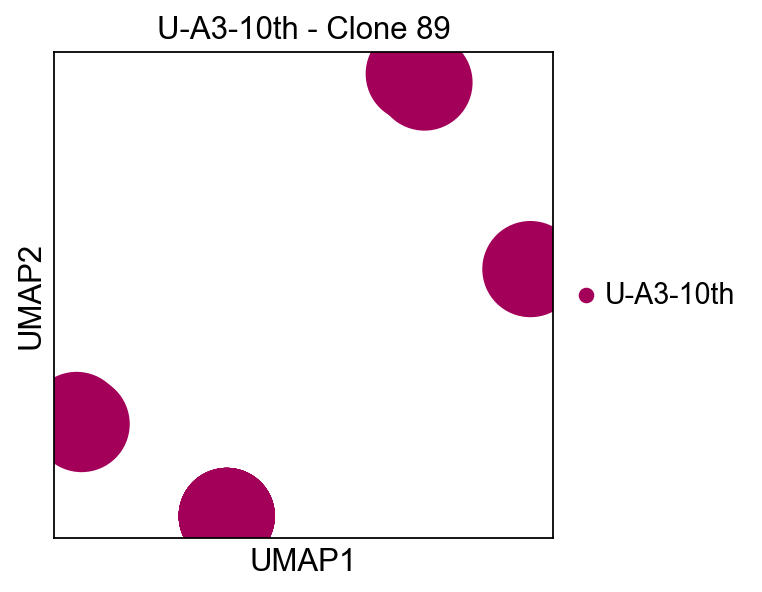

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


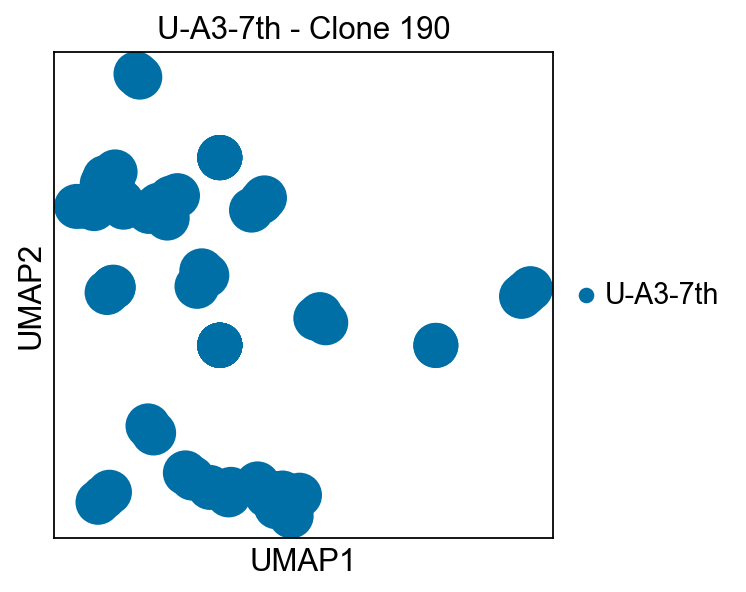

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


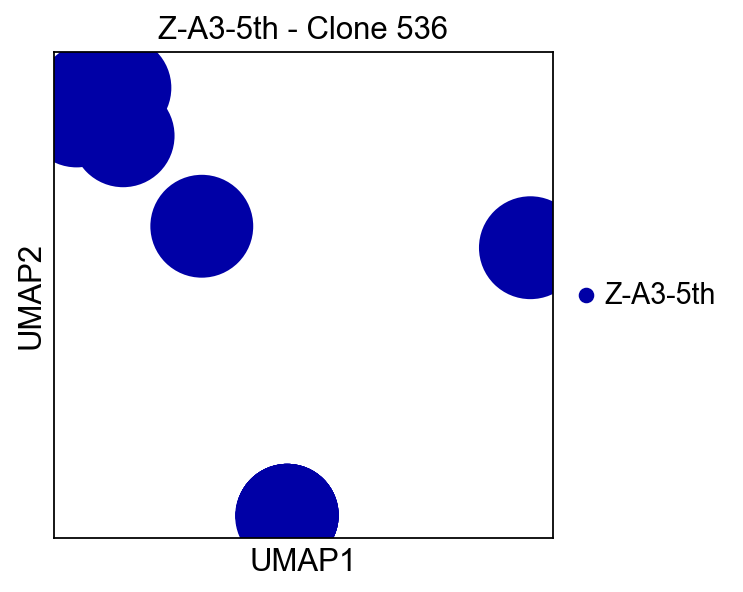

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


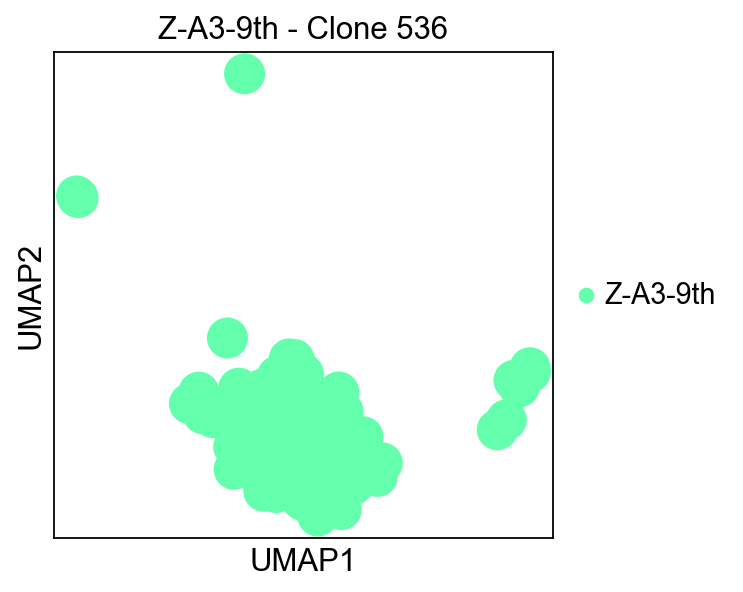

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


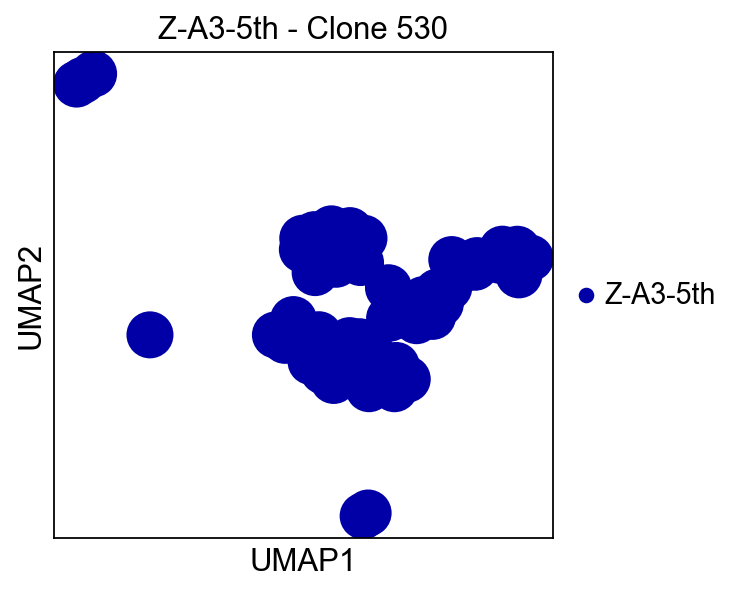

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


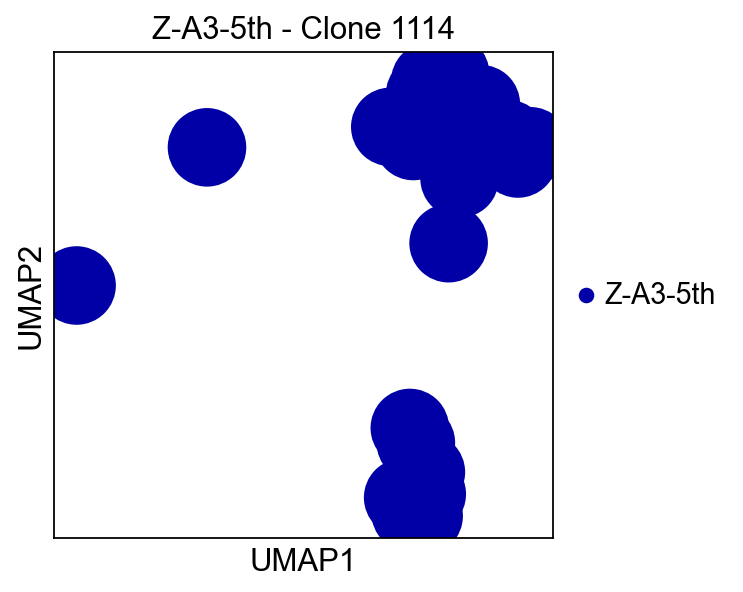

computing UMAP


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_umap.py:166: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['umap'] = {'params': {'a': a, 'b': b}}


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


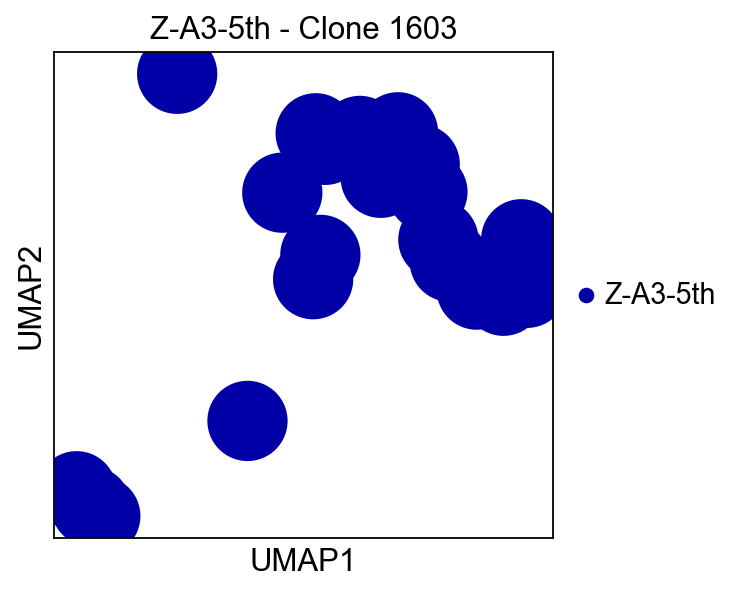

In [45]:
# 080623 Task 2


# Define Thaw/clonotype combinations
combinations = [
    ("M-A3-Uns", "19"), ("M-A3-3rd", "19"), ("M-A3-6th", "19"), ("M-A3-9th", "19"),
    ("M-A3-6th", "14"), ("M-A3-9th", "14"),
    ("M-A3-3rd", "66"), ("M-A3-6th", "66"), ("M-A3-9th", "66"),
    ("M-A3-6th", "697"), ("M-A3-9th", "697"),
    ("M-A3-3rd", "43"), ("M-A3-6th", "43"),
    ("M-A3-3rd", "222"), ("M-A3-6th", "222"),
    ("U-A3-7th", "47"), ("U-A3-10th", "47"),
    ("U-A3-7th", "306"), ("U-A3-10th", "306"),
    ("U-A3-7th", "81"), ("U-A3-10th", "81"),
    ("U-A3-4th", "39"), ("U-A3-7th", "39"), ("U-A3-10th", "39"),
    ("U-A3-4th", "89"), ("U-A3-7th", "89"), ("U-A3-10th", "89"),
    ("U-A3-7th", "190"),
    ("Z-A3-5th", "536"), ("Z-A3-9th", "536"),
    ("Z-A3-5th", "530"), ("Z-A3-5th", "1114"), ("Z-A3-5th", "1603")
]

# Loop through each Thaw/clonotype combination and generate UMAPs
for thaw, clone in combinations:
    # Extract the indices from mdata["airr"] where the Thaw and clone_id match the current combination
    selected_indices = mdata["airr"].obs[(mdata["airr"].obs['Thaw'] == thaw) & (mdata["airr"].obs['clone_id'] == clone)].index
    
    # Use these indices to filter mdata["gex"]
    filtered_data = mdata["gex"][mdata["gex"].obs.index.isin(selected_indices)]
    
    # Check if there's data after filtering
    if filtered_data.shape[0] > 0:
        # Generate the UMAP
        sc.tl.umap(filtered_data)
        
        # Plot the UMAP with the title as the Thaw name and clonotype
        sc.pl.umap(filtered_data, color='Thaw', title=f"{thaw} - Clone {clone}")
    else:
        print(f"No data for Thaw {thaw} in clonotype {clone}.")



In [46]:
columns_in_gex_obs = mdata["gex"].obs.columns
print(columns_in_gex_obs)


Index(['TotalSeq-C0251 anti-human Hashtag 1 Antibody',
       'TotalSeq-C0252 anti-human Hashtag 2 Antibody',
       'TotalSeq-C0253 anti-human Hashtag 3 Antibody',
       'TotalSeq-C0254 anti-human Hashtag 4 Antibody',
       'TotalSeq-C0255 anti-human Hashtag 5 Antibody',
       'TotalSeq-C0256 anti-human Hashtag 6 Antibody',
       'TotalSeq-C0257 anti-human Hashtag 7 Antibody',
       'TotalSeq-C0258 anti-human Hashtag 8 Antibody',
       'TotalSeq-C0259 anti-human Hashtag 9 Antibody',
       'TotalSeq-C0260 anti-human Hashtag 10 Antibody',
       'TotalSeq-C0262 anti-human Hashtag 12 Antibody',
       'TotalSeq-C0263 anti-human Hashtag 13 Antibody',
       'most_likely_hypothesis', 'cluster_feature',
       'negative_hypothesis_probability', 'singlet_hypothesis_probability',
       'doublet_hypothesis_probability', 'Classification', 'Thaw', 'batch',
       'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'pct_counts_ribo', 'total

In [ ]:
# First, compute UMAP for all cells
sc.tl.umap(mdata["gex"])

# Loop through each Thaw/clonotype combination
for thaw, clone in combinations:
    # Create a new color column and set default value as 'grey'
    mdata["gex"].obs['color'] = 'lightgrey'
    
    # Get the indices from mdata["airr"] where the Thaw and clone_id match the current combination
    selected_indices = mdata["airr"].obs[(mdata["airr"].obs['Thaw'] == thaw) & (mdata["airr"].obs['clone_id'] == clone)].index
    
    # Update color for cells of interest to 'green'
    mask = mdata["gex"].obs.index.isin(selected_indices)
    mdata["gex"].obs.loc[mask, 'color'] = 'green'
    
    # Use matplotlib to plot
    fig, ax = plt.subplots()  # Fixed the syntax error here by removing the word 'clone'
    umap_coordinates = mdata["gex"].obsm['X_umap']
    ax.scatter(umap_coordinates[:, 0], umap_coordinates[:, 1], c=mdata["gex"].obs['color'], s=1)
    plt.title(f"{thaw} - Clone {clone}")
    plt.show()


In [ ]:
columns_in_airr = mdata["airr"].obs.columns
print(columns_in_airr)


In [ ]:
# First, compute UMAP for all cells using GEX data
sc.tl.umap(mdata["gex"])

# Loop through each clone-donor combination
for clone, donor in combinations:
    # Create a new color column and set default value as 'lightgrey'
    mdata["gex"].obs['color'] = 'lightgrey'
    
    # Extract the indices from mdata["airr"] where 'clone_id' and 'derived_donor' match the current combination
    selected_indices = mdata["airr"].obs[(mdata["airr"].obs['clone_id'] == clone) & (mdata["airr"].obs['derived_donor'] == donor)].index
    
    # Update color for cells of interest in mdata["gex"] to 'green'
    mask = mdata["gex"].obs.index.isin(selected_indices)
    mdata["gex"].obs.loc[mask, 'color'] = 'green'
    
    # Use matplotlib to plot
    fig, ax = plt.subplots()
    umap_coordinates = mdata["gex"].obsm['X_umap']
    ax.scatter(umap_coordinates[:, 0], umap_coordinates[:, 1], c=mdata["gex"].obs['color'], s=1)
    plt.title(f"Clone {clone} - Donor {donor}")
    plt.show()


In [ ]:
# keep all GEX, but restrict label set to each donor
thaw_to_donor = {
    'Z-A3-Unsti' : "Z-A3-Unsti",
    'Z-A3-1st' : "Z-A3-1st", 
    'Z-A3-5th' : "Z-A3-5th",  
    'Z-A3-9th' : "Z-A3-9th",    
    "M-A3-Unsti" : "NA",  
    "M-A3-3rd" : "NA",
    "M-A3-6th": "NA",
    "M-A3-9th" : "NA",
    "U-A3-Unsti" : "NA",
    "U-A3-4th" : "NA",
    "U-A3-7th": "NA",
    "U-A3-10th": "NA"
}

mdata["gex"].obs["Z_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='Z_only', alpha=0.5, palette={'Z-A3-Unsti':'tab:cyan',
                                                      'Z-A3-1st':'tab:olive',
                                                      'Z-A3-5th':'tab:red',
                                                      "Z-A3-9th":"tab:purple",      
                                                      'NA':'whitesmoke'})

In [ ]:
thaw_to_donor = {
    'Z-A3-Unsti' : "NA",
    'Z-A3-1st' : "NA", 
    'Z-A3-5th' : "NA",  
    'Z-A3-9th' : "NA",    
    "M-A3-Unsti" : "M-A3-Unsti",  
    "M-A3-3rd" : "M-A3-3rd",
    "M-A3-6th": "M-A3-6th",
    "M-A3-9th" : "M-A3-9th",
    "U-A3-Unsti" : "NA",
    "U-A3-4th" : "NA",
    "U-A3-7th": "NA",
    "U-A3-10th": "NA"
}
mdata["gex"].obs["M_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='M_only', alpha=0.5, palette={'M-A3-Unsti':'tab:cyan',
                                                      'M-A3-3rd':'tab:olive',
                                                      "M-A3-6th":'tab:red',   
                                                      'M-A3-9th':'tab:purple',
                                                      'NA':'whitesmoke'})

In [ ]:
thaw_to_donor = {
    'Z-A3-Unsti' : "NA",
    'Z-A3-1st' : "NA", 
    'Z-A3-5th' : "NA",  
    'Z-A3-9th' : "NA",    
    "M-A3-Unsti" : "NA",  
    "M-A3-3rd" : "NA",
    "M-A3-6th": "NA",
    "M-A3-9th" : "NA",
    "U-A3-Unsti" : "U-A3-Unsti",
    "U-A3-4th" : "U-A3-4th",
    "U-A3-7th": "U-A3-7th",
    "U-A3-10th": "U-A3-10th"
}
mdata["gex"].obs["U_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='U_only', alpha=0.5, palette={'U-A3-Unsti':'tab:cyan',
                                                      'U-A3-4th':'tab:olive',
                                                      'U-A3-7th':'tab:red',
                                                      'U-A3-10th':'tab:purple',
                                                      'NA':'whitesmoke'})

In [ ]:
# keep all GEX, but restrict label set to each unstim
thaw_to_donor = {
    'Z-A3-Unsti' : "Z-A3-Unsti",
    'Z-A3-1st' : "NA", 
    'Z-A3-5th' : "NA",  
    'Z-A3-9th' : "NA",    
    "M-A3-Unsti" : "M-A3-Unsti",  
    "M-A3-3rd" : "NA",
    "M-A3-6th": "NA",
    "M-A3-9th" : "NA",
    "U-A3-Unsti" : "U-A3-Unsti",
    "U-A3-4th" : "NA",
    "U-A3-7th": "NA",
    "U-A3-10th": "NA"
}

mdata["gex"].obs["unstim_only"] = mdata["gex"].obs['Thaw'].map(thaw_to_donor)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='unstim_only', alpha=0.5, palette={'M-A3-Unsti':'tab:cyan',
                                                      'Z-A3-Unsti':'tab:olive',
                                                      'U-A3-Unsti':'tab:red',
                                                      'NA':'whitesmoke'})

In [ ]:
# task 3
# 3 UMAPs (one for each donor), non-TCR-repertoire RNA, color by different time points
# create a new column called Sample that applies the predefined sample map
thaw_to_time = {
    
    'Z-A3-Unsti' : 0,
    'Z-A3-1st' : 1, 
    'Z-A3-5th' : 5,  
    'Z-A3-9th' : 9,    
    "M-A3-Unsti" : 0,  
    "M-A3-3rd" : 3,
    "M-A3-6th": 6,
    "M-A3-9th" : 9,
    "U-A3-Unsti" : 0,
    "U-A3-4th" : 4,
    "U-A3-7th": 7,
    "U-A3-10th": 10
}
mdata["gex"].obs["Time"] = mdata["gex"].obs['Thaw'].map(thaw_to_time)
sc.tl.umap(mdata["gex"])
sc.pl.umap(mdata["gex"], color='Time' )#, save="UMAP.png")

In [ ]:
from mudata import MuData

mdata = MuData({
    "gex": mdata["gex"],
    "airr": mdata["airr"],
    "prot": mdata["prot"]
})


mdata.update()
mdata["airr"] 

In [ ]:
mdata["airr"].obs.batch.index.intersection(mdata["airr"].obs.Thaw.index)

In [ ]:
print(mdata["prot"].obs.columns)


In [ ]:
# Convert 'Thaw' column to Categorical type and add 'N/A' as a category
mdata["airr"].obs["Thaw"] = mdata["airr"].obs["Thaw"].astype('category').cat.add_categories(['N/A'])

# Convert 'Thaw' column back to string type
mdata["airr"].obs["Thaw"] = mdata["airr"].obs["Thaw"].astype(str)

# Create DataFrames from the respective columns
first_df = pd.DataFrame(mdata["gex"].obs["Thaw"], dtype=object)
second_df = pd.DataFrame(mdata["airr"].obs.clonal_expansion)

# Perform a left join to align the indices and fill missing values with 'N/A'
aligned_df = first_df.join(second_df, how='right').fillna('N/A')

# Update the 'Thaw' column in the mdata["airr"] AnnData object
mdata["airr"].obs["Thaw"] = aligned_df['Thaw']

# Return the updated 'Thaw' column for verification
mdata["airr"].obs["Thaw"].head()  # Displaying the first few rows for verification


In [ ]:
# remove all barcodes 
#mdata["airr"].obs["Thaw"] =  #.obs.Thaw

# Create a DataFrame from the first column
first_df = pd.DataFrame(mdata["gex"].obs["Thaw"], dtype=object) #mdata["gex"].obs["Thaw"]

# Create a DataFrame from the second column
second_df = pd.DataFrame(mdata["airr"].obs.clonal_expansion ) # mdata["airr"].obs.clonal_expansion

# Perform a left join to align the indices and fill missing values with 'N/A'
aligned_df = first_df.join(second_df, how='right').fillna('N/A')
print(aligned_df)

# Update the 'second_column' in the AnnData object
mdata["airr"].obs["Thaw"] = aligned_df['Thaw']

# 
#mdata["airr"].obs.Thaw, mdata["airr"].obs.clonal_expansion
# Perform a left join to align the indices and fill missing values with 'N/A'
# mdata["airr"].obs["Thaw"] = mdata["gex"].obs["Thaw"].join(mdata["airr"].obs.clonal_expansion,
#                                                           how='left', rsuffix='_second').fillna('N/A')

# Update the 'second_column' in the AnnData object
#adata.obs['second_column'] = aligned_df['second_column_second']
mdata["airr"].obs["Thaw"]

In [ ]:
mdata["airr"].obs["Thaw"]

In [47]:
mdata["airr"][mdata["airr"].obs["Thaw"] == thaw_name]

NameError: name 'thaw_name' is not defined

In [ ]:
# Define a color map that includes lightgrey for the default_color_value
cmap_custom = plt.cm.viridis
cmap_custom.set_under('lightgrey')

# Get unique Thaw values
unique_thaws = mdata["gex"].obs.Thaw.unique()

# Set the default color value to the minimum clone_id_size minus a small offset (e.g., 0.1)
default_color_value = mdata["airr"].obs['clone_id_size'].min() - 0.1

for thaw in unique_thaws:
    # Create a new color column and set default value
    mdata["gex"].obs['color'] = default_color_value
    
    # Get the indices from mdata["airr"] where the Thaw matches the current Thaw
    selected_indices_airr = mdata["airr"].obs[mdata["airr"].obs['Thaw'] == thaw].index
    
    # Get common indices between mdata["gex"] and the selected indices from mdata["airr"]
    common_indices = mdata["gex"].obs.index.intersection(selected_indices_airr)
    
    # Update the color based on clone_id_size for cells of interest
    mask = mdata["gex"].obs.index.isin(common_indices)
    mdata["gex"].obs.loc[mask, 'color'] = mdata["airr"].obs.loc[common_indices, 'clone_id_size']
    
    # Use matplotlib to plot
    fig, ax = plt.subplots()
    umap_coordinates = mdata["gex"].obsm['X_umap']
    scatter = ax.scatter(umap_coordinates[:, 0], umap_coordinates[:, 1], c=mdata["gex"].obs['color'], s=1, cmap=cmap_custom, vmin=default_color_value + 0.01)
    plt.colorbar(scatter, ax=ax)
    plt.title(f"{thaw} - Clone ID Size")
    plt.show()


In [ ]:
import os
os.getcwd()


In [ ]:
print(mdata["airr"].obs.columns)
print(mdata["gex"].obs.columns)


In [ ]:
# clonal expansion -- do all this for each sample (do one for all samples, then do by donor)

mdata["airr"].obs["Thaw"] = mdata["gex"].obs["Thaw"]

for thaw_name in mdata["gex"].obs.Thaw.unique():
    # so now we want to apply the thaw labels to the airr and subset on that
    
    mdata_subset = mu.MuData({"gex": mdata["gex"][mdata["gex"].obs.Thaw == thaw_name],  
                   "airr": mdata["airr"][mdata["airr"].obs["Thaw"] == thaw_name],
                   "prot": mdata["prot"][mdata["prot"].obs.Thaw == thaw_name]})
    
    
    #print(mdata_subset["airr"])
    # using default parameters, `ir_dist` will compute nucleotide sequence identity
    # compute the  clonotypes on the subset but plot the rest                         
    ir.pp.ir_dist(mdata_subset)
    ir.tl.define_clonotypes(mdata_subset, receptor_arms="all", dual_ir="primary_only")
    #ir.tl.clonotype_network(mdata_subset, min_cells=30)
    ir.tl.clonal_expansion(mdata_subset)
    #print(mdata_subset["airr"].obs)#["clonal_expansion"])
    ce_name = thaw_name +"_clonal_expansion"
    ci_name = thaw_name + "_clone_id_size"
    mdata["airr"].obs[ce_name] = mdata_subset["airr"].obs["clonal_expansion"]
    mdata["airr"].obs[ci_name] = mdata_subset["airr"].obs["clone_id_size"]
#     temp_mdata = mu.MuData({"gex": file_list[0],  
#                    "airr": file_list[1],
#                    "prot": file_list[2]})
    mdata.update() # this shouldn't do anything
    print(thaw_name)
    mu.pl.embedding(
        mdata, basis="gex:umap", color=["airr:"+ce_name, "airr:"+ci_name]
    )
    # need to have the rna data umap computed
    # again change the groupby to use your sample labels
    #ir.pl.clonal_expansion( # groupby="gex:cluster"
    #    mdata_subset, target_col="clone_id" , clip_at=10, normalize=False, groupby="gex:Sample"
    #)
    #ir.pl.clonal_expansion(mdata_subset, target_col="clone_id", clip_at=10, groupby="gex:Sample")

In [ ]:
# clonal expansion -- do all this for each sample (do one for all samples, then do by donor)
ir.tl.clonal_expansion(mdata)
mu.pl.embedding(
    mdata, basis="gex:umap", color=["airr:clonal_expansion", "airr:clone_id_size"]
)
# need to have the rna data umap computed
# again change the groupby to use your sample labels
ir.pl.clonal_expansion( # groupby="gex:cluster"
    mdata, target_col="clone_id" , clip_at=10, normalize=False, groupby="gex:Time"
)
ir.pl.clonal_expansion(mdata, target_col="clone_id", clip_at=10, groupby="gex:Time")

In [ ]:
# now let's examine the tcr data more
mdata["airr"].obs.receptor_type

In [ ]:
mdata["airr"].obs.receptor_subtype

In [ ]:
mdata["airr"].obs.chain_pairing

In [ ]:
# Get the indices of rows with "nan" values in mdata["gex"].obs
nan_gex_indices = mdata["gex"].obs.index[mdata["gex"].obs['Thaw'].isna()]

# Extract the corresponding rows from mdata["airr"].obs using these indices
nan_airr_data = mdata["airr"].obs.loc[nan_gex_indices]

# Group by clone_id and Thaw to get the count of cells
grouped_counts = nan_airr_data.groupby(['clone_id', 'Thaw']).size().reset_index(name='count')

# Convert the grouped data to a pivot table for better visualization
pivot_table = pd.pivot_table(grouped_counts, values='count', index=['clone_id'], columns=['Thaw'], fill_value=0)

print(pivot_table)


In [48]:
# Get common indices between mdata["gex"].obs and mdata["airr"].obs
common_indices = mdata["gex"].obs.index.intersection(mdata["airr"].obs.index)

# Extract the 'clone_id' from mdata["airr"] for only the common indices
mdata["gex"].obs.loc[common_indices, "clone_id"] = mdata["airr"].obs.loc[common_indices, "clone_id"]

# Step 1: Identify Clones Labeled as NaN
# Filter the GEX data for cells where the clonotype is NaN
nan_clones_gex = mdata["gex"][mdata["gex"].obs['clone_id'].isna()]

# Step 2: Analyze GEX Data
# Group by the thaw and count the number of cells for each NaN clone
clone_counts_by_thaw_gex = nan_clones_gex.obs.groupby('Thaw').size()

# Step 3: Display Number of Cells for Different Thaws
print(clone_counts_by_thaw_gex)


Thaw
M-A3-3rd      1912
M-A3-6th      2153
M-A3-9th      1294
M-A3-Unsti    2263
U-A3-4th      1557
U-A3-7th      2038
U-A3-10th     1501
U-A3-Unsti    2533
Z-A3-1st      1377
Z-A3-5th      1447
Z-A3-9th      1245
Z-A3-Unsti    2276
dtype: int64


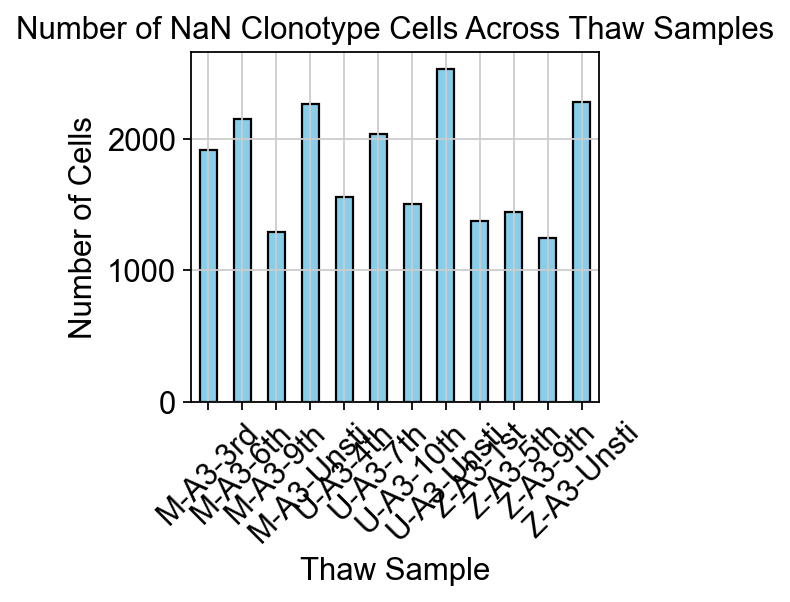

In [49]:
# Group the nan_clones_gex by Thaw and count the number of cells
nan_clone_counts = nan_clones_gex.obs.groupby('Thaw').size()

# Plot a bar chart using the counts
nan_clone_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Number of NaN Clonotype Cells Across Thaw Samples')
plt.ylabel('Number of Cells')
plt.xlabel('Thaw Sample')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [50]:
mdata['prot_before_full_qc'].obs['Thaw'] = mdata['gex'].obs['Thaw']


# Compute UMAP for the protein modality
sc.tl.umap(mdata['prot_before_full_qc'])

# Plot the UMAP for the protein modality and color by 'Thaw'
sc.pl.umap(mdata['prot_before_full_qc'], color = 'Thaw')


KeyError: 'prot_before_full_qc'

In [51]:
# Assign the "Thaw" attribute
mdata['raw_protein'].obs['Thaw'] = mdata['gex'].obs['Thaw']

# Perform PCA
sc.pp.pca(mdata['raw_protein'])

# Compute neighbors based on PCA components
sc.pp.neighbors(mdata['raw_protein'], use_rep='X_pca')  # use_rep='X_pca' is the default and can be omitted

# Compute UMAP
sc.tl.umap(mdata['raw_protein'])

# Plot the UMAP colored by "Thaw"
sc.pl.umap(mdata['raw_protein'], color='Thaw')


KeyError: 'raw_protein'

In [ ]:
mdata['prot']

In [ ]:
# Check if the 'Thaw' column exists
if 'Thaw' in mdata['prot'].obs.columns:
    print("'Thaw' column successfully added.")
else:
    print("'Thaw' column not found.")

# Check for NaN values in the 'Thaw' column
num_nan = mdata['prot'].obs['Thaw'].isna().sum()
if num_nan > 0:
    print(f"There are {num_nan} unmatched hashtags in the 'Thaw' column.")
else:
    print("All hashtags matched successfully.")

# Display the distribution of 'Thaw' values
print("\nDistribution of 'Thaw' values:")
print(mdata['prot'].obs['Thaw'].value_counts())



computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:04)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


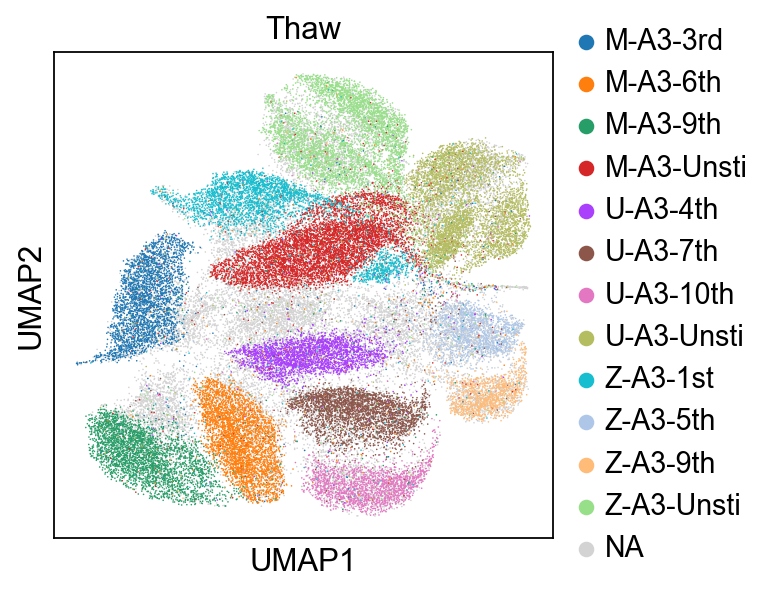

In [52]:

# Compute UMAP
sc.tl.umap(mdata['prot'])

# Plot the UMAP colored by "Thaw"
sc.pl.umap(mdata['prot'], color='Thaw')

In [ ]:
print(mdata["airr"].obs["Thaw"].value_counts())


In [53]:
m_clones = mdata["airr"].obs[mdata["airr"].obs['derived_donor'] == 'M'].copy()
print(m_clones.head())


KeyError: 'derived_donor'

In [54]:
def determine_tier_and_rating(group):
    # If the group is empty, return -1 as the default bin
    if group.empty:
        return pd.Series({'bin': -1, 'rating': None})

    # Check the predominant thaw for the clone
    predominant_thaw = group['predominant_thaw'].iloc[0]
    
    # Initialize rating to None (we'll compute it only for bins 2, 3, 4, 6, 7, 8, 10, 11, and 12)
    rating = None
    
    # Mapping of thaws to bins
    thaw_to_bin = {
        'M-A3-Unsti': 1, 
        'M-A3-3rd': 2, 
        'M-A3-6th': 3, 
        'M-A3-9th': 4,
        'Z-A3-Unsti': 5, 
        'Z-A3-1st': 6, 
        'Z-A3-5th': 7, 
        'Z-A3-9th': 8,
        'U-A3-Unsti': 9, 
        'U-A3-4th': 10, 
        'U-A3-7th': 11, 
        'U-A3-10th': 12
    }
    
    bin_num = thaw_to_bin.get(predominant_thaw, -1)
    
    # Rating calculations
    if bin_num == 2:
        rating = group[group['Thaw'] == 'M-A3-3rd'].shape[0] / (group[group['Thaw'] == 'M-A3-Unsti'].shape[0] + 1)
    elif bin_num == 3:
        rating = group[group['Thaw'] == 'M-A3-6th'].shape[0] / (group[group['Thaw'] == 'M-A3-3rd'].shape[0] + 1)
    elif bin_num == 4:
        rating = group[group['Thaw'] == 'M-A3-9th'].shape[0] / (group[group['Thaw'] == 'M-A3-6th'].shape[0] + 1)
    elif bin_num == 6:
        rating = group[group['Thaw'] == 'Z-A3-1st'].shape[0] / (group[group['Thaw'] == 'Z-A3-Unsti'].shape[0] + 1)
    elif bin_num == 7:
        rating = group[group['Thaw'] == 'Z-A3-5th'].shape[0] / (group[group['Thaw'] == 'Z-A3-1st'].shape[0] + 1)
    elif bin_num == 8:
        rating = group[group['Thaw'] == 'Z-A3-9th'].shape[0] / (group[group['Thaw'] == 'Z-A3-5th'].shape[0] + 1)
    elif bin_num == 10:
        rating = group[group['Thaw'] == 'U-A3-4th'].shape[0] / (group[group['Thaw'] == 'U-A3-Unsti'].shape[0] + 1)
    elif bin_num == 11:
        rating = group[group['Thaw'] == 'U-A3-7th'].shape[0] / (group[group['Thaw'] == 'U-A3-4th'].shape[0] + 1)
    elif bin_num == 12:
        rating = group[group['Thaw'] == 'U-A3-10th'].shape[0] / (group[group['Thaw'] == 'U-A3-7th'].shape[0] + 1)
    
    return pd.Series({'bin': bin_num, 'rating': rating})



clone_sizes = mdata['airr'].obs.groupby('clone_id').size()

# Filter out clones with fewer than 10 cells
large_clones = mdata['airr'].obs[mdata['airr'].obs['clone_id'].isin(clone_sizes[clone_sizes > 10].index)]

# Group by clone_id and determine the bin and rating for each unique clone in the filtered data
clone_bins_ratings = large_clones.groupby('clone_id').apply(determine_tier_and_rating)

# Count the number of clones in each bin
bin_counts = clone_bins_ratings['bin'].value_counts().sort_index()

print(bin_counts)



KeyError: 'predominant_thaw'

In [ ]:
def generate_secondary_ratings(group):
    # If the group is empty, return None for the secondary rating
    if group.empty:
        return pd.Series({'secondary_rating': None})

    # Initialize secondary rating to None
    secondary_rating = None
    
    # Check the predominant thaw for the clone
    predominant_thaw = group['predominant_thaw'].iloc[0]
    
    # Compute secondary ratings based on the predominant thaw
    if predominant_thaw == 'U-A3-7th':
        secondary_rating = group[group['Thaw'] == 'U-A3-10th'].shape[0] / (group[group['Thaw'] == 'U-A3-7th'].shape[0] + 1)
    elif predominant_thaw == 'U-A3-4th':
        secondary_rating = group[group['Thaw'] == 'U-A3-7th'].shape[0] / (group[group['Thaw'] == 'U-A3-4th'].shape[0] + 1)
    elif predominant_thaw == 'Z-A3-5th':
        secondary_rating = group[group['Thaw'] == 'Z-A3-7th'].shape[0] / (group[group['Thaw'] == 'Z-A3-5th'].shape[0] + 1)
    elif predominant_thaw == 'Z-A3-1st':
        secondary_rating = group[group['Thaw'] == 'Z-A3-5th'].shape[0] / (group[group['Thaw'] == 'Z-A3-1st'].shape[0] + 1)
    elif predominant_thaw == 'M-A3-6th':
        secondary_rating = group[group['Thaw'] == 'M-A3-9th'].shape[0] / (group[group['Thaw'] == 'M-A3-6th'].shape[0] + 1)
    elif predominant_thaw == 'M-A3-3rd':
        secondary_rating = group[group['Thaw'] == 'M-A3-6th'].shape[0] / (group[group['Thaw'] == 'M-A3-3rd'].shape[0] + 1)
    
    return pd.Series({'secondary_rating': secondary_rating})

# Group by clone_id and determine the secondary rating for each unique clone in the filtered data
clone_secondary_ratings = large_clones.groupby('clone_id').apply(generate_secondary_ratings)

# Print the first few rows to check the results
print(clone_secondary_ratings.head())


In [ ]:
clone_ids_to_check = ['323', '46', '68', '665', '935', '2222', '189', '650', '1281', '411', '1291', 
                      '756', '144', '283', '625', '1149', '351', '427', '635', '1006', '1059', '1092', 
                      '1750', '1688', '535', '707', '2205', '2523', '557', '1796', '1367', '2190', '1763', 
                      '1021', '1748', '1038']

for clone_id in clone_ids_to_check:
    try:
        rating = clone_secondary_ratings.loc[clone_id, 'secondary_rating']
        print(rating)
    except KeyError:
        pass  # Do nothing if the clone is not found


In [ ]:
print(mdata['airr'].obs['clone_id'].dtype)


In [126]:
adata_gex_2 = mdata['gex']

filtered out 3757 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:36)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:33)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 15 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:47)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


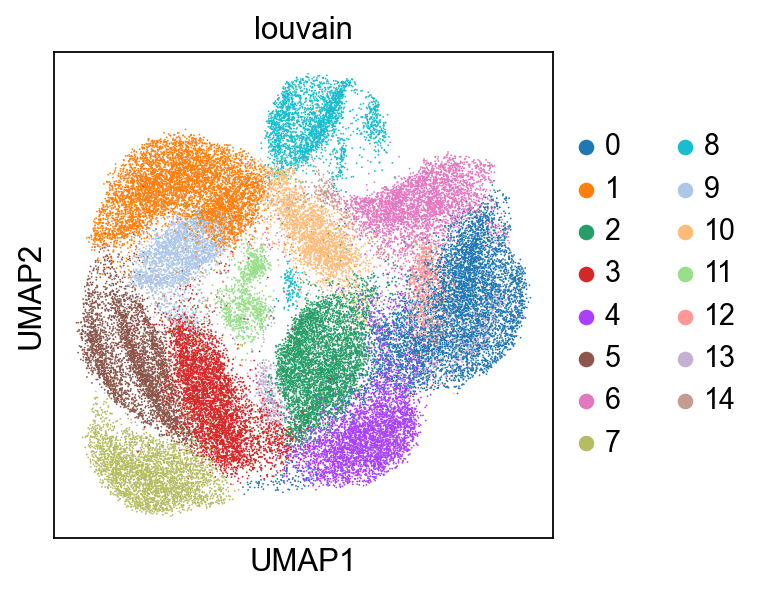

In [127]:
import scanpy as sc

# 1. Filtering cells and genes
sc.pp.filter_cells(adata_gex_2, min_genes=200)
sc.pp.filter_genes(adata_gex_2, min_cells=3)

# 2. Normalization
sc.pp.normalize_total(adata_gex_2, target_sum=1e4)

# 3. Log-transformation
sc.pp.log1p(adata_gex_2)

# 4. Identifying highly variable genes
sc.pp.highly_variable_genes(adata_gex_2, min_mean=0.0125, max_mean=3, min_disp=0.5)

# 5. Scaling data
sc.pp.scale(adata_gex_2, max_value=10)

# 6. Dimensionality reduction (PCA)
sc.tl.pca(adata_gex_2, svd_solver='arpack')

# 7. Computing the neighborhood graph
sc.pp.neighbors(adata_gex_2, n_neighbors=10, n_pcs=40)

# 8. Clustering
sc.tl.louvain(adata_gex_2)

# 9. Visualization using UMAP
sc.tl.umap(adata_gex_2)

# Plotting UMAP visualization with clusters
sc.pl.umap(adata_gex_2, color='louvain')


In [128]:
# Extracting clone_ids and thaw_ids from adata_gex_2
clone_ids = adata_gex_2.obs["clone_id"] if "clone_id" in adata_gex_2.obs.columns else None
thaw_ids = adata_gex_2.obs["thaw"] if "thaw" in adata_gex_2.obs.columns else None


In [138]:
import socket
socket.gethostname()


'Leafyduckempire'

In [137]:
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns

# Ensure that clone_ids and thaw_ids (if available) are Series objects indexed by cell names
clone_ids = pd.Series(clone_ids, index=adata_gex_2.obs_names)
if thaw_ids is not None:
    thaw_ids = pd.Series(thaw_ids, index=adata_gex_2.obs_names)

# Label cells in adata_gex_2 based on their group
adata_gex_2.obs["groups"] = "Other"  # default label

for group_name, criteria in group_combinations.items():
    clone_criteria = criteria['clones']
    thaw_criteria = criteria.get('thaws', [])

    if clone_criteria and thaw_criteria and "thaw" in adata_gex_2.obs.columns:
        is_in_group = adata_gex_2.obs["clone_id"].isin(clone_criteria) & adata_gex_2.obs["thaw"].isin(thaw_criteria)
    elif clone_criteria:
        is_in_group = adata_gex_2.obs["clone_id"].isin(clone_criteria)
    elif thaw_criteria and "thaw" in adata_gex_2.obs.columns:
        is_in_group = adata_gex_2.obs["thaw"].isin(thaw_criteria)
    else:
        continue  # No criteria specified, so we skip this group
    
    adata_gex_2.obs.loc[is_in_group, "groups"] = group_name

# Initialize an empty matrix to store differential expression metrics
diff_expr_matrix = np.zeros((len(genes_of_interest), len(group_combinations)))

# For each group, perform differential expression
for i, group_name in enumerate(group_combinations.keys()):
    # Subset the data for the current group and the rest
    adata_group = adata_gex_2[adata_gex_2.obs["groups"] == group_name]
    adata_rest = adata_gex_2[adata_gex_2.obs["groups"] != group_name]
    
    # Concatenate the two datasets with temporary group labels
    adata_combined = adata_group.concatenate(adata_rest, join='outer')
    adata_combined.obs["group"] = ["group"] * len(adata_group) + ["rest"] * len(adata_rest)
    
    # Perform differential expression
    sc.tl.rank_genes_groups(adata_combined, "group", method="wilcoxon", n_genes=len(genes_of_interest))
    
    # Extract log-fold changes for the genes of interest
    lfc = adata_combined.uns["rank_genes_groups"]["logfoldchanges"]
    for j, gene in enumerate(genes_of_interest):
        if gene in lfc.dtype.names:
            diff_expr_matrix[j, i] = lfc[gene]

# Visualize the matrix using a heatmap with dendrograms
sns.clustermap(diff_expr_matrix, row_cluster=True, col_cluster=True, 
               xticklabels=group_combinations.keys(), yticklabels=genes_of_interest, 
               cmap="bwr", center=0)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:04:10)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:21)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:18)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


MemoryError: Unable to allocate 4.32 GiB for an array with shape (46697, 24851) and data type float32

In [131]:
# Only considering the first 5 groups from group_combinations
subset_group_combinations = {k: group_combinations[k] for k in list(group_combinations.keys())[:3]}

# Label cells in adata_gex_2 based on their group
adata_gex_2.obs["groups"] = "Other"  # default label

for group_name, criteria in subset_group_combinations.items():
    clone_criteria = criteria['clones']
    thaw_criteria = criteria.get('thaws', [])

    if clone_criteria and thaw_criteria and "thaw" in adata_gex_2.obs.columns:
        is_in_group = adata_gex_2.obs["clone_id"].isin(clone_criteria) & adata_gex_2.obs["thaw"].isin(thaw_criteria)
    elif clone_criteria:
        is_in_group = adata_gex_2.obs["clone_id"].isin(clone_criteria)
    elif thaw_criteria and "thaw" in adata_gex_2.obs.columns:
        is_in_group = adata_gex_2.obs["thaw"].isin(thaw_criteria)
    else:
        continue  # No criteria specified, so we skip this group
    
    adata_gex_2.obs.loc[is_in_group, "groups"] = group_name

# Initialize an empty matrix to store differential expression metrics
diff_expr_matrix_subset = np.zeros((len(genes_of_interest), len(subset_group_combinations)))

# For each group in the subset, perform differential expression
for i, group_name in enumerate(subset_group_combinations.keys()):
    # Subset the data for the current group and the rest
    adata_group = adata_gex_2[adata_gex_2.obs["groups"] == group_name]
    adata_rest = adata_gex_2[adata_gex_2.obs["groups"] != group_name]
    
    # Concatenate the two datasets with temporary group labels
    adata_combined = adata_group.concatenate(adata_rest, join='outer')
    adata_combined.obs["group"] = ["group"] * len(adata_group) + ["rest"] * len(adata_rest)
    
    # Perform differential expression
    sc.tl.rank_genes_groups(adata_combined, "group", method="wilcoxon", n_genes=len(genes_of_interest))
    
    # Extract log-fold changes for the genes of interest
    lfc = adata_combined.uns["rank_genes_groups"]["logfoldchanges"]
    for j, gene in enumerate(genes_of_interest):
        if gene in lfc.dtype.names:
            diff_expr_matrix_subset[j, i] = lfc[gene]

# Visualize the matrix using a heatmap with dendrograms
sns.clustermap(diff_expr_matrix_subset, row_cluster=True, col_cluster=True, 
               xticklabels=subset_group_combinations.keys(), yticklabels=genes_of_interest, 
               cmap="bwr", center=0)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


MemoryError: Unable to allocate 4.35 GiB for an array with shape (47024, 24851) and data type float32

In [70]:
diff_exp_combinations = [
    {"clones": ["19"], "thaws": ["M-A3-9th"], "name": "Clone 19 in M-A3-9th thaw"},
    {"clones": ["19"], "thaws": ["M-A3-6th"], "name": "Clone 19 in M-A3-6th thaw"},
    {"clones": ["19"], "thaws": ["M-A3-3rd"], "name": "Clone 19 in M-A3-3rd thaw"},
    {"clones": ["4"], "name": "Clone 4 in all thaws"},
    {"clones": ["28"], "name": "Clone 28 in all thaws"},
    {"clones": ["9"], "thaws": ["U-A3-4th"], "name": "Clone 9 in U-A3-4th thaw"},
    {"clones": ["9"], "thaws": ["U-A3-7th"], "name": "Clone 9 in U-A3-7th thaw"},
    {"clones": ["39"], "thaws": ["U-A3-7th"], "name": "Clone 39 in U-A3-7th thaw"},
    {"clones": ["39"], "thaws": ["U-A3-10th"], "name": "Clone 39 in U-A3-10th thaw"},
    {"clones": ["47"], "thaws": ["U-A3-10th"], "name": "Clone 47 in U-A3-10th thaw"},
    {"clones": ["47"], "thaws": ["U-A3-7th"], "name": "Clone 47 in U-A3-7th thaw"},
    {"clones": ["89"], "thaws": ["U-A3-7th"], "name": "Clone 89 in U-A3-7th thaw"},
    {"clones": ["80", "250", "352"], "name": "Clone 80 + Clone 250 + Clone 352 in all thaws"},
    {"clones": ["530", "1603"], "name": "Clone 530 + Clone 1603 in all thaws"},
    {"clones": ["536"], "thaws": ["Z-A3-9th"], "name": "Clone 536 in Z-A3-9th thaw"},
    {"clones": ["124", "468"], "name": "Clone 124 in Z-A3-1st thaw + Clone 468 in all thaws"}
]


In [97]:
bins = {
    'Bin 1': ['4', '7', '23', '28', '29', '36', '48', '82', '128', '164', '203', '205', '210', '214', '224', '260', 
              '262', '346', '347', '358', '366', '367', '376', '378', '399', '407', '466', '484', '502', '534', '549', 
              '585', '595', '604', '668', '685', '703', '711', '788', '801', '810', '853', '890', '926', '981', '999', 
              '1041', '1062', '1102', '1122', '1255', '1268', '1315', '1346', '1361', '1420', '1476', '1532', '1607', 
              '1743', '1841', '2003', '2034', '2056', '2199', '2309', '2483', '2566', '2610', '2760', '2818', '3192', 
              '3318', '3805', '4210', '4707'],
    'Bin 2.1': ['46', '650', '427', '1092', '1688'],
    'Bin 2.2': ['68', '323', '665', '935', '2222', '189', '1281', '411', '1291', '756', '144', '283', '625', '1149', 
                '351', '635', '1006', '1059', '1750'],
    'Bin 2.3': ['535', '707', '2205', '2523', '557', '1796', '1367', '2190', '1763', '1021', '1748', '1038'],
    'Bin 3.1': ['14', '312', '43', '1421', '66', '1133'],
    'Bin 3.2': ['483', '610', '64', '1222', '390', '268', '100', '3215', '239', '50', '611', '139', '450', '679', 
                '364', '17', '949', '886', '3193', '370', '227', '480', '618', '222', '1020', '646', '1080', '1154', 
                '91', '452', '547', '643', '763', '1665'],
    'Bin 4': ['19', '697', '1276', '251'],
    'Bin 5': ['6', '95', '176', '269', '271', '456', '1485', '3313', '3866'],
    'Bin 6.1': ['468', '256', '282', '85', '124', '505', '56', '1380', '248', '365', '211', '621', '746', '149', 
                '1182', '1262', '157', '1031', '449', '467', '872', '586', '463', '1393', '2405', '97', '1067', '504', 
                '1356', '2343', '3511', '5', '1673'],
    'Bin 6.2': ['441', '1619', '101', '310', '601', '1645', '1765', '2820', '845', '537', '993', '529', '704', '990', 
                '1130', '508', '677', '802', '6112', '398', '781', '403', '1459', '2238', '153', '712', '989', '3722', 
                '6458', '220', '2024', '385', '196', '202', '327', '515', '126', '3191', '2342', '2066'],
    'Bin 7': ['530', '1603', '1114'],
    'Bin 8': ['536'],
    'Bin 9': ['13', '16', '34', '40', '55', '57', '80', '84', '186', '250', '352', '421', '461', '553', '798', '840', 
              '849', '970', '1034', '1044', '1200', '1594', '1712', '2512', '2915', '3156'],
    'Bin 10.1': ['62', '572', '86', '713'],
    'Bin 10.2': ['9', '18', '1048', '391', '884', '1323', '1965', '65', '3015', '313', '499', '2198'],
    'Bin 11.1': ['81', '306', '24', '39', '89', '1667', '341'],
    'Bin 11.2': ['190', '27', '516', '1241', '780', '287'],
    'Bin 12': ['47', '67', '1162']
}

group_combinations = {
    'Group 1': {'clones': ['19'], 'thaws': ['M-A3-9th']},
    'Group 2': {'clones': ['19'], 'thaws': ['M-A3-6th']},
    'Group 3': {'clones': ['19'], 'thaws': ['M-A3-3rd']},
    'Group 4': {'clones': ['4']},
    'Group 5': {'clones': ['28']},
    'Group 6': {'clones': ['9'], 'thaws': ['U-A3-4th']},
    'Group 7': {'clones': ['9'], 'thaws': ['U-A3-7th']},
    'Group 8': {'clones': ['39'], 'thaws': ['U-A3-7th']},
    'Group 9': {'clones': ['39'], 'thaws': ['U-A3-10th']},
    'Group 10': {'clones': ['47'], 'thaws': ['U-A3-10th']},
    'Group 11': {'clones': ['47'], 'thaws': ['U-A3-7th']},
    'Group 12': {'clones': ['89'], 'thaws': ['U-A3-7th']},
    'Group 13': {'clones': ['80', '250', '352']},
    'Group 14': {'clones': ['530', '1603']},
    'Group 15': {'clones': ['536'], 'thaws': ['Z-A3-9th']},
    'Group 16': {'clones': ['124', '468'], 'thaws': ['Z-A3-1st']}
}

In [110]:
# Remove the 'airr:' prefix from the clone_ids index
clone_ids.index = clone_ids.index.str.replace('airr:', '')

# Now, let's check the overlap again:
overlap_in_gex = adata_gex.obs_names.isin(clone_ids.index).sum()
overlap_in_clone_ids = clone_ids.index.isin(adata_gex.obs_names).sum()

print(f"Number of cells in adata_gex found in clone_ids: {overlap_in_gex}")
print(f"Number of cells in clone_ids found in adata_gex: {overlap_in_clone_ids}")


Number of cells in adata_gex found in clone_ids: 25428
Number of cells in clone_ids found in adata_gex: 25428


In [113]:
# Label cells in the adata_gex with their respective bins
adata_gex.obs["bins"] = "Other"  # default label

for bin_name, bin_clones in bins.items():
    is_in_bin = clone_ids.index.isin(bin_clones)
    
    # Create a boolean indexer with the same length as adata_gex.obs and set all values to False
    is_in_bin_adata = pd.Series(False, index=adata_gex.obs_names)
    
    # Set the cells that are in the bin to True
    is_in_bin_adata[clone_ids.index[is_in_bin]] = True

    # Update the 'bins' column using the new boolean indexer
    adata_gex.obs.loc[is_in_bin_adata, "bins"] = bin_name

# Initialize an empty matrix to store differential expression metrics
diff_expr_matrix = np.zeros((len(genes_of_interest), len(bins)))

# For each bin, perform differential expression
for i, bin_name in enumerate(bins.keys()):
    # Subset the data for the current bin and the rest
    adata_bin = adata_gex[adata_gex.obs["bins"] == bin_name]
    adata_rest = adata_gex[adata_gex.obs["bins"] != bin_name]
    
    # Concatenate the two datasets with temporary group labels
    adata_combined = adata_bin.concatenate(adata_rest, join='outer')
    adata_combined.obs["group"] = ["bin"] * len(adata_bin) + ["rest"] * len(adata_rest)
    
    # Perform differential expression
    sc.tl.rank_genes_groups(adata_combined, "group", method="wilcoxon", n_genes=len(genes_of_interest))
    
    # Extract log-fold changes for the genes of interest
    lfc = adata_combined.uns["rank_genes_groups"]["logfoldchanges"]
for j, gene in enumerate(genes_of_interest):
    if gene in lfc.dtype.names:
        diff_expr_matrix[j, i] = lfc[gene]
    else:
        diff_expr_matrix[j, i] = np.nan  # Assign a NaN value for genes not found

# Visualize the matrix using a heatmap with dendrograms
sns.clustermap(diff_expr_matrix, row_cluster=True, col_cluster=True, 
               xticklabels=bins.keys(), yticklabels=genes_of_interest, 
               cmap="bwr", center=0)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:37)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


MemoryError: Unable to allocate 807. MiB for an array with shape (47024, 4496) and data type float32

C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:34)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:34)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:36)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:34)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:34)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:34)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:36)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\core\_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_utils.py:11: RuntimeWarning: Mean of empty slice.
  mean_sq = np.multiply(X, X).mean(axis=axis, dtype=np.float64)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: divide by zero encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:324: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\matrix.py:615: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(0, max_dependent_coord * 1.05)
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\matrix.py:623: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)


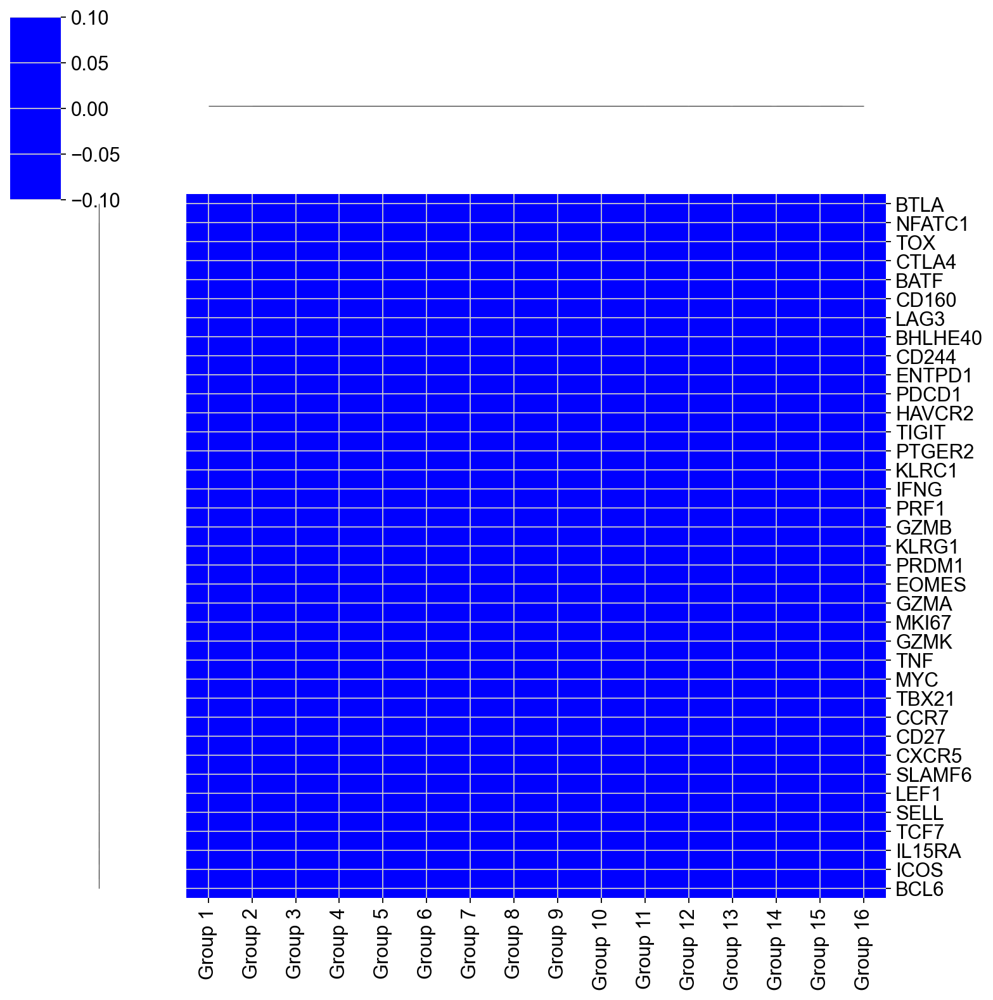

In [122]:
# Ensure that clone_ids and thaw_ids (if available) are Series objects indexed by cell names
clone_ids = pd.Series(clone_ids, index=adata_gex.obs_names)
if thaw_ids is not None:
    thaw_ids = pd.Series(thaw_ids, index=adata_gex.obs_names)

# Label cells in adata_gex based on their group
adata_gex.obs["groups"] = "Other"  # default label

for group_name, criteria in group_combinations.items():
    clone_criteria = criteria['clones']
    thaw_criteria = criteria.get('thaws', [])

    if clone_criteria and thaw_criteria and "thaw" in adata_gex.obs.columns:
        is_in_group = adata_gex.obs["clone_id"].isin(clone_criteria) & adata_gex.obs["thaw"].isin(thaw_criteria)
    elif clone_criteria:
        is_in_group = adata_gex.obs["clone_id"].isin(clone_criteria)
    elif thaw_criteria and "thaw" in adata_gex.obs.columns:
        is_in_group = adata_gex.obs["thaw"].isin(thaw_criteria)
    else:
        continue  # No criteria specified, so we skip this group
    
    adata_gex.obs.loc[is_in_group, "groups"] = group_name

# Initialize an empty matrix to store differential expression metrics
diff_expr_matrix = np.zeros((len(genes_of_interest), len(group_combinations)))

# For each group, perform differential expression
for i, group_name in enumerate(group_combinations.keys()):
    # Subset the data for the current group and the rest
    adata_group = adata_gex[adata_gex.obs["groups"] == group_name]
    adata_rest = adata_gex[adata_gex.obs["groups"] != group_name]
    
    # Concatenate the two datasets with temporary group labels
    adata_combined = adata_group.concatenate(adata_rest, join='outer')
    adata_combined.obs["group"] = ["group"] * len(adata_group) + ["rest"] * len(adata_rest)
    
    # Perform differential expression
    sc.tl.rank_genes_groups(adata_combined, "group", method="wilcoxon", n_genes=len(genes_of_interest))
    
    # Extract log-fold changes for the genes of interest
    lfc = adata_combined.uns["rank_genes_groups"]["logfoldchanges"]
    for j, gene in enumerate(genes_of_interest):
        if gene in lfc.dtype.names:
            diff_expr_matrix[j, i] = lfc[gene]

# Visualize the matrix using a heatmap with dendrograms
sns.clustermap(diff_expr_matrix, row_cluster=True, col_cluster=True, 
               xticklabels=group_combinations.keys(), yticklabels=genes_of_interest, 
               cmap="bwr", center=0)


In [125]:
print(adata_combined.var_names)


Index(['LINC01409', 'KLHL17', 'PLEKHN1', 'C1orf159', 'SCNN1D', 'ACAP3',
       'CCNL2', 'ATAD3B', 'AL645728.1', 'CDK11B',
       ...
       'MT-ATP6', 'MT-CO3', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6',
       'MT-CYB', 'AL354822.1', 'AL592183.1'],
      dtype='object', length=4496)


In [72]:

results = {}

for combo in diff_exp_combinations:
    # Subset data for current combination
    subset_gex = filter_data_for_conditions(mdata, combo["clones"], combo.get("thaws"))
    
    # Check if the subset has a minimum number of cells
    if subset_gex.shape[0] < 10:
        print(f"Skipping {combo['name']} due to insufficient number of cells.")
        continue

    # Add a temporary column for grouping in differential expression
    subset_gex.obs['group'] = combo["name"]
    mdata['gex'].obs['group'] = 'Rest of the data'
    
    # Concatenate the datasets for gex modality
    gex_concatenated = subset_gex.concatenate(mdata['gex'], join='outer')
    
    # Run differential expression analysis
    results[combo["name"]] = differential_expression_analysis(gex_concatenated, 'group')

# Now, 'results' dictionary contains the differential expression results for each combination
for combo_name, result in results.items():
    print(f"Results for {combo_name}:")
    print(result)
    print("\n" + "-"*50 + "\n")


Skipping Clone 19 in M-A3-9th thaw due to insufficient number of cells.
Skipping Clone 19 in M-A3-6th thaw due to insufficient number of cells.
Skipping Clone 19 in M-A3-3rd thaw due to insufficient number of cells.
Skipping Clone 4 in all thaws due to insufficient number of cells.
Skipping Clone 28 in all thaws due to insufficient number of cells.
Skipping Clone 9 in U-A3-4th thaw due to insufficient number of cells.
Skipping Clone 9 in U-A3-7th thaw due to insufficient number of cells.
Skipping Clone 39 in U-A3-7th thaw due to insufficient number of cells.
Skipping Clone 39 in U-A3-10th thaw due to insufficient number of cells.
Skipping Clone 47 in U-A3-10th thaw due to insufficient number of cells.
Skipping Clone 47 in U-A3-7th thaw due to insufficient number of cells.
Skipping Clone 89 in U-A3-7th thaw due to insufficient number of cells.
Skipping Clone 80 + Clone 250 + Clone 352 in all thaws due to insufficient number of cells.
Skipping Clone 530 + Clone 1603 in all thaws due to i

In [ ]:
def filter_gex_for_conditions(adata, clone_conditions, thaw_conditions=None):
    """
    Filters the adata object based on given Clone and Thaw conditions.
    
    Parameters:
    - adata: The AnnData object that contains only the 'gex' modality.
    - clone_conditions: List of clone_ids to filter by.
    - thaw_conditions: List of thaw conditions to filter by. If None, all thaw conditions are considered.
    
    Returns:
    A subset of the adata object.
    """
    gex_subset_condition = adata.obs['clone_id'].isin(clone_conditions)
    if thaw_conditions:
        # Use the 'Thaw' from the 'gex' to further filter
        gex_subset_condition &= adata.obs['Thaw'].isin(thaw_conditions)
    
    return adata[gex_subset_condition]

# Differential Expression Analysis
results_gex = {}

for combo in diff_exp_combinations:
    # Subset data for current combination
    subset_gex = filter_gex_for_conditions(adata_gex_not_filtered, combo["clones"], combo.get("thaws"))
    
    # Check if the subset has a minimum number of cells
    if subset_gex.shape[0] < 10:
        print(f"Skipping {combo['name']} due to insufficient number of cells.")
        continue

    # Add a temporary column for grouping in differential expression
    subset_gex.obs['group'] = combo["name"]
    adata_gex_not_filtered.obs['group'] = 'Rest of the data'
    
    # Concatenate the datasets
    gex_concatenated = subset_gex.concatenate(adata_gex_not_filtered, join='outer')
    
    # Run differential expression analysis
    results_gex[combo["name"]] = differential_expression_analysis(gex_concatenated, 'group')

# Display results
for combo_name, result in results_gex.items():
    print(f"Results for {combo_name}:")
    print(result)
    print("\n" + "-"*50 + "\n")


C:\Users\okatk\AppData\Local\Temp\ipykernel_33396\1087055882.py:33: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset_gex.obs['group'] = combo["name"]
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:06:47)


C:\Users\okatk\AppData\Local\Temp\ipykernel_33396\1087055882.py:33: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset_gex.obs['group'] = combo["name"]
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:03)


C:\Users\okatk\AppData\Local\Temp\ipykernel_33396\1087055882.py:33: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset_gex.obs['group'] = combo["name"]
C:\Users\okatk\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


ranking genes


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extract the expression matrix from the adata_gex_not_filtered object
expression_matrix = adata_gex_not_filtered.X.toarray() if isinstance(adata_gex_not_filtered.X, scipy.sparse.spmatrix) else adata_gex_not_filtered.X

# Convert the matrix to a DataFrame for easier handling
df_expression = pd.DataFrame(expression_matrix, index=adata_gex_not_filtered.obs_names, columns=adata_gex_not_filtered.var_names)

# Create the heatmap with hierarchical clustering
sns.clustermap(df_expression, method='average', cmap='viridis', row_cluster=True, figsize=(10, 10))

plt.show()


In [64]:
def filter_data_for_conditions_updated(adata, clone_conditions, thaw_conditions=None):
    """
    Filters the adata object based on given Clone and Thaw conditions.
    
    Parameters:
    - adata: The AnnData object that contains only the 'gex' modality.
    - clone_conditions: List of clone_ids or combined clone-thaw conditions to filter by.
    - thaw_conditions: List of thaw conditions to filter by. If None, all thaw conditions are considered.
    
    Returns:
    A subset of the adata object.
    """
    
    clone_only_conditions = []
    combined_conditions = []
    
    for condition in clone_conditions:
        if '-' in condition:
            combined_conditions.append(condition.split('-'))
        else:
            clone_only_conditions.append(condition)
    
    # Start with clone-only conditions
    gex_subset_condition = adata.obs['clone_id'].isin(clone_only_conditions)
    
    # Add conditions from combined clone-thaw conditions
    for clone, thaw in combined_conditions:
        condition = (adata.obs['clone_id'] == clone) & (adata.obs['Thaw'] == thaw)
        gex_subset_condition = gex_subset_condition | condition
    
    # If there are additional thaw conditions, add them
    if thaw_conditions:
        gex_subset_condition &= adata.obs['Thaw'].isin(thaw_conditions)
    
    return adata[gex_subset_condition]


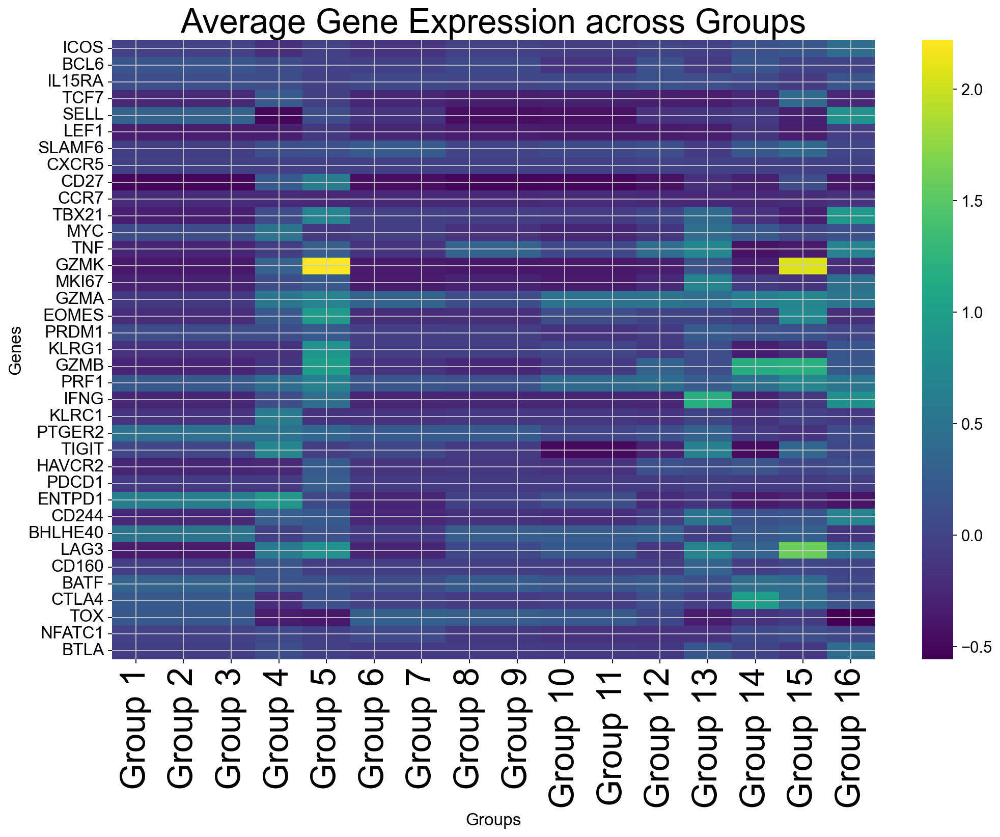

In [147]:
# Define the group combinations based on the provided groups
{
 'Group 4': {'clones': ['4']},
 'Group 5': {'clones': ['28']},
 'Group 3': {'clones': ['19'], 'thaws': ['M-A3-3rd']},
 'Group 2': {'clones': ['19'], 'thaws': ['M-A3-6th']},
 'Group 1': {'clones': ['19'], 'thaws': ['M-A3-9th']},
 'Bin 5': {
   'clones': ['6', '95', '176', '269', '271', '456', '1485', '3313', '3866'],
 },
 'Group 16': {'clones': ['124', '468'], 'thaws': ['Z-A3-1st']},
 'Group 14': {'clones': ['530', '1603']},
 'Group 15': {'clones': ['536'], 'thaws': ['Z-A3-9th']},
 'Group 13': {'clones': ['80', '250', '352']},
 'Group 6': {'clones': ['9'], 'thaws': ['U-A3-4th']},
 'Group 7': {'clones': ['9'], 'thaws': ['U-A3-7th']},
 'Group 12': {'clones': ['89'], 'thaws': ['U-A3-7th']},
 'Group 8': {'clones': ['39'], 'thaws': ['U-A3-7th']},
 'Group 11': {'clones': ['47'], 'thaws': ['U-A3-7th']},
 'Group 10': {'clones': ['47'], 'thaws': ['U-A3-10th']},
 'Group 9': {'clones': ['39'], 'thaws': ['U-A3-10th']}
}


# Initialize an empty DataFrame to store the average expression levels
df_avg_expression = pd.DataFrame(index=genes_of_interest, columns=group_combinations.keys())

# Loop through each group and compute the average expression for each gene of interest
for group_name, group_conditions in group_combinations.items():
    # Filter data based on the current group's clone conditions
    subset_gex = filter_data_for_conditions_updated(adata_gex_not_filtered, group_conditions['clones'])
    
    # Check if the subset is empty
    if subset_gex.shape[0] == 0:
        continue
    
    # Calculate the mean expression for each gene of interest
    avg_expression = subset_gex[:, genes_of_interest].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression[group_name] = avg_expression

# Plot the heatmap
# Plot heatmap with larger font sizes
plt.figure(figsize=(15, 10))
ax = sns.heatmap(df_avg_expression, cmap='viridis', annot=False)  # set annot=False to remove annotations

# Increase font size of x and y labels
ax.set_xlabel("Groups", fontsize=15)
ax.set_ylabel("Genes", fontsize=15)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=30)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=15)

# Increase title font size
plt.title("Average Gene Expression across Groups", fontsize=30)
plt.show()




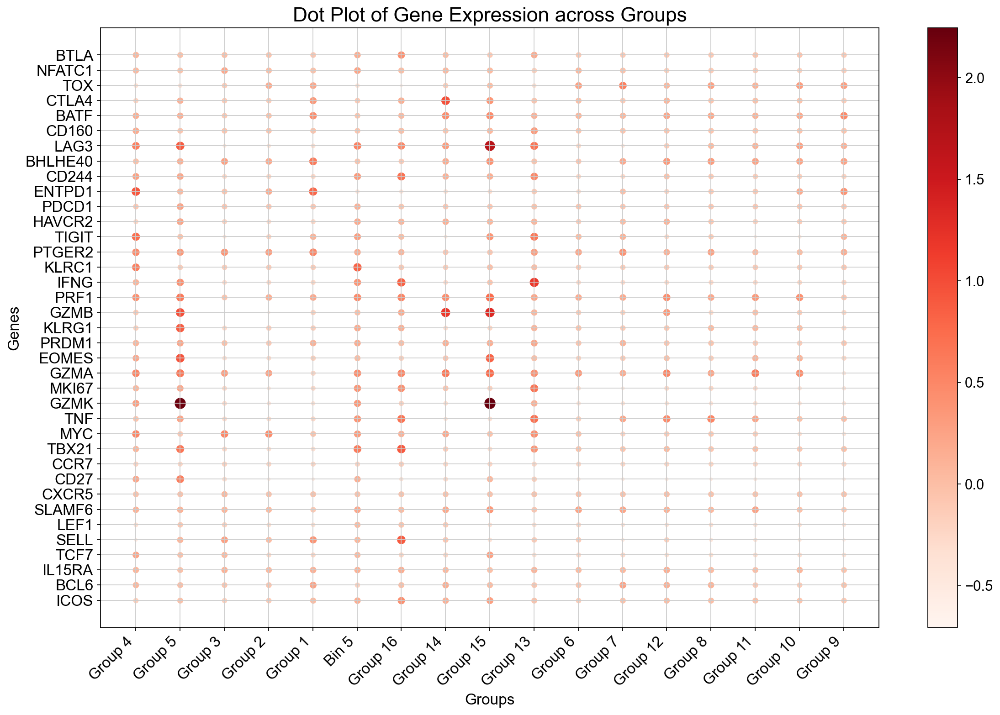

In [153]:
# Define the group combinations based on the provided groups
group_combinations = {
 'Group 4': {'clones': ['4']},
 'Group 5': {'clones': ['28']},
 'Group 3': {'clones': ['19'], 'thaws': ['M-A3-3rd']},
 'Group 2': {'clones': ['19'], 'thaws': ['M-A3-6th']},
 'Group 1': {'clones': ['19'], 'thaws': ['M-A3-9th']},
 'Bin 5': {
   'clones': ['6', '95', '176', '269', '271', '456', '1485', '3313', '3866'],
 },
 'Group 16': {'clones': ['124', '468'], 'thaws': ['Z-A3-1st']},
 'Group 14': {'clones': ['530', '1603']},
 'Group 15': {'clones': ['536'], 'thaws': ['Z-A3-9th']},
 'Group 13': {'clones': ['80', '250', '352']},
 'Group 6': {'clones': ['9'], 'thaws': ['U-A3-4th']},
 'Group 7': {'clones': ['9'], 'thaws': ['U-A3-7th']},
 'Group 12': {'clones': ['89'], 'thaws': ['U-A3-7th']},
 'Group 8': {'clones': ['39'], 'thaws': ['U-A3-7th']},
 'Group 11': {'clones': ['47'], 'thaws': ['U-A3-7th']},
 'Group 10': {'clones': ['47'], 'thaws': ['U-A3-10th']},
 'Group 9': {'clones': ['39'], 'thaws': ['U-A3-10th']}
}

# Initialize an empty DataFrame to store the average expression levels
df_avg_expression = pd.DataFrame(index=genes_of_interest, columns=group_combinations.keys())

# Loop through each group and compute the average expression for each gene of interest
for group_name, group_conditions in group_combinations.items():
    # Filter data based on the current group's clone conditions
    subset_gex = filter_data_for_conditions_updated(adata_gex_not_filtered, group_conditions.get('clones', []), group_conditions.get('thaws', []))
    
    # Check if the subset is empty
    if subset_gex.shape[0] == 0:
        continue
    
    # Calculate the mean expression for each gene of interest
    avg_expression = subset_gex[:, genes_of_interest].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression[group_name] = avg_expression

def plot_dotplot_groups_red(expression_df):
    # Normalize the expression values to set dot sizes
    normalized_values = (expression_df - expression_df.min().min()) / (expression_df.max().max() - expression_df.min().min())
    sizes = normalized_values * 100  # this scales the dot sizes, adjust as needed
    
    # Create the dot plot
    fig, ax = plt.subplots(figsize=(15, 10))
    for i, gene in enumerate(expression_df.index):
        for j, group in enumerate(expression_df.columns):
            ax.scatter(j, i, s=sizes.loc[gene, group], c=[expression_df.loc[gene, group]], cmap='Reds', vmin=expression_df.min().min(), vmax=expression_df.max().max())
    
    # Set the ticks, labels, and title with increased font size
    ax.set_xticks(np.arange(len(expression_df.columns)))
    ax.set_xticklabels(expression_df.columns, rotation=45, ha='right', fontsize=15)
    ax.set_yticks(np.arange(len(expression_df.index)))
    ax.set_yticklabels(expression_df.index, fontsize=15)
    ax.set_xlabel("Groups", fontsize=15)
    ax.set_ylabel("Genes", fontsize=15)
    ax.set_title("Dot Plot of Gene Expression across Groups", fontsize=20)
    plt.colorbar(ax.collections[0], ax=ax, orientation="vertical", cmap='Reds')
    plt.tight_layout()
    plt.show()

# Call the function to create the dot plot with red color
plot_dotplot_groups_red(df_avg_expression)


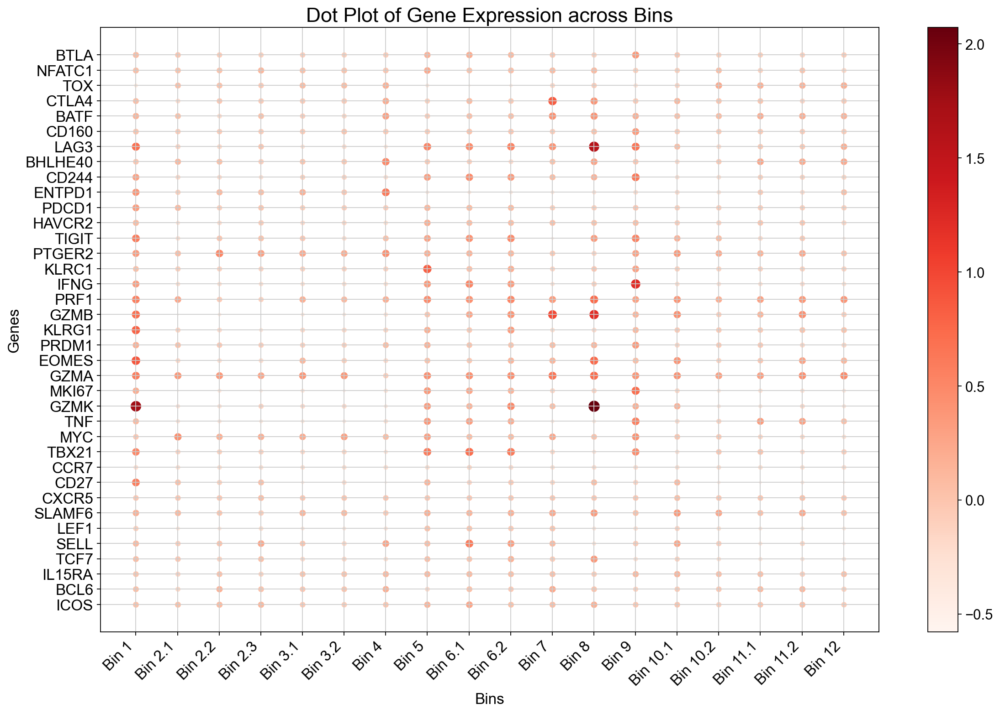

In [152]:
# Define the bins and their associated clone IDs
bins = {
    'Bin 1': ['4', '7', '23', '28', '29', '36', '48', '82', '128', '164', '203', '205', '210', '214', '224', '260', 
              '262', '346', '347', '358', '366', '367', '376', '378', '399', '407', '466', '484', '502', '534', '549', 
              '585', '595', '604', '668', '685', '703', '711', '788', '801', '810', '853', '890', '926', '981', '999', 
              '1041', '1062', '1102', '1122', '1255', '1268', '1315', '1346', '1361', '1420', '1476', '1532', '1607', 
              '1743', '1841', '2003', '2034', '2056', '2199', '2309', '2483', '2566', '2610', '2760', '2818', '3192', 
              '3318', '3805', '4210', '4707'],
    'Bin 2.1': ['46', '650', '427', '1092', '1688'],
    'Bin 2.2': ['68', '323', '665', '935', '2222', '189', '1281', '411', '1291', '756', '144', '283', '625', '1149', 
                '351', '635', '1006', '1059', '1750'],
    'Bin 2.3': ['535', '707', '2205', '2523', '557', '1796', '1367', '2190', '1763', '1021', '1748', '1038'],
    'Bin 3.1': ['14', '312', '43', '1421', '66', '1133'],
    'Bin 3.2': ['483', '610', '64', '1222', '390', '268', '100', '3215', '239', '50', '611', '139', '450', '679', 
                '364', '17', '949', '886', '3193', '370', '227', '480', '618', '222', '1020', '646', '1080', '1154', 
                '91', '452', '547', '643', '763', '1665'],
    'Bin 4': ['19', '697', '1276', '251'],
    'Bin 5': ['6', '95', '176', '269', '271', '456', '1485', '3313', '3866'],
    'Bin 6.1': ['468', '256', '282', '85', '124', '505', '56', '1380', '248', '365', '211', '621', '746', '149', 
                '1182', '1262', '157', '1031', '449', '467', '872', '586', '463', '1393', '2405', '97', '1067', '504', 
                '1356', '2343', '3511', '5', '1673'],
    'Bin 6.2': ['441', '1619', '101', '310', '601', '1645', '1765', '2820', '845', '537', '993', '529', '704', '990', 
                '1130', '508', '677', '802', '6112', '398', '781', '403', '1459', '2238', '153', '712', '989', '3722', 
                '6458', '220', '2024', '385', '196', '202', '327', '515', '126', '3191', '2342', '2066'],
    'Bin 7': ['530', '1603', '1114'],
    'Bin 8': ['536'],
    'Bin 9': ['13', '16', '34', '40', '55', '57', '80', '84', '186', '250', '352', '421', '461', '553', '798', '840', 
              '849', '970', '1034', '1044', '1200', '1594', '1712', '2512', '2915', '3156'],
    'Bin 10.1': ['62', '572', '86', '713'],
    'Bin 10.2': ['9', '18', '1048', '391', '884', '1323', '1965', '65', '3015', '313', '499', '2198'],
    'Bin 11.1': ['81', '306', '24', '39', '89', '1667', '341'],
    'Bin 11.2': ['190', '27', '516', '1241', '780', '287'],
    'Bin 12': ['47', '67', '1162']
}

def plot_dotplot_bins_red(expression_df):
    # Normalize the expression values to set dot sizes
    normalized_values = (expression_df - expression_df.min().min()) / (expression_df.max().max() - expression_df.min().min())
    sizes = normalized_values * 100  # this scales the dot sizes, adjust as needed
    
    # Create the dot plot
    fig, ax = plt.subplots(figsize=(15, 10))
    for i, gene in enumerate(expression_df.index):
        for j, group in enumerate(expression_df.columns):
            ax.scatter(j, i, s=sizes.loc[gene, group], c=[expression_df.loc[gene, group]], cmap='Reds', vmin=expression_df.min().min(), vmax=expression_df.max().max())
    
    # Set the ticks, labels, and title with increased font size
    ax.set_xticks(np.arange(len(expression_df.columns)))
    ax.set_xticklabels(expression_df.columns, rotation=45, ha='right', fontsize=15)
    ax.set_yticks(np.arange(len(expression_df.index)))
    ax.set_yticklabels(expression_df.index, fontsize=15)
    ax.set_xlabel("Bins", fontsize=15)
    ax.set_ylabel("Genes", fontsize=15)
    ax.set_title("Dot Plot of Gene Expression across Bins", fontsize=20)
    plt.colorbar(ax.collections[0], ax=ax, orientation="vertical", cmap='Reds')
    plt.tight_layout()
    plt.show()
    
    
df_avg_expression_bins = pd.DataFrame(index=genes_of_interest, columns=list(bins.keys()))
for bin_name, clone_ids in bins.items():
    subset_gex = filter_data_for_conditions_updated(adata_gex_not_filtered, clone_ids)
    avg_expression = subset_gex[:, genes_of_interest].X.mean(axis=0)
    df_avg_expression_bins[bin_name] = avg_expression

# Plot the dot plot
plot_dotplot_bins_red(df_avg_expression_bins)


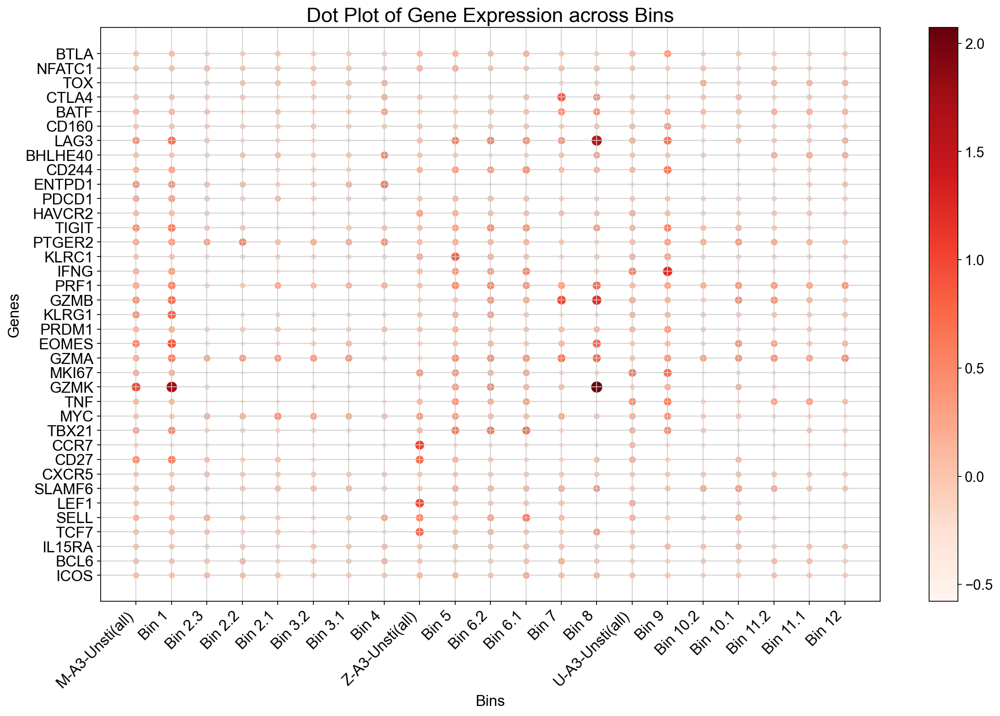

In [201]:
# Define the bins and their associated clone IDs and thaws
# Define the bins and their associated clone IDs and thaws

def filter_data_for_conditions_updated(adata, clone_ids=[], thaws=[]):
    """
    Filter the AnnData object for the given clone IDs and thaws.
    
    Parameters:
    - adata: The AnnData object to filter
    - clone_ids: A list of clone IDs to filter on
    - thaws: A list of thaw conditions to filter on
    
    Returns:
    - A filtered AnnData object
    """
    
    # Create masks for filtering
    mask_clone = (adata.obs['clone_id'].isin(clone_ids) if clone_ids else np.ones(adata.shape[0], dtype=bool))
    mask_thaw = (adata.obs['Thaw'].isin(thaws) if thaws else np.ones(adata.shape[0], dtype=bool))
    
    # Combine masks
    mask = mask_clone & mask_thaw
    
    return adata[mask]


# Rest of the code remains unchanged...

# Define the bins and their associated clone IDs and thaws
# ... [rest of your code, unchanged] ...

bins_updated = {
    'M-A3-Unsti(all)': {'clones': [], 'thaws': ['M-A3-Unsti']},
    'Bin 1': {'clones': ['4', '7', '23', '28', '29', '36', '48', '82', '128', '164', '203', '205', '210', '214', '224', '260', 
              '262', '346', '347', '358', '366', '367', '376', '378', '399', '407', '466', '484', '502', '534', '549', 
              '585', '595', '604', '668', '685', '703', '711', '788', '801', '810', '853', '890', '926', '981', '999', 
              '1041', '1062', '1102', '1122', '1255', '1268', '1315', '1346', '1361', '1420', '1476', '1532', '1607', 
              '1743', '1841', '2003', '2034', '2056', '2199', '2309', '2483', '2566', '2610', '2760', '2818', '3192', 
              '3318', '3805', '4210', '4707'], 'thaws': []},
    'Bin 2.1': {'clones': ['46', '650', '427', '1092', '1688'], 'thaws': []},
    'Bin 2.2': {'clones': ['68', '323', '665', '935', '2222', '189', '1281', '411', '1291', '756', '144', '283', '625', '1149', 
                '351', '635', '1006', '1059', '1750'], 'thaws': []},
    'Bin 2.3': {'clones': ['535', '707', '2205', '2523', '557', '1796', '1367', '2190', '1763', '1021', '1748', '1038'], 'thaws': []},
    'Bin 3.1': {'clones': ['14', '312', '43', '1421', '66', '1133'], 'thaws': []},
    'Bin 3.2': {'clones': ['483', '610', '64', '1222', '390', '268', '100', '3215', '239', '50', '611', '139', '450', '679', 
                '364', '17', '949', '886', '3193', '370', '227', '480', '618', '222', '1020', '646', '1080', '1154', 
                '91', '452', '547', '643', '763', '1665'], 'thaws': []},
    'Bin 4': {'clones': ['19', '697', '1276', '251'], 'thaws': []},
    'Bin 5': {'clones': ['6', '95', '176', '269', '271', '456', '1485', '3313', '3866'], 'thaws': []},
    'Bin 6.1': {'clones': ['468', '256', '282', '85', '124', '505', '56', '1380', '248', '365', '211', '621', '746', '149', 
                '1182', '1262', '157', '1031', '449', '467', '872', '586', '463', '1393', '2405', '97', '1067', '504', 
                '1356', '2343', '3511', '5', '1673'], 'thaws': []},
    'Bin 6.2': {'clones': ['441', '1619', '101', '310', '601', '1645', '1765', '2820', '845', '537', '993', '529', '704', '990', 
                '1130', '508', '677', '802', '6112', '398', '781', '403', '1459', '2238', '153', '712', '989', '3722', 
                '6458', '220', '2024', '385', '196', '202', '327', '515', '126', '3191', '2342', '2066'], 'thaws': []},
    'Bin 7': {'clones': ['530', '1603', '1114'], 'thaws': []},
    'Bin 8': {'clones': ['536'], 'thaws': []},
    'Bin 9': {'clones': ['13', '16', '34', '40', '55', '57', '80', '84', '186', '250', '352', '421', '461', '553', '798', '840', 
              '849', '970', '1034', '1044', '1200', '1594', '1712', '2512', '2915', '3156'], 'thaws': []},
    'Bin 10.1': {'clones': ['62', '572', '86', '713'], 'thaws': []},
    'Bin 10.2': {'clones': ['9', '18', '1048', '391', '884', '1323', '1965', '65', '3015', '313', '499', '2198'], 'thaws': []},
    'Bin 11.1': {'clones': ['81', '306', '24', '39', '89', '1667', '341'], 'thaws': []},
    'Bin 11.2': {'clones': ['190', '27', '516', '1241', '780', '287'], 'thaws': []},
    'Bin 12': {'clones': ['47', '67', '1162'], 'thaws': []},
    'Z-A3-Unsti(all)': {'clones': [], 'thaws': ['Z-A3-Unsti']},
    'U-A3-Unsti(all)': {'clones': [], 'thaws': ['U-A3-Unsti']},
}

bin_order = ['M-A3-Unsti(all)', 'Bin 1', 'Bin 2.3', 'Bin 2.2', 'Bin 2.1', 'Bin 3.2', 'Bin 3.1', 'Bin 4', 'Z-A3-Unsti(all)', 'Bin 5', 
             'Bin 6.2', 'Bin 6.1', 'Bin 7', 'Bin 8', 'U-A3-Unsti(all)', 'Bin 9', 'Bin 10.2', 'Bin 10.1', 'Bin 11.2', 'Bin 11.1', 'Bin 12']

# Create a DataFrame to store average expression levels across the bins
df_avg_expression_bins_updated = pd.DataFrame(index=genes_of_interest, columns=bin_order)

# Loop through each bin and compute the average expression for each gene of interest
for bin_name in bin_order:
    conditions = bins_updated[bin_name]
    clones = conditions.get('clones', [])
    thaws = conditions.get('thaws', [])
    
    subset_gex = filter_data_for_conditions_updated(adata_gex_not_filtered, clones, thaws)
    
    # Skip the current iteration if the subset is empty
    if subset_gex.shape[0] == 0:
        continue
    
    # Calculate the mean expression for each gene of interest
    avg_expression = subset_gex[:, genes_of_interest].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression_bins_updated[bin_name] = avg_expression

# Call the function to create the dot plot with red color
plot_dotplot_bins_red(df_avg_expression_bins_updated)


In [200]:
all_clones_in_bins.discard('thaws')
missing_clones = all_clones_in_bins - set(adata_gex_not_filtered.obs['clone_id'])
print("Missing clones:", missing_clones)


Missing clones: set()


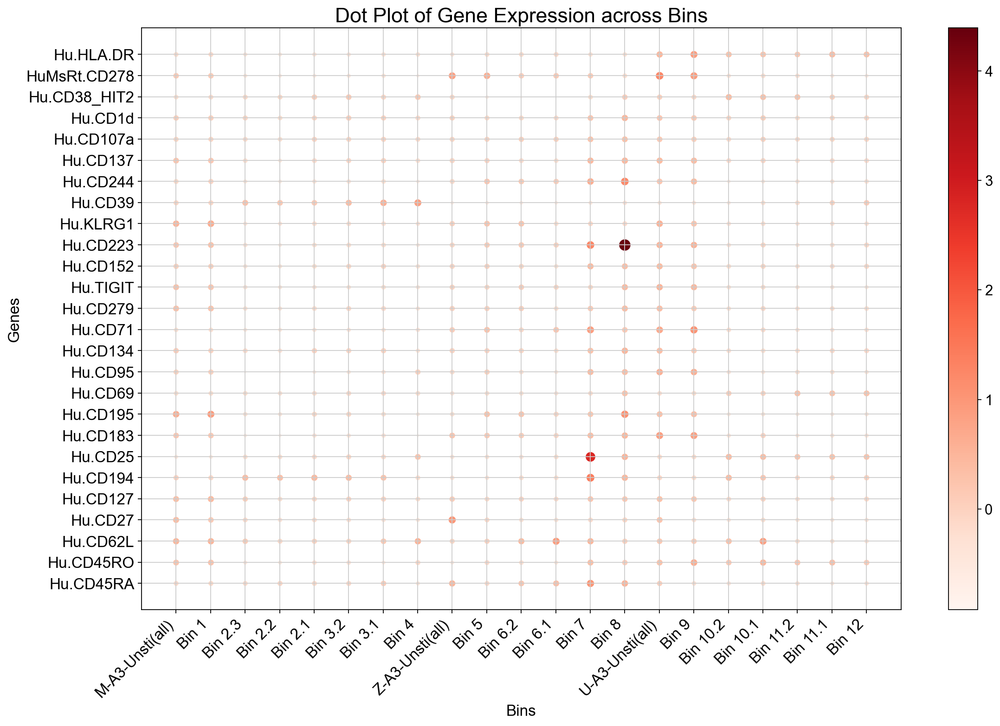

In [209]:
adata_prot = mdata['prot']

# Create a mapping from mdata['airr'] without the 'airr:' prefix
mapping = mdata['airr'].obs['clone_id']
mapping.index = [barcode.replace("airr:", "") for barcode in mdata['airr'].obs_names]

# Assign clone_id to adata_prot using the mapping, without the 'prot:' prefix
adata_prot.obs['clone_id'] = [barcode.replace("prot:", "") for barcode in adata_prot.obs_names]
adata_prot.obs['clone_id'] = adata_prot.obs['clone_id'].map(mapping)

# If 'clone_id' is a categorical column, add 'N/A' to its categories if it's not already there
if pd.api.types.is_categorical_dtype(adata_prot.obs['clone_id']):
    categories = adata_prot.obs['clone_id'].cat.categories.tolist()
    if 'N/A' not in categories:
        categories.append('N/A')
        adata_prot.obs['clone_id'] = adata_prot.obs['clone_id'].cat.set_categories(categories)

# Now you can safely fill NaN values with 'N/A'
adata_prot.obs['clone_id'].fillna('N/A', inplace=True)

genes_of_interest_prot = [
    'Hu.CD45RA', 
    'Hu.CD45RO',
    'Hu.CD62L',
    'Hu.CD27',
    'Hu.CD127',
    'Hu.CD194',
    'Hu.CD25',
    'Hu.CD183',
    'Hu.CD195',
    'Hu.CD69',
    'Hu.CD95',
    'Hu.CD134',
    'Hu.CD71',
    'Hu.CD279',
    'Hu.TIGIT',
    'Hu.CD152',
    'Hu.CD223',
    'Hu.KLRG1',
    'Hu.CD39',
    'Hu.CD244',
    'Hu.CD137',
    'Hu.CD107a',
    'Hu.CD1d',
    'Hu.CD38_HIT2',
    'HuMsRt.CD278',
    'Hu.HLA.DR'
]

df_avg_expression_prot_bins = pd.DataFrame(index=genes_of_interest_prot, columns=bin_order)

# Loop through each bin and compute the average expression for each gene of interest for protein data
for bin_name in bin_order:
    conditions = bins_updated[bin_name]
    clones = conditions.get('clones', [])
    thaws = conditions.get('thaws', [])
    
    subset_prot = filter_data_for_conditions_updated(adata_prot, clones, thaws)
    
    # Skip the current iteration if the subset is empty
    if subset_prot.shape[0] == 0:
        continue
    
    # Calculate the mean expression for each gene of interest
    avg_expression = subset_prot[:, genes_of_interest_prot].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression_prot_bins[bin_name] = avg_expression

# Handle NaN values by replacing them with 0
df_avg_expression_prot_bins.fillna(0, inplace=True)

# Plot the data
plot_dotplot_bins_red(df_avg_expression_prot_bins)


C:\Users\okatk\AppData\Local\Temp\ipykernel_33396\2432563030.py:78: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  cell_counts_group_combinations_prot = pd.Series(index=group_combinations.keys())


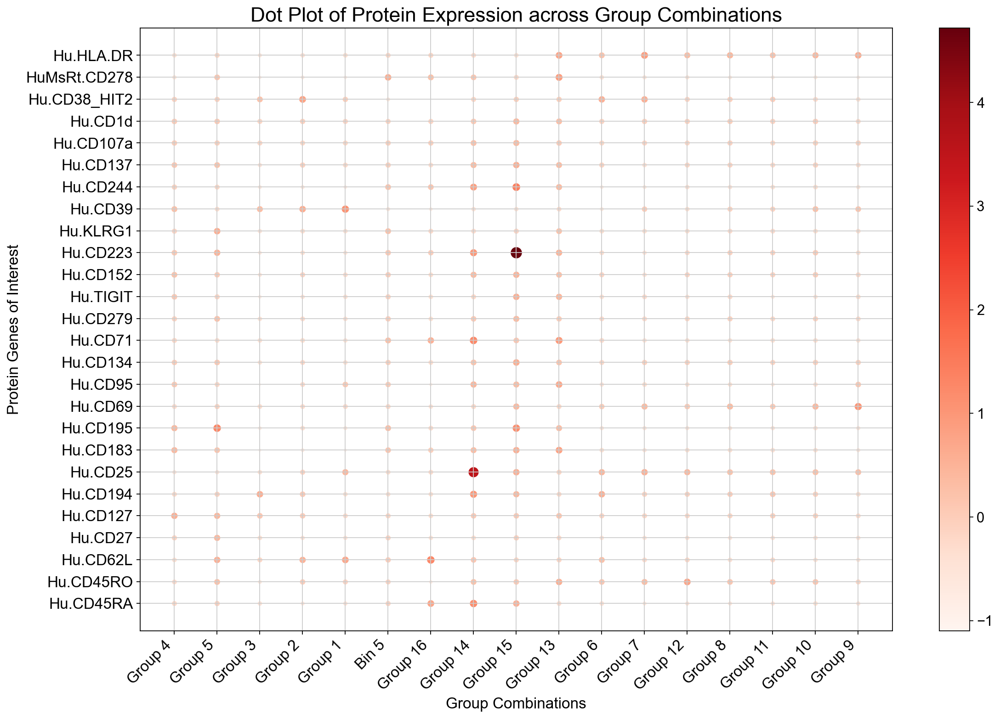

In [214]:
from typing import List, Dict

def filter_data_for_conditions_prot(adata, clone_ids=[], thaws=[]):
    """
    Filter the AnnData object for the given clone IDs and thaws.
    
    Parameters:
    - adata: The AnnData object to filter
    - clone_ids: A list of clone IDs to filter on
    - thaws: A list of thaw conditions to filter on
    
    Returns:
    - A filtered AnnData object
    """
    mask_clone = (adata.obs['clone_id'].isin(clone_ids) if clone_ids else np.ones(adata.shape[0], dtype=bool))
    mask_thaw = (adata.obs['Thaw'].isin(thaws) if thaws else np.ones(adata.shape[0], dtype=bool))
    
    mask = mask_clone & mask_thaw
    return adata[mask]

def plot_dotplot_group_combinations_red_prot(expression_df):
    # Normalize the expression values to set dot sizes
    normalized_values = (expression_df - expression_df.min().min()) / (expression_df.max().max() - expression_df.min().min())
    sizes = normalized_values * 100  # this scales the dot sizes, adjust as needed
    
    # Create the dot plot
    fig, ax = plt.subplots(figsize=(15, 10))
    for i, gene in enumerate(expression_df.index):
        for j, group in enumerate(expression_df.columns):
            ax.scatter(j, i, s=sizes.loc[gene, group], c=[expression_df.loc[gene, group]], cmap='Reds', vmin=expression_df.min().min(), vmax=expression_df.max().max())
    
    # Set the ticks, labels, and title with increased font size
    ax.set_xticks(np.arange(len(expression_df.columns)))
    ax.set_xticklabels(expression_df.columns, rotation=45, ha='right', fontsize=15)
    ax.set_yticks(np.arange(len(expression_df.index)))
    ax.set_yticklabels(expression_df.index, fontsize=15)
    ax.set_xlabel("Group Combinations", fontsize=15)
    ax.set_ylabel("Protein Genes of Interest", fontsize=15)
    ax.set_title("Dot Plot of Protein Expression across Group Combinations", fontsize=20)
    plt.colorbar(ax.collections[0], ax=ax, orientation="vertical", cmap='Reds')
    plt.tight_layout()
    plt.show()


# Define genes of interest for protein
genes_of_interest_prot = [
    'Hu.CD45RA', 
    'Hu.CD45RO',
    'Hu.CD62L',
    'Hu.CD27',
    'Hu.CD127',
    'Hu.CD194',
    'Hu.CD25',
    'Hu.CD183',
    'Hu.CD195',
    'Hu.CD69',
    'Hu.CD95',
    'Hu.CD134',
    'Hu.CD71',
    'Hu.CD279',
    'Hu.TIGIT',
    'Hu.CD152',
    'Hu.CD223',
    'Hu.KLRG1',
    'Hu.CD39',
    'Hu.CD244',
    'Hu.CD137',
    'Hu.CD107a',
    'Hu.CD1d',
    'Hu.CD38_HIT2',
    'HuMsRt.CD278',
    'Hu.HLA.DR'
]


# Assuming 'adata_prot' is your protein data and the mapping has already been done
df_avg_expression_group_combinations_prot = pd.DataFrame(index=genes_of_interest_prot, columns=group_combinations.keys())
cell_counts_group_combinations_prot = pd.Series(index=group_combinations.keys())

# Loop through each group combination and compute the average expression for each gene of interest for protein data
for group_name, conditions in group_combinations.items():
    clones = conditions.get('clones', [])
    thaws = conditions.get('thaws', [])
    
    subset_prot = filter_data_for_conditions_prot(adata_prot, clones, thaws)
    
    # Calculate the mean expression for each gene of interest
    avg_expression = subset_prot[:, genes_of_interest_prot].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression_group_combinations_prot[group_name] = avg_expression
    cell_counts_group_combinations_prot[group_name] = subset_prot.shape[0]

# Handle NaN values by replacing them with 0
df_avg_expression_group_combinations_prot.fillna(0, inplace=True)

# Plot the data
plot_dotplot_group_combinations_red_prot(df_avg_expression_group_combinations_prot)


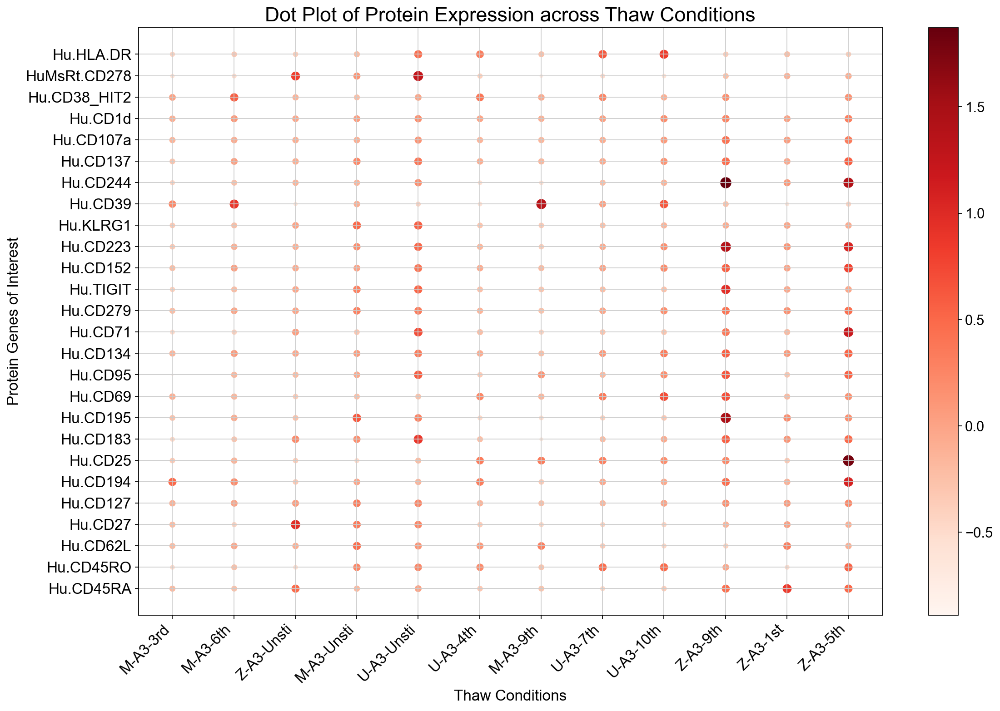

In [216]:
from typing import List, Dict

def filter_data_for_thaw(adata, thaw_condition):
    """
    Filter the AnnData object for the given thaw condition.
    
    Parameters:
    - adata: The AnnData object to filter
    - thaw_condition: The thaw condition to filter on
    
    Returns:
    - A filtered AnnData object
    """
    return adata[adata.obs['Thaw'] == thaw_condition]

def plot_dotplot_thaws_red_prot(expression_df):
    # Normalize the expression values to set dot sizes
    normalized_values = (expression_df - expression_df.min().min()) / (expression_df.max().max() - expression_df.min().min())
    sizes = normalized_values * 100  # this scales the dot sizes, adjust as needed
    
    # Create the dot plot
    fig, ax = plt.subplots(figsize=(15, 10))
    for i, gene in enumerate(expression_df.index):
        for j, thaw in enumerate(expression_df.columns):
            ax.scatter(j, i, s=sizes.loc[gene, thaw], c=[expression_df.loc[gene, thaw]], cmap='Reds', vmin=expression_df.min().min(), vmax=expression_df.max().max())
    
    # Set the ticks, labels, and title with increased font size
    ax.set_xticks(np.arange(len(expression_df.columns)))
    ax.set_xticklabels(expression_df.columns, rotation=45, ha='right', fontsize=15)
    ax.set_yticks(np.arange(len(expression_df.index)))
    ax.set_yticklabels(expression_df.index, fontsize=15)
    ax.set_xlabel("Thaw Conditions", fontsize=15)
    ax.set_ylabel("Protein Genes of Interest", fontsize=15)
    ax.set_title("Dot Plot of Protein Expression across Thaw Conditions", fontsize=20)
    plt.colorbar(ax.collections[0], ax=ax, orientation="vertical", cmap='Reds')
    plt.tight_layout()
    plt.show()

# Define genes of interest for protein
genes_of_interest_prot = [
    'Hu.CD45RA', 
    'Hu.CD45RO',
    'Hu.CD62L',
    'Hu.CD27',
    'Hu.CD127',
    'Hu.CD194',
    'Hu.CD25',
    'Hu.CD183',
    'Hu.CD195',
    'Hu.CD69',
    'Hu.CD95',
    'Hu.CD134',
    'Hu.CD71',
    'Hu.CD279',
    'Hu.TIGIT',
    'Hu.CD152',
    'Hu.CD223',
    'Hu.KLRG1',
    'Hu.CD39',
    'Hu.CD244',
    'Hu.CD137',
    'Hu.CD107a',
    'Hu.CD1d',
    'Hu.CD38_HIT2',
    'HuMsRt.CD278',
    'Hu.HLA.DR'
]

# Extract unique thaw conditions and filter out 'nan'
thaw_conditions = adata_prot.obs['Thaw'].dropna().unique()

# Create DataFrame to store average protein expression for each thaw condition
df_avg_expression_thaws = pd.DataFrame(index=genes_of_interest_prot, columns=thaw_conditions)

# Loop through each thaw condition and compute the average expression for each gene of interest for protein data
for thaw in thaw_conditions:
    subset_prot = filter_data_for_thaw(adata_prot, thaw)
    
    # Calculate the mean expression for each gene of interest
    avg_expression = subset_prot[:, genes_of_interest_prot].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression_thaws[thaw] = avg_expression

# Handle NaN values by replacing them with 0
df_avg_expression_thaws.fillna(0, inplace=True)

# Plot the data
plot_dotplot_thaws_red_prot(df_avg_expression_thaws)


In [190]:
group_combinations_prot = {
 'Group 4': {'clones': ['4']},
 'Group 5': {'clones': ['28']},
 'Group 3': {'clones': ['19'], 'thaws': ['M-A3-3rd']},
 'Group 2': {'clones': ['19'], 'thaws': ['M-A3-6th']},
 'Group 1': {'clones': ['19'], 'thaws': ['M-A3-9th']},
 'Bin 5': {
   'clones': ['6', '95', '176', '269', '271', '456', '1485', '3313', '3866'],
 },
 'Group 16': {'clones': ['124', '468'], 'thaws': ['Z-A3-1st']},
 'Group 14': {'clones': ['530', '1603']},
 'Group 15': {'clones': ['536'], 'thaws': ['Z-A3-9th']},
 'Group 13': {'clones': ['80', '250', '352']},
 'Group 6': {'clones': ['9'], 'thaws': ['U-A3-4th']},
 'Group 7': {'clones': ['9'], 'thaws': ['U-A3-7th']},
 'Group 12': {'clones': ['89'], 'thaws': ['U-A3-7th']},
 'Group 8': {'clones': ['39'], 'thaws': ['U-A3-7th']},
 'Group 11': {'clones': ['47'], 'thaws': ['U-A3-7th']},
 'Group 10': {'clones': ['47'], 'thaws': ['U-A3-10th']},
 'Group 9': {'clones': ['39'], 'thaws': ['U-A3-10th']}
}

# Initialize a DataFrame to store average protein expression levels
df_avg_expression_prot = pd.DataFrame(index=genes_of_interest_prot, columns=group_combinations_prot.keys())

# Loop through each group and compute the average expression for each protein of interest
for group_name, group_conditions in group_combinations_prot.items():
    # Filter data based on the current group's conditions
    subset_prot = filter_data_for_conditions_updated(adata_prot, group_conditions.get('clones', []), group_conditions.get('thaws', []))
    
    # Check if the subset is empty
    if subset_prot.shape[0] == 0:
        continue
    
    # Calculate the mean expression for each protein of interest
    avg_expression = subset_prot[:, genes_of_interest_prot].X.mean(axis=0)
    
    # Store the average expression in the DataFrame
    df_avg_expression_prot[group_name] = avg_expression

# Replace NaN values with 0 in the DataFrame
df_avg_expression_prot.fillna(0, inplace=True)

# Call the function to create the red dot plot
plot_dotplot_groups_red(df_avg_expression_prot)


ValueError: need at least one array to concatenate

<Figure size 1200x800 with 2 Axes>

In [194]:
mdata['prot']

AnnData object with n_obs × n_vars = 59611 × 149
    obs: 'batch', 'percent_mito', 'n_counts', 'n_features', 'louvain', 'Thaw', 'clone_id'
    var: 'gene_ids', 'feature_types', 'mean', 'std'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'Thaw_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [176]:
# Extract gene names from the protein data
prot_gene_names = list(mdata['prot'].var_names)

# Print the first 50 gene names
print(prot_gene_names[:50])

# Print the second 50 gene names
print(prot_gene_names[50:100])

# Print the last 50 gene names
print(prot_gene_names[-50:])


['Hu.CD101', 'Hu.CD103', 'Hu.CD105_43A3', 'Hu.CD107a', 'Hu.CD112', 'Hu.CD119', 'Hu.CD11a', 'Hu.CD11b', 'Hu.CD11c', 'Hu.CD122', 'Hu.CD123', 'Hu.CD124', 'Hu.CD127', 'Hu.CD13', 'Hu.CD134', 'Hu.CD137', 'Hu.CD141', 'Hu.CD146', 'Hu.CD14_M5E2', 'Hu.CD152', 'Hu.CD154', 'Hu.CD155', 'Hu.CD158', 'Hu.CD158b', 'Hu.CD158e1', 'Hu.CD16', 'Hu.CD161', 'Hu.CD163', 'Hu.CD169', 'Hu.CD18', 'Hu.CD183', 'Hu.CD185', 'Hu.CD19', 'Hu.CD194', 'Hu.CD195', 'Hu.CD196', 'Hu.CD1c', 'Hu.CD1d', 'Hu.CD2', 'Hu.CD20_2H7', 'Hu.CD21', 'Hu.CD22', 'Hu.CD223', 'Hu.CD224', 'Hu.CD226_11A8', 'Hu.CD23', 'Hu.CD24', 'Hu.CD244', 'Hu.CD25', 'Hu.CD26']
['Hu.CD267', 'Hu.CD268', 'Hu.CD27', 'Hu.CD270', 'Hu.CD272', 'Hu.CD274', 'Hu.CD279', 'Hu.CD28', 'Hu.CD29', 'Hu.CD303', 'Hu.CD31', 'Hu.CD314', 'Hu.CD319', 'Hu.CD32', 'Hu.CD328', 'Hu.CD33', 'Hu.CD335', 'Hu.CD35', 'Hu.CD352', 'Hu.CD36', 'Hu.CD38_HIT2', 'Hu.CD39', 'Hu.CD3_UCHT1', 'Hu.CD40', 'Hu.CD41', 'Hu.CD42b', 'Hu.CD45RA', 'Hu.CD45RO', 'Hu.CD45_HI30', 'Hu.CD47', 'Hu.CD48', 'Hu.CD49a', 'Hu.CD

In [ ]:
# Define the group combinations based on the provided groups
group_combinations = {
    'Group 1': ['19-M-A3-9th'],
    'Group 2': ['19-M-A3-6th'],
    'Group 3': ['19-M-A3-3rd'],
    'Group 4': ['4'],
    'Group 5': ['28'],
    'Group 6': ['9-U-A3-4th'],
    'Group 7': ['9-U-A3-7th'],
    'Group 8': ['39-U-A3-7th'],
    'Group 9': ['39-U-A3-10th'],
    'Group 10': ['47-U-A3-10th'],
    'Group 11': ['47-U-A3-7th'],
    'Group 12': ['89-U-A3-7th'],
    'Group 13': ['80', '250', '352'],
    'Group 14': ['530', '1603'],
    'Group 15': ['536-Z-A3-9th'],
    'Group 16': ['124-Z-A3-1st', '468']
}

# Loop through each group and visualize the expression of the genes of interest
for group_name, clones in group_combinations.items():
    # Filter data based on the current group's clone conditions
    subset_gex = filter_gex_for_conditions(adata_gex_not_filtered, clones)
    
    # Check if the subset is empty
    if subset_gex.shape[0] == 0:
        print(f"Skipping {group_name} because it's empty.")
        continue
    
    # Extract expression values for the genes of interest
    expression_values = subset_gex[:, genes_of_interest].X
    
    # Check if the extracted expression values are empty
    if expression_values.shape[0] == 0 or expression_values.shape[1] == 0:
        print(f"Skipping {group_name} because extracted expression values are empty.")
        continue

    # Convert to DataFrame for visualization
    df_expression = pd.DataFrame(expression_values, columns=genes_of_interest)
    
    # Check if the DataFrame is empty
    if df_expression.empty:
        print(f"Skipping {group_name} because the DataFrame is empty.")
        continue

    # Create heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(df_expression, cmap='viridis')
    plt.title(f"Heatmap for {group_name}")
    plt.show()


In [ ]:
print(adata_gex_not_filtered.X.shape)


In [ ]:
print(mdata['airr'].obs.columns)


In [ ]:
# List of clones you're interested in
selected_clones_for_ratings = [306, 81, 24, 89, 39, 190, 27, 1667, 516, 1241, 780, 287, 341]

# Filter the clone_secondary_ratings DataFrame to only include the selected clones
filtered_ratings = clone_secondary_ratings[clone_secondary_ratings.index.isin(selected_clones_for_ratings)]

# Print the filtered ratings
print(filtered_ratings)


In [ ]:
# Check if the selected clones are present in the original 'airr' dataset
original_clone_counts = mdata['airr'].obs['clone_id'].value_counts()
selected_clone_counts_in_original = original_clone_counts[original_clone_counts.index.isin(selected_clones_list)]
print(selected_clone_counts_in_original)


In [ ]:
import matplotlib.pyplot as plt

# Loop through each of the 12 bins
for bin_num in range(1, 13):
    # Filter the data to include only the rows belonging to the current bin
    bin_data = clone_bins_ratings[clone_bins_ratings['bin'] == bin_num]
    
    # Check if the bin is empty
    if bin_data.empty:
        print(f'Bin {bin_num} is empty. No graph will be generated for this bin.')
        continue
    
    # Generate a bar graph for the current bin
    plt.figure(figsize=(12, 6))
    plt.bar(bin_data.index, bin_data['rating'])
    plt.title(f'Bin {bin_num}', fontsize=20)  # Increased fontsize for title
    plt.xlabel('Clone ID', fontsize=15)       # Increased fontsize for x-label
    plt.ylabel('Rating', fontsize=15)         # Increased fontsize for y-label
    plt.xticks(fontsize=12)                   # Increased fontsize for x-ticks
    plt.yticks(fontsize=12)                   # Increased fontsize for y-ticks
    plt.show()


In [ ]:
# Reset the index to include clone_id as a column
clone_bins_ratings_reset = clone_bins_ratings.reset_index()

# Save to CSV
clone_bins_ratings_reset.to_csv("clone_data_with_clone_id.csv", index=False)


In [ ]:
import pandas as pd

# Extract the clone_id data
int_clone_ids = mdata['airr'].obs['clone_id'].astype(int).values

# Calculate the frequency of each clone_id
clone_sizes = pd.Series(int_clone_ids).value_counts()

# List of clones you are interested in
selected_clones = [
    47, 67, 1162, 24, 27, 39, 81, 89, 190, 287, 306, 341, 516, 780, 1241, 1667, 
    9, 18, 62, 65, 86, 313, 391, 499, 572, 713, 884, 1048, 1323, 1965, 2198, 3015, 
    13, 16, 34, 40, 55, 57, 80, 84, 186, 250, 352, 421, 461, 553, 798, 840, 849, 
    970, 1034, 1044, 1200, 1594, 1712, 2512, 2915, 3156, 536, 530, 1114, 1603, 5, 
    56, 85, 97, 101, 124, 126, 149, 153, 157, 196, 202, 211, 220, 248, 256, 282, 
    310, 327, 365, 385, 398, 403, 441, 449, 463, 467, 468, 504, 505, 508, 515, 529, 
    537, 586, 601, 621, 677, 704, 712, 746, 781, 802, 845, 872, 989, 990, 993, 1031, 
    1067, 1130, 1182, 1262, 1356, 1380, 1393, 1459, 1619, 1645, 1673, 1765, 2024, 2066, 
    2238, 2342, 2343, 2405, 2820, 3191, 3511, 3722, 6112, 6458, 6, 95, 176, 269, 271, 
    456, 1485, 3313, 3866, 19, 251, 697, 1276, 14, 17, 43, 50, 64, 66, 91, 100, 139, 
    222, 227, 239, 268, 312, 364, 370, 390, 450, 452, 480, 483, 547, 610, 611, 618, 
    643, 646, 679, 763, 886, 949, 1020, 1080, 1133, 1154, 1222, 1421, 1665, 3193, 3215, 
    46, 68, 144, 189, 283, 323, 351, 411, 427, 535, 557, 625, 635, 650, 665, 707, 756, 
    935, 1006, 1021, 1038, 1059, 1092, 1149, 1281, 1291, 1367, 1688, 1748, 1750, 1763, 
    1796, 2190, 2205, 2222, 2523, 4, 7, 23, 28, 29, 36, 48, 82, 128, 164, 203, 205, 210, 
    214, 224, 260, 262, 346, 347, 358, 366, 367, 376, 378, 399, 407, 466, 484, 502, 534, 
    549, 585, 595, 604, 668, 685, 703, 711, 788, 801, 810, 853, 890, 926, 981, 999, 1041, 
    1062, 1102, 1122, 1255, 1268, 1315, 1346, 1361, 1420, 1476, 1532, 1607, 1743, 1841, 
    2003, 2034, 2056, 2199, 2309, 2483, 2566, 2610, 2760, 2818, 3192, 3318, 3805, 4210, 4707
]

# Filter the clone_sizes to only include the selected clones
# Reorder the selected_clone_sizes to match the order of selected_clones
ordered_clone_sizes = selected_clone_sizes.reindex(selected_clones)

# Save to CSV
ordered_clone_sizes.to_csv('ordered_selected_clone_sizes.csv', header=['Size'], index_label='Clone_ID')


In [ ]:
print(type(mdata['airr'].obs['clone_id'].iloc[0]))  # Check the data type of the first clone_id in your dataset
print(type(selected_clones[0]))  # Check the data type of the first value in selected_clones


In [ ]:
import anndata

# 1. Combine datasets using an outer join based on cell names
adata = anndata.concat([mdata['gex'], mdata['prot']], join='outer', index_unique=None, keys=['RNA', 'Protein'], label='modality')

# If, for some reason, the modality column is not created, we can manually create it:
if 'modality' not in adata.obs.columns:
    num_rna_cells = mdata['gex'].shape[0]
    adata.obs['modality'] = ['RNA'] * num_rna_cells + ['Protein'] * (adata.shape[0] - num_rna_cells)

In [ ]:
from collections import Counter

def resolve_duplicates_optimized(names):
    # Count occurrences of each name
    count = Counter(names)
    new_names = []
    name_suffix_count = {}
    
    for name in names:
        if count[name] > 1:
            if name in name_suffix_count:
                name_suffix_count[name] += 1
            else:
                name_suffix_count[name] = 1
            new_names.append(f"{name}_{name_suffix_count[name]}")
        else:
            new_names.append(name)
    
    return new_names

# Resolve duplicates in adata
adata.obs_names = resolve_duplicates(adata.obs_names)

# Handle missing values by filling with zeros
adata.X = adata.X.tocsr()
adata.X.data[np.isnan(adata.X.data)] = 0


In [ ]:




# 2. Initialize empty matrices for RNA_PCA and ADT_PCA in adata's obsm
adata.obsm['RNA_PCA'] = np.zeros((adata.shape[0], mdata['gex'].obsm['X_pca'].shape[1]))
adata.obsm['ADT_PCA'] = np.zeros((adata.shape[0], mdata['prot'].obsm['X_pca'].shape[1]))

# 3. Identify the integer positions of the RNA and Protein cells in adata
rna_positions = np.where(adata.obs['modality'] == 'RNA')[0]
adt_positions = np.where(adata.obs['modality'] == 'Protein')[0]

# 4. Transfer the PCA representations using these integer positions
adata.obsm['RNA_PCA'][rna_positions, :] = mdata['gex'].obsm['X_pca']
adata.obsm['ADT_PCA'][adt_positions, :] = mdata['prot'].obsm['X_pca']




In [ ]:
# 1. Check the Input Data
print("Shape of RNA_PCA:", adata.obsm['RNA_PCA'].shape)
print("Shape of ADT_PCA:", adata.obsm['ADT_PCA'].shape)

# Check if there are any NaN values
print("Number of NaN values in RNA_PCA:", np.isnan(adata.obsm['RNA_PCA']).sum())
print("Number of NaN values in ADT_PCA:", np.isnan(adata.obsm['ADT_PCA']).sum())

# 2. Adjust the n_neighbors parameter
n_neighbors_adjusted = 10

# 3. Execute the pyWNN functions
from pyWNN import pyWNN

# Create a WNN object with adjusted n_neighbors
WNNobj = pyWNN(adata, reps=['RNA_PCA', 'ADT_PCA'], npcs=[30,18], n_neighbors=n_neighbors_adjusted, seed=14)

# Compute the weighted nearest neighbor graph
adata = WNNobj.compute_wnn(adata)

# Compute the UMAP
sc.tl.umap(adata, neighbors_key='WNN')

# Visualize the Joint UMAP
sc.pl.umap(adata, color='modality', title="Joint UMAP of RNA and Protein")


In [ ]:
print("Variance in RNA_PCA:", np.var(adata.obsm['RNA_PCA']))
print("Variance in ADT_PCA:", np.var(adata.obsm['ADT_PCA']))


In [ ]:
# Check for duplicate cell names in mdata['gex']
gex_duplicates = mdata['gex'].obs_names[mdata['gex'].obs_names.duplicated()]
print("Number of duplicate cell names in mdata['gex']:", len(gex_duplicates))

# Check for duplicate cell names in adata
adata_duplicates = adata.obs_names[adata.obs_names.duplicated()]
print("Number of duplicate cell names in adata:", len(adata_duplicates))


In [ ]:
# Check for PCA in RNA data
rna_pca_present = 'X_pca' in mdata['gex'].obsm.keys()

# Check for PCA in protein data
adt_pca_present = 'X_pca' in mdata['prot'].obsm.keys()

print(f"PCA for RNA modality present in mdata['gex']: {rna_pca_present}")
print(f"PCA for protein modality present in mdata['prot']: {adt_pca_present}")


In [ ]:
# Cells present in mdata['gex'] but not in adata
missing_in_adata = mdata['gex'].obs_names[~mdata['gex'].obs_names.isin(adata.obs_names)]

# Cells present in adata but not in mdata['gex']
missing_in_mdata_gex = adata.obs_names[~adata.obs_names.isin(mdata['gex'].obs_names)]

print("Number of cells present in mdata['gex'] but not in adata:", len(missing_in_adata))
print("Number of cells present in adata but not in mdata['gex']:", len(missing_in_mdata_gex))


In [ ]:
import matplotlib.pyplot as plt

# Updated function to filter data based on given Clone and Thaw conditions
def filter_data_for_conditions_updated(adata, clone_conditions, thaw_conditions=None):
    """
    Filters the adata object based on given Clone and Thaw conditions.
    
    Parameters:
    - adata: The AnnData object.
    - clone_conditions: List of clone_ids to filter by.
    - thaw_conditions: List of thaw conditions to filter by. If None, all thaw conditions are considered.
    
    Returns:
    A subset of the adata object.
    """
    gex_subset_condition = adata.obs['clone_id'].isin(clone_conditions)
    if thaw_conditions:
        # Use the 'Thaw' column to further filter
        gex_subset_condition &= adata.obs['Thaw'].isin(thaw_conditions)
    
    return adata[gex_subset_condition]

# Define the groups and their corresponding clones
group_combinations = {
    "Group 1": ["19-M-A3-9th"],
    "Group 2": ["19-M-A3-6th"],
    "Group 3": ["19-M-A3-3rd"],
    "Group 4": ["4"],
    "Group 5": ["28"],
    "Group 6": ["9-U-A3-4th"],
    "Group 7": ["9-U-A3-7th"],
    "Group 8": ["39-U-A3-7th"],
    "Group 9": ["39-U-A3-10th"],
    "Group 10": ["47-U-A3-10th"],
    "Group 11": ["47-U-A3-7th"],
    "Group 12": ["89-U-A3-7th"],
    "Group 13": ["80", "250", "352"],
    "Group 14": ["530", "1603"],
    "Group 15": ["536-Z-A3-9th"],
    "Group 16": ["124-Z-A3-1st", "468"],
}

# Extract the expression values for each group
group_expression_data = {}
for group_name, clones in group_combinations.items():
    subset_data = filter_data_for_conditions_updated(adata_gex_not_filtered, clones)
    expression_values = subset_data[:, genes_of_interest].X
    group_expression_data[group_name] = expression_values

# Visualize the data as heatmaps for each group
for group_name, expression_values in group_expression_data.items():
    df_expression = pd.DataFrame(expression_values, columns=genes_of_interest)
    plt.figure(figsize=(12, 8))
    sns.heatmap(df_expression, cmap='viridis')
    plt.title(f"Heatmap for {group_name}")
    plt.show()
